In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import statsmodels.api as sm
from pandas import ExcelWriter

# 1. Prepare Data

In [3]:
# Data Preparation
def add_sector_name_label(sector_data, name):
    sector_data = sector_data[['Date', 'RET']]
    sector_data['GICS_Sector'] = name  # Setting the sector name dynamically based on input
    
    return sector_data

def regression_find_residual(group):
    X = group[['RET_t-2', 'RET_t-1', 'RET', 'RET_t+2', 'RET_t+1']]
    X = sm.add_constant(X)  
    y = group['RETX'] 
    
    X = X.dropna()
    y = y.loc[X.index]
    
    
    model = sm.OLS(y, X, missing='drop').fit()

    # Add residuals to the group DataFrame
    group['residual'] = model.resid.reindex(group.index).fillna(0) 
    
    return group




stk_dreturn = pd.read_csv('10Y R3000.csv', parse_dates=['date'])
stk_dreturn = stk_dreturn.rename(columns={'date':'Date'})

volume_df = stk_dreturn.pivot_table(index='Date', columns='TICKER', values='VOL', aggfunc='mean')
original_price = stk_dreturn.pivot_table(index='Date', columns='TICKER', values='PRC', aggfunc='mean')
r3000_dreturn = pd.read_excel('rusell member.xlsx')
r3000_dreturn['Ticker'] = r3000_dreturn['Ticker'].str.split().str[0]

stk_dreturn = stk_dreturn[['Date', 'TICKER', 'RETX']]
stk_dreturn = stk_dreturn.rename(columns = {'TICKER':'Ticker'})
stk_dreturn = pd.merge(left=stk_dreturn, right=r3000_dreturn, on='Ticker', how='left')
stk_dreturn = stk_dreturn.dropna(subset = ['GICS Sector'])
cs_dreturn = pd.read_excel('communication service.xlsx', parse_dates=['Date']).rename(columns={'% Change': 'RET'})
cd_dreturn = pd.read_excel('Consumer Discretionary.xlsx').rename(columns={'% Change': 'RET'})
CS_dreturn = pd.read_excel('Consumer Staples.xlsx').rename(columns={'% Change': 'RET'})
en_dreturn = pd.read_excel('energy.xlsx').rename(columns={'% Change': 'RET'})
fi_dreturn = pd.read_excel('financial.xlsx').rename(columns={'% Change': 'RET'})
hc_dreturn = pd.read_excel('health care.xlsx').rename(columns={'% Change': 'RET'})
in_dreturn = pd.read_excel('industrials.xlsx').rename(columns={'% Change': 'RET'})
it_dreturn = pd.read_excel('information technology.xlsx').rename(columns={'% Change': 'RET'})
ma_dreturn = pd.read_excel('material.xlsx').rename(columns={'% Change': 'RET'})
re_dreturn = pd.read_excel('real estate.xlsx').rename(columns={'% Change': 'RET'})
ut_dreturn = pd.read_excel('utility.xlsx').rename(columns={'% Change': 'RET'})



cd_dreturn = add_sector_name_label(cd_dreturn, 'Consumer Discretionary')
cs_dreturn = add_sector_name_label(cs_dreturn, 'Communication Services')
CS_dreturn = add_sector_name_label(CS_dreturn, 'Consumer Staples')
en_dreturn = add_sector_name_label(en_dreturn, 'Energy')
fi_dreturn = add_sector_name_label(fi_dreturn, 'Financials')
hc_dreturn = add_sector_name_label(hc_dreturn, 'Health Care')
in_dreturn = add_sector_name_label(in_dreturn, 'Industrials')
it_dreturn = add_sector_name_label(it_dreturn, 'Information Technology')
ma_dreturn = add_sector_name_label(ma_dreturn, 'Materials')
re_dreturn = add_sector_name_label(re_dreturn, 'Real Estate')
ut_dreturn = add_sector_name_label(ut_dreturn, 'Utilities')
all_sectors = pd.concat([cs_dreturn, cd_dreturn, CS_dreturn, en_dreturn, fi_dreturn, hc_dreturn, in_dreturn, it_dreturn, ma_dreturn, re_dreturn, ut_dreturn])
all_sectors.columns=['Date','RET','GICS Sector']


result = pd.merge(left=stk_dreturn, right=all_sectors, on=['Date','GICS Sector'], how='left')
result = result.drop(columns = ['Price'])
result['RET_t-2'] = result['RET'].shift(2)
result['RET_t-1'] = result['RET'].shift(1)
result['RET_t+2'] = result['RET'].shift(-2)
result['RET_t+1'] = result['RET'].shift(-1)
result = result.iloc[2:-3]
result = result.dropna()


result[['RET_t-2', 'RET_t-1', 'RET', 'RET_t+2', 'RET_t+1', 'RETX']].dtypes
result['RETX'] = pd.to_numeric(result['RETX'], errors='coerce')
result['RETX'] = result['RETX'].dropna()
data = regression_find_residual(result)
data['residual'] = np.log1p(data['residual'])
residual_df = data.pivot_table(index='Date', columns='Ticker', values='residual', aggfunc='mean')
residual_df.drop('2014-01-02',axis=0,inplace=True)
residual_df.drop('2014-01-03',axis=0,inplace=True)
residual_df.dropna(axis=1,inplace = True, how='any')

volume_df.drop('2014-01-02',axis=0,inplace=True)
volume_df.drop('2014-01-03',axis=0,inplace=True)
volume_df.drop('2023-12-27',axis=0,inplace=True)
volume_df.drop('2023-12-28',axis=0,inplace=True)
volume_df.drop('2023-12-29',axis=0,inplace=True)
volume_df.dropna(axis=1,inplace = True, how='any')

original_price.drop('2014-01-02',axis=0,inplace=True)
original_price.drop('2014-01-03',axis=0,inplace=True)
original_price.drop('2023-12-27',axis=0,inplace=True)
original_price.drop('2023-12-28',axis=0,inplace=True)
original_price.drop('2023-12-29',axis=0,inplace=True)
original_price.dropna(axis=1,inplace = True, how='any')

/var/folders/24/vr3g0t6d6rq244s67kr49w780000gn/T/ipykernel_47584/375531975.py:27: DtypeWarning: Columns (8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  stk_dreturn = pd.read_csv('10Y R3000.csv', parse_dates=['date'])
/var/folders/24/vr3g0t6d6rq244s67kr49w780000gn/T/ipykernel_47584/375531975.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sector_data['GICS_Sector'] = name  # Setting the sector name dynamically based on input
/var/folders/24/vr3g0t6d6rq244s67kr49w780000gn/T/ipykernel_47584/375531975.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

In [7]:
vol_copy = volume_df.copy()
volume_df.head()

TICKER,A,AA,AAL,AAN,AAOI,AAON,AAP,AAPL,AAT,AB,...,XYL,YELP,YORW,YUM,Z,ZBRA,ZEUS,ZION,ZTS,ZUMZ
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-06,1777500.0,15093200.0,11183463.0,831500.0,64077.0,113701.0,1030200.0,14820614.0,115800.0,314800.0,...,849400.0,3805300.0,27799.0,2940800.0,1908912.0,214808.0,83093.0,1978932.0,2763400.0,378011.0
2014-01-07,1463200.0,17645200.0,11194035.0,862000.0,49268.0,126474.0,922800.0,11381939.0,103700.0,296000.0,...,611100.0,2778300.0,51742.0,3625900.0,1641930.0,192367.0,36266.0,1322493.0,2338200.0,372771.0
2014-01-08,2659500.0,34935300.0,15518687.0,934200.0,37570.0,163993.0,777200.0,9199689.0,75100.0,233500.0,...,1235000.0,5614600.0,21743.0,4448800.0,1030465.0,199632.0,71598.0,2007108.0,3965900.0,598029.0
2014-01-09,1757600.0,49855100.0,25703084.0,908300.0,42464.0,213761.0,486800.0,9938497.0,143900.0,247800.0,...,760800.0,4292200.0,9264.0,3786100.0,952132.0,122003.0,58634.0,1779227.0,2303300.0,749490.0
2014-01-10,1623300.0,74590700.0,12681397.0,976500.0,48220.0,98947.0,678600.0,10839168.0,75900.0,353900.0,...,955700.0,3728300.0,27057.0,2590200.0,661477.0,157518.0,43557.0,1564628.0,2999900.0,805189.0


In [9]:
ori_copy = original_price.copy()
original_price.tail()

TICKER,A,AA,AAL,AAN,AAOI,AAON,AAP,AAPL,AAT,AB,...,XYL,YELP,YORW,YUM,Z,ZBRA,ZEUS,ZION,ZTS,ZUMZ
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-19,139.78999,32.42,14.30,11.19,23.01,72.36,60.86,196.94000,22.67,32.75,...,111.58,46.82,39.19,130.24001,57.85,269.42001,65.02,43.93,198.08,19.46
2023-12-20,138.17999,30.65,13.98,10.89,20.62,71.78,59.45,194.83000,22.63,31.62,...,109.67,47.60,38.43,129.03999,56.86,261.60999,64.34,42.54,194.63,18.85
2023-12-21,138.94000,32.02,14.35,11.17,20.74,72.39,60.69,194.67999,22.75,31.17,...,111.69,48.24,38.46,129.98000,58.75,265.31000,66.31,43.62,194.66,19.63
2023-12-22,139.57001,33.77,14.31,11.11,20.90,73.41,61.25,193.60001,22.65,31.78,...,112.64,48.43,38.67,130.00000,58.79,269.41000,67.10,44.00,194.98,19.68
2023-12-26,139.81000,33.87,14.11,11.19,22.82,74.15,60.92,193.05000,23.04,31.45,...,113.62,48.19,39.51,130.25999,58.68,275.50000,68.14,44.88,195.50,19.80


In [11]:
resi_copy = residual_df.copy()
residual_df.tail()

Ticker,A,AAL,AAOI,AAON,AAP,AAPL,AAT,ABBV,ABCB,ABG,...,XRX,XYL,YELP,YORW,YUM,ZBRA,ZEUS,ZION,ZTS,ZUMZ
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-19,0.009845,-0.003136,0.019682,0.015436,-0.004082,0.002567,-0.001757,-0.005381,0.012622,0.003785,...,0.020828,0.000513,-0.001844,0.011782,-0.009176,0.007457,0.049860,0.012881,0.000373,0.013523
2023-12-20,0.002800,-0.006255,-0.092867,0.008093,-0.006163,0.004458,0.011248,0.001884,-0.001931,0.000354,...,0.005423,-0.000976,0.016131,0.000398,0.007780,-0.013902,0.004032,-0.014816,-0.003101,-0.014425
2023-12-21,-0.006946,0.015249,-0.005173,-0.002606,0.006063,-0.011820,-0.004339,-0.006510,-0.004319,0.005453,...,0.015149,0.007292,0.001725,-0.000849,-0.007519,0.003158,0.019753,0.016093,-0.012344,0.026255
2023-12-22,-0.000046,-0.006828,0.007666,0.010022,0.016009,-0.005582,-0.007413,0.010763,0.013113,-0.002373,...,-0.003756,0.004479,0.002084,0.002662,0.007040,0.015316,0.005870,0.006813,-0.002941,0.009413
2023-12-26,-0.001090,-0.022046,0.083734,0.002249,-0.009550,-0.007394,0.008774,-0.004885,0.015502,-0.007940,...,0.001355,0.000871,-0.007751,0.014883,-0.002118,0.017918,0.010494,0.015322,-0.000141,0.001980


# 2. model_1

In [8]:
# Data Preparation adjust return
data = pd.read_csv('10Y R3000.csv')
filter_data = data[['date','TICKER','RETX']].copy()
filter_data['date'] = pd.to_datetime(filter_data['date'])
filter_data = filter_data.pivot_table(index='date', columns='TICKER', values='RETX', aggfunc='last')
filter_data.index = pd.to_datetime(filter_data.index)

/var/folders/m5/1lv0wwl56v5_z0xs_83lyc3r0000gn/T/ipykernel_51889/2862750306.py:2: DtypeWarning: Columns (8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('10Y R3000.csv')


In [9]:
# filter_data = data.pivot_table(index='date', columns='TICKER', values='RETX', aggfunc='last')
price_data = data[['date','TICKER','PRC']].copy()
price_data['date'] = pd.to_datetime(price_data['date'])
price_data = price_data.pivot_table(index='date', columns='TICKER', values='PRC', aggfunc='last')
price_data.index = pd.to_datetime(price_data.index)

In [10]:
price_data.head()

TICKER,A,AA,AAC,AAIC,AAL,AAN,AAOI,AAON,AAP,AAPL,...,ZIXI,ZMH,ZN,ZNGA,ZOES,ZOM,ZS,ZTS,ZUMZ,ZWS
date,,,,,,,,,,,,,,,,,,,,,
2014-01-02,56.21,10.53,NaN,NaN,25.360,29.45,14.63,31.69,109.74,553.13000,...,4.57,92.24,1.44,3.950,NaN,NaN,NaN,32.36,26.21,NaN
2014-01-03,56.92,10.57,NaN,NaN,26.540,29.55,14.35,31.68,112.88,540.97998,...,4.54,92.64,1.43,3.970,NaN,NaN,NaN,32.05,26.15,NaN
2014-01-06,56.64,10.53,NaN,NaN,27.030,29.42,14.33,31.17,111.80,543.92999,...,4.56,93.24,1.53,4.040,NaN,NaN,NaN,31.98,26.00,NaN
2014-01-07,57.45,10.54,NaN,NaN,26.905,29.06,14.74,31.62,113.18,540.03748,...,4.63,95.10,1.61,4.145,NaN,NaN,NaN,32.10,26.60,NaN
2014-01-08,58.39,10.83,NaN,NaN,27.630,29.46,14.66,31.76,112.30,543.46002,...,4.88,97.43,1.54,4.180,NaN,NaN,NaN,31.74,26.18,NaN


In [11]:
# Volume data
volume_data = data[['date','TICKER','VOL']].copy()
volume_data['date'] = pd.to_datetime(volume_data['date'])
volume_data = volume_data.pivot_table(index='date', columns='TICKER', values='VOL', aggfunc='last')
volume_data.index = pd.to_datetime(volume_data.index)

In [12]:
volume_data.head()

TICKER,A,AA,AAC,AAIC,AAL,AAN,AAOI,AAON,AAP,AAPL,...,ZIXI,ZMH,ZN,ZNGA,ZOES,ZOM,ZS,ZTS,ZUMZ,ZWS
date,,,,,,,,,,,,,,,,,,,,,
2014-01-02,1916200.0,22298900.0,NaN,NaN,8936614.0,865100.0,22505.0,94161.0,542700.0,8338094.0,...,170656.0,868800.0,42914.0,10924362.0,NaN,NaN,NaN,2576100.0,327519.0,NaN
2014-01-03,1866700.0,12647900.0,NaN,NaN,13693753.0,465900.0,47345.0,67500.0,987700.0,13992006.0,...,164497.0,1288200.0,55046.0,10747738.0,NaN,NaN,NaN,2524900.0,322746.0,NaN
2014-01-06,1777500.0,15093200.0,NaN,NaN,11183463.0,831500.0,64077.0,113701.0,1030200.0,14820614.0,...,220430.0,1415000.0,293773.0,16211602.0,NaN,NaN,NaN,2763400.0,378011.0,NaN
2014-01-07,1463200.0,17645200.0,NaN,NaN,11194035.0,862000.0,49268.0,126474.0,922800.0,11381939.0,...,220190.0,1852600.0,129547.0,29111246.0,NaN,NaN,NaN,2338200.0,372771.0,NaN
2014-01-08,2659500.0,34935300.0,NaN,NaN,15518687.0,934200.0,37570.0,163993.0,777200.0,9199689.0,...,988959.0,1880500.0,79212.0,18524709.0,NaN,NaN,NaN,3965900.0,598029.0,NaN


In [51]:
# Parameters
stock_column = 'AAPL'
window_size = 30  # Number of days in each window
step_size = 15  # Days to slide forward

# Scale the data
scaler = MinMaxScaler()
scaler_vol = MinMaxScaler()
scaled_data = scaler.fit_transform(filter_data[stock_column].values.reshape(-1, 1))
scaled_data_vol = scaler_vol.fit_transform(volume_df[stock_column].values.reshape(-1, 1))


In [63]:
# Parameters
stock_column = 'AAPL'
window_size = 30  # Number of days in each window
step_size = 15  # Days to slide forward

# Scale the data
def scaler(stock_column):
    scaler = MinMaxScaler()
    scaler_vol = MinMaxScaler()
    scaled_data = scaler.fit_transform(residual_df[stock_column].values.reshape(-1, 1))
    scaled_data_vol = scaler_vol.fit_transform(volume_data[stock_column].values.reshape(-1, 1))
    return scaled_data, scaled_data_vol

In [64]:
# Function to create rolling windows safely
def create_rolling_windows(data, window_size=30,step_size=15):
    """Generate rolling windows from the data without going out of range."""
    sequences = []
    for i in range(0, len(data) - window_size + 1,step_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

# Generate rolling windows
rolling_windows_return = create_rolling_windows(scaled_data, window_size, step_size)
rolling_windows_vol = create_rolling_windows(scaled_data_vol, window_size, step_size)

## LSTM

In [15]:
# Define the Autoencoder model
class LSTMAutoencoder(nn.Module):
    def __init__(self, window_size, embed_dim=32, num_heads=4, num_encoder_layers=2, ff_dim=128, activation_fc=F.relu):
        super(LSTMAutoencoder, self).__init__()
        self.activation_fc = activation_fc
        # Input embedding layer
        self.input_layer = nn.Linear(1, embed_dim)

        # Positional encoding
        self.positional_encoding = PositionalEncoding(embed_dim, max_len=window_size)

        # Transformer Encoder layers
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dim_feedforward=ff_dim,
            batch_first=True
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)
        
        self.mu_layer = nn.Linear(embed_dim, 16)
        self.log_var_layer = nn.Linear(embed_dim, 16)
        
        # Multi-Head Attention layer
        self.multihead_attention = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=num_heads, batch_first=True)

        # Decoder LSTM layers
        self.decoder_lstm1 = nn.LSTM(input_size=16, hidden_size=embed_dim, batch_first=True)
        self.decoder_lstm2 = nn.LSTM(input_size=embed_dim, hidden_size=64, batch_first=True)
        self.dropout = nn.Dropout(0.2)

        # Output layer
        self.output_layer = nn.Linear(64, 1)

        
    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5*log_var)
        epsilon = torch.randn_like(std)
        return mu + epsilon * std
    
    def forward(self, x):
        # Input embedding and positional encoding
        x = self.input_layer(x)  # (batch_size, seq_len, embed_dim)
        x = self.positional_encoding(x)  # Add positional encoding

        # Transformer Encoder
        encoder_outputs = self.transformer_encoder(x)  # (batch_size, seq_len, embed_dim)

#         # Multi-Head Attention
#         attn_output, _ = self.multihead_attention(encoder_outputs, encoder_outputs, encoder_outputs)
        mu = self.mu_layer(encoder_outputs)
        mu = torch.relu(mu)
        log_var = self.log_var_layer(encoder_outputs)
        log_var = torch.relu(log_var)
        z = self.reparameterize(mu, log_var)
        

        # Decoder LSTM layers
        lstm_out, _ = self.decoder_lstm1(z)
        lstm_out = self.dropout(lstm_out)
        lstm_out = torch.relu(lstm_out)
        lstm_out, _ = self.decoder_lstm2(lstm_out)
        lstm_out = self.dropout(lstm_out)
        lstm_out = torch.relu(lstm_out)

        # Output layer
        output = self.output_layer(lstm_out)  # (batch_size, seq_len, 1)

        return torch.sigmoid(output), mu, log_var


class PositionalEncoding(nn.Module):
    def __init__(self, embed_dim, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.encoding = torch.zeros(max_len, embed_dim)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, embed_dim, 2).float() * (-torch.log(torch.tensor(10000.0)) / embed_dim))
        self.encoding[:, 0::2] = torch.sin(position * div_term)
        self.encoding[:, 1::2] = torch.cos(position * div_term)
        self.encoding = self.encoding.unsqueeze(0)  # Add batch dimension

    def forward(self, x):
        # Add positional encoding
        seq_len = x.size(1)
        return x + self.encoding[:, :seq_len, :].to(x.device)
    
def vae_loss(reconstructed, original, mu, log_var):
    recon_loss = F.mse_loss(reconstructed, original, reduction='sum')
    kl_loss = -0.5* torch.sum(1+log_var-mu.pow(2)-log_var.exp())
    return recon_loss + kl_loss

In [41]:
def train(rolling_windows, threshold):
    model = LSTMAutoencoder(window_size=window_size)
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Store anomalies and errors
    errors = []
    train_losses = []
    batch_size = 32  
    epochs = 150 

    for epoch in tqdm(range(epochs), desc="Training Epochs"):
        # random pick batch
        batch_indices = random.sample(range(len(rolling_windows) - 1), batch_size)
        X_train_batch = [torch.tensor(rolling_windows[idx], dtype=torch.float32).unsqueeze(0) for idx in batch_indices]
        X_train_batch = torch.cat(X_train_batch, dim=0)  # cat to one batch (batch_size, seq_length, feature_dim)

        # train model
        model.train()
        optimizer.zero_grad()
        output, mu, log_var = model(X_train_batch)
        loss = vae_loss(output, X_train_batch, mu, log_var)
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    for i in tqdm(range(len(rolling_windows) - 1), desc="Evaluating Rolling Windows"):
        test_data = rolling_windows[i + 1]
        X_test = torch.tensor(test_data, dtype=torch.float32).unsqueeze(0)

        # compute seq error
        model.eval()
        with torch.no_grad():
            X_test_pred,_,_ = model(X_test)
            X_test_pred = X_test_pred.squeeze().numpy()
            sequence_error = np.mean(np.abs(test_data - X_test_pred))

        errors.append(sequence_error)

    # Compute error
    sequence_threshold = np.percentile(errors, threshold)
    print(f"Sequence Threshold: {sequence_threshold}")

    # Plot loss 
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label="Training Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training Loss Over Epochs")
    plt.legend()
    plt.show()
    
    anomalies = []
    for i, error in tqdm(enumerate(errors), total=len(errors), desc="Identifying Anomalies"):
        if error > sequence_threshold:
            print(f"Sequence {i} is anomalous with error {error}")

            # Recalculate point-wise errors within the sequence
            X_test = torch.tensor(rolling_windows[i + 1], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                X_test_pred,_,_ = model(X_test)
                X_test_pred = X_test_pred.squeeze().numpy()
            point_errors = np.abs(rolling_windows[i + 1].flatten() - X_test_pred)

            # Set a point-level threshold (mean + 2 * std deviation of point errors)
            point_threshold = np.mean(point_errors) + 2 * np.std(point_errors)

            # Identify individual anomalous points in the sequence
            for j, point_error in enumerate(point_errors):
                if point_error > point_threshold:
                    test_date = filter_data.index[window_size + i * step_size + j]
                    test_value = price_data.loc[test_date, stock_column]
                    anomalies.append((test_date, test_value))

    # Plot the stock prices and detected anomalies
    plt.figure(figsize=(10, 6))
    plt.plot(price_data.index, price_data[stock_column], color='blue', label='Stock Price')

    # Plot anomalies as red 'x' markers
    if anomalies:
        anomaly_dates, anomaly_values = zip(*anomalies)
        plt.scatter(anomaly_dates, anomaly_values, color='red', marker='x', label='Anomalies')

    plt.title(f"{stock_column} Stock Price with Sequence and Point-Level Anomalies")
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return anomalies

In [90]:
def train_combined(stock_column, price_data, threshold, window_size=30, step_size=15):
    
    scaler = MinMaxScaler()
    scaler_vol = MinMaxScaler()
    scaled_data = scaler.fit_transform(residual_df[stock_column].values.reshape(-1, 1))
    scaled_data_vol = scaler_vol.fit_transform(volume_df[stock_column].values.reshape(-1, 1))
    rolling_windows_return = create_rolling_windows(scaled_data, window_size, step_size)
    rolling_windows_volume = create_rolling_windows(scaled_data_vol, window_size, step_size)
    
    # Initialize two models
    model_return = LSTMAutoencoder(window_size=window_size)
    model_volume = LSTMAutoencoder(window_size=window_size)
    optimizer_return = optim.Adam(model_return.parameters(), lr=0.001)
    optimizer_volume = optim.Adam(model_volume.parameters(), lr=0.001)

    # Store errors and losses for both models
    errors_return = []
    errors_volume = []
    train_losses_return = []
    train_losses_volume = []
    batch_size = 32
    epochs = 150

    # Train both models separately
    for epoch in tqdm(range(epochs), desc="Training Epochs"):
        # Randomly sample batches for return
        batch_indices_return = random.sample(range(len(rolling_windows_return) - 1), batch_size)
        X_train_batch_return = [torch.tensor(rolling_windows_return[idx], dtype=torch.float32).unsqueeze(0)
                                for idx in batch_indices_return]
        X_train_batch_return = torch.cat(X_train_batch_return, dim=0)

        # Train return model
        model_return.train()
        optimizer_return.zero_grad()
        output_return, mu_return, log_var_return = model_return(X_train_batch_return)
        loss_return = vae_loss(output_return, X_train_batch_return, mu_return, log_var_return)
        loss_return.backward()
        optimizer_return.step()
        train_losses_return.append(loss_return.item())

        # Randomly sample batches for volume
        batch_indices_volume = random.sample(range(len(rolling_windows_volume) - 1), batch_size)
        X_train_batch_volume = [torch.tensor(rolling_windows_volume[idx], dtype=torch.float32).unsqueeze(0)
                                for idx in batch_indices_volume]
        X_train_batch_volume = torch.cat(X_train_batch_volume, dim=0)

        # Train volume model
        model_volume.train()
        optimizer_volume.zero_grad()
        output_volume, mu_volume, log_var_volume = model_volume(X_train_batch_volume)
        loss_volume = vae_loss(output_volume, X_train_batch_volume, mu_volume, log_var_volume)
        loss_volume.backward()
        optimizer_volume.step()
        train_losses_volume.append(loss_volume.item())

    # Compute errors for both models
    for i in tqdm(range(len(rolling_windows_return) - 1), desc="Evaluating Rolling Windows"):
        # Return model
        test_data_return = rolling_windows_return[i + 1]
        X_test_return = torch.tensor(test_data_return, dtype=torch.float32).unsqueeze(0)
        model_return.eval()
        with torch.no_grad():
            X_test_pred_return, _, _ = model_return(X_test_return)
            X_test_pred_return = X_test_pred_return.squeeze().numpy()
            sequence_error_return = np.mean(np.abs(test_data_return - X_test_pred_return))
        errors_return.append(sequence_error_return)

        # Volume model
        test_data_volume = rolling_windows_volume[i + 1]
        X_test_volume = torch.tensor(test_data_volume, dtype=torch.float32).unsqueeze(0)
        model_volume.eval()
        with torch.no_grad():
            X_test_pred_volume, _, _ = model_volume(X_test_volume)
            X_test_pred_volume = X_test_pred_volume.squeeze().numpy()
            sequence_error_volume = np.mean(np.abs(test_data_volume - X_test_pred_volume))
        errors_volume.append(sequence_error_volume)

    # Normalize errors
    errors_return_normalized = (np.array(errors_return) - np.min(errors_return)) / (np.max(errors_return) - np.min(errors_return)+1e-6)
    errors_volume_normalized = (np.array(errors_volume) - np.min(errors_volume)) / (np.max(errors_volume) - np.min(errors_volume)+1e-6)

    # Combine errors
    combined_scores = 0.5 * errors_return_normalized + 0.5 * errors_volume_normalized

    # Set a threshold for combined scores
    combined_threshold = np.percentile(combined_scores, threshold)
    print(f"Combined Score Threshold: {combined_threshold}")

    # Identify anomalies
    anomalies = []
    for i, score in tqdm(enumerate(combined_scores), total=len(combined_scores), desc="Identifying Combined Anomalies"):
        if score > combined_threshold:
            print(f"Sequence {i} is anomalous with combined score {score}")

            # Recalculate point-wise errors for better anomaly localization
            X_test_return = torch.tensor(rolling_windows_return[i + 1], dtype=torch.float32).unsqueeze(0)
            X_test_volume = torch.tensor(rolling_windows_volume[i + 1], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                X_test_pred_return, _, _ = model_return(X_test_return)
                X_test_pred_volume, _, _ = model_volume(X_test_volume)
            
            X_test_pred_return = X_test_pred_return.squeeze().numpy()
            X_test_pred_volume = X_test_pred_volume.squeeze().numpy()

            point_errors_return = np.abs(rolling_windows_return[i + 1].flatten() - X_test_pred_return)
            point_errors_volume = np.abs(rolling_windows_volume[i + 1].flatten() - X_test_pred_volume)
            
            # Combined point errors
            combined_point_errors = 0.5 * point_errors_return + 0.5 * point_errors_volume
            point_threshold = np.mean(combined_point_errors) + 2 * np.std(combined_point_errors)

            for j, point_error in enumerate(combined_point_errors):
                if point_error > point_threshold:
                    if window_size + i * step_size + j >= len(price_data.index):
                        continue
                    test_date = price_data.index[window_size + i * step_size + j]
                    test_value = price_data.loc[test_date, stock_column]
                    anomalies.append((test_date, test_value))

    # Plot the stock prices and detected anomalies
    plt.figure(figsize=(14, 8))

    # Plot actual stock prices
    plt.plot(price_data.index, price_data[stock_column], color='blue', label='Actual Stock Price')

    # Plot anomalies on top of the stock price curve
    if anomalies:
        anomaly_dates, anomaly_values = zip(*anomalies)
        plt.scatter(anomaly_dates, anomaly_values, color='red', marker='x', label='Anomalies', zorder=5)

    # Add labels, legend, and grid
    plt.title(f"{stock_column} Stock Price with Detected Combined Anomalies")
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.show()

    return anomalies


Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.27it/s]


Combined Score Threshold: 0.3307160077969726


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2011.24it/s]


Sequence 0 is anomalous with combined score 0.43826279994597084
Sequence 1 is anomalous with combined score 0.3355277992224867
Sequence 3 is anomalous with combined score 0.44172973423472284
Sequence 4 is anomalous with combined score 0.408562138953413
Sequence 10 is anomalous with combined score 0.3560849788086222
Sequence 15 is anomalous with combined score 0.3398659546808698
Sequence 24 is anomalous with combined score 0.3336015981686456
Sequence 25 is anomalous with combined score 0.37417746578724176
Sequence 32 is anomalous with combined score 0.3451349142013782
Sequence 37 is anomalous with combined score 0.3769799383315492
Sequence 80 is anomalous with combined score 0.3420873398368612
Sequence 102 is anomalous with combined score 0.3973103200514899
Sequence 103 is anomalous with combined score 0.34290418948448226
Sequence 108 is anomalous with combined score 0.3437758738657054
Sequence 109 is anomalous with combined score 0.5884402520195915
Sequence 110 is anomalous with combin

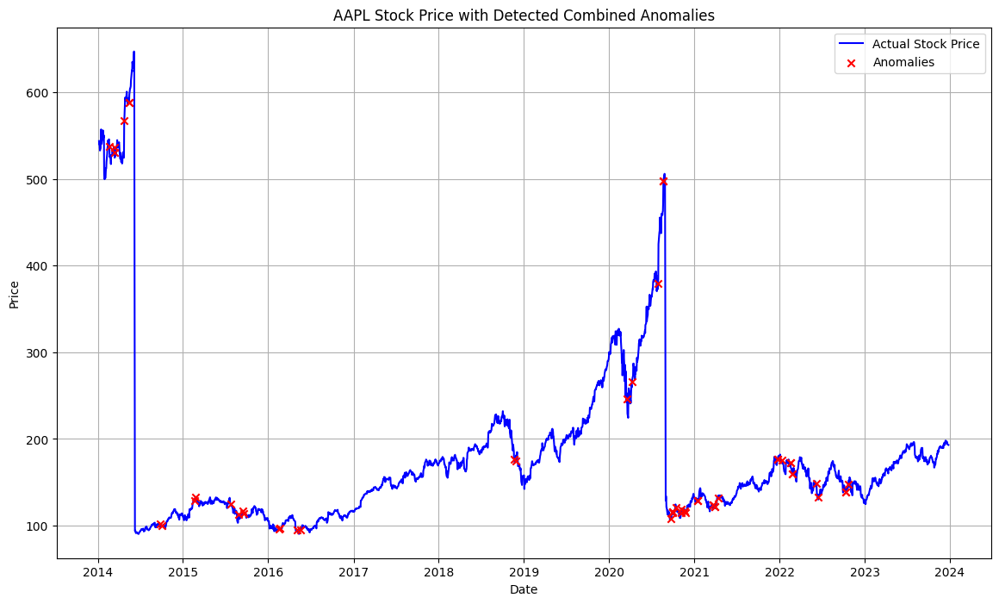

In [68]:
anomalies = train_combined('AAPL', original_price, 80)

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.57it/s]


Combined Score Threshold: 0.34195734927538146


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2027.33it/s]


Sequence 42 is anomalous with combined score 0.5758244923707884
Sequence 43 is anomalous with combined score 0.48657483418954084
Sequence 102 is anomalous with combined score 0.5162061177822879
Sequence 103 is anomalous with combined score 0.5088418217807594
Sequence 104 is anomalous with combined score 0.40171063707750376
Sequence 105 is anomalous with combined score 0.37199809214549495
Sequence 109 is anomalous with combined score 0.35894659730363254
Sequence 112 is anomalous with combined score 0.3676996574567407
Sequence 113 is anomalous with combined score 0.36520292479274885
Sequence 117 is anomalous with combined score 0.34212954198321655
Sequence 121 is anomalous with combined score 0.3638230841418163
Sequence 126 is anomalous with combined score 0.35315188507594997
Sequence 129 is anomalous with combined score 0.3665088765232069
Sequence 130 is anomalous with combined score 0.3553612838534163
Sequence 132 is anomalous with combined score 0.3781718416878256
Sequence 133 is anom

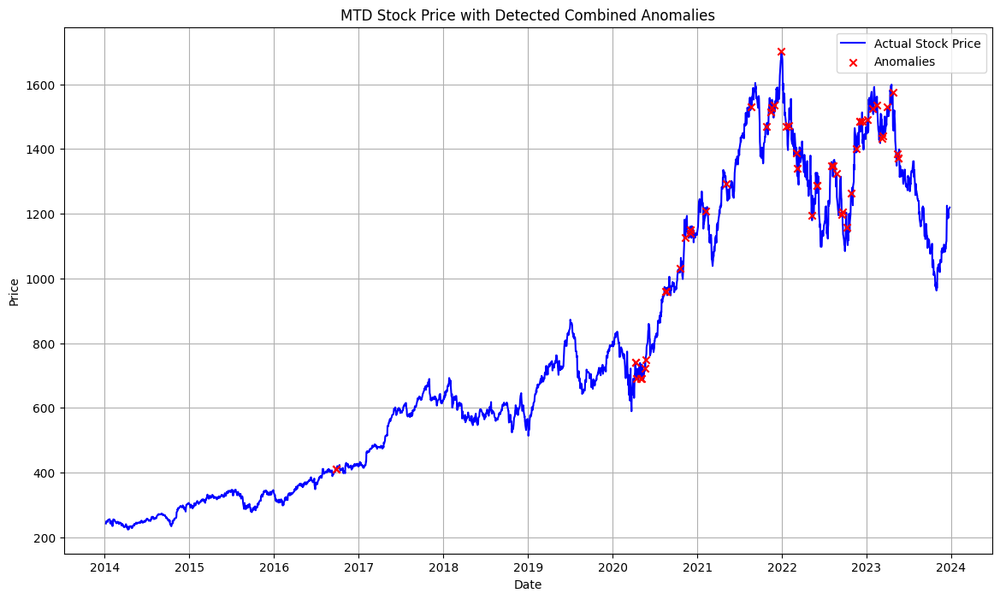

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.04it/s]


Combined Score Threshold: 0.21559601255563546


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1991.63it/s]


Sequence 22 is anomalous with combined score 0.2776718604722462
Sequence 23 is anomalous with combined score 0.25034347213730096
Sequence 26 is anomalous with combined score 0.2206050445676297
Sequence 27 is anomalous with combined score 0.3173507637202013
Sequence 28 is anomalous with combined score 0.29310692831207386
Sequence 33 is anomalous with combined score 0.2631360467296253
Sequence 34 is anomalous with combined score 0.26004614028755074
Sequence 46 is anomalous with combined score 0.2753806978033735
Sequence 47 is anomalous with combined score 0.32334371490604163
Sequence 79 is anomalous with combined score 0.24136294464740776
Sequence 84 is anomalous with combined score 0.5489735940270063
Sequence 85 is anomalous with combined score 0.6122813528541466
Sequence 90 is anomalous with combined score 0.22004201931937753
Sequence 101 is anomalous with combined score 0.27079636374204585
Sequence 102 is anomalous with combined score 0.5582683339218152
Sequence 103 is anomalous with 

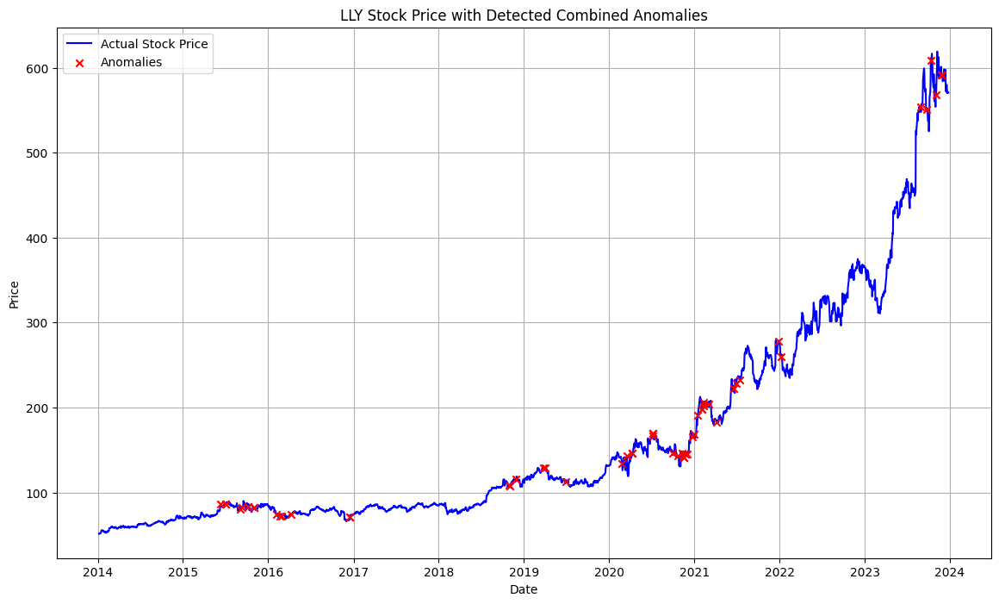

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 417.50it/s]


Combined Score Threshold: 0.3170855618260555


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2015.96it/s]


Sequence 0 is anomalous with combined score 0.5977488877037306
Sequence 1 is anomalous with combined score 0.32218639634857227
Sequence 12 is anomalous with combined score 0.4045369827566226
Sequence 15 is anomalous with combined score 0.33100924019052697
Sequence 32 is anomalous with combined score 0.47435607373850563
Sequence 33 is anomalous with combined score 0.4720379495578406
Sequence 34 is anomalous with combined score 0.3190077488450449
Sequence 46 is anomalous with combined score 0.36761028090734515
Sequence 62 is anomalous with combined score 0.3181157867912968
Sequence 63 is anomalous with combined score 0.34982888252974276
Sequence 101 is anomalous with combined score 0.506987773750389
Sequence 102 is anomalous with combined score 0.9605467095728042
Sequence 103 is anomalous with combined score 0.7260897047844941
Sequence 112 is anomalous with combined score 0.31953342804218426
Sequence 113 is anomalous with combined score 0.5084028022469701
Sequence 114 is anomalous with c

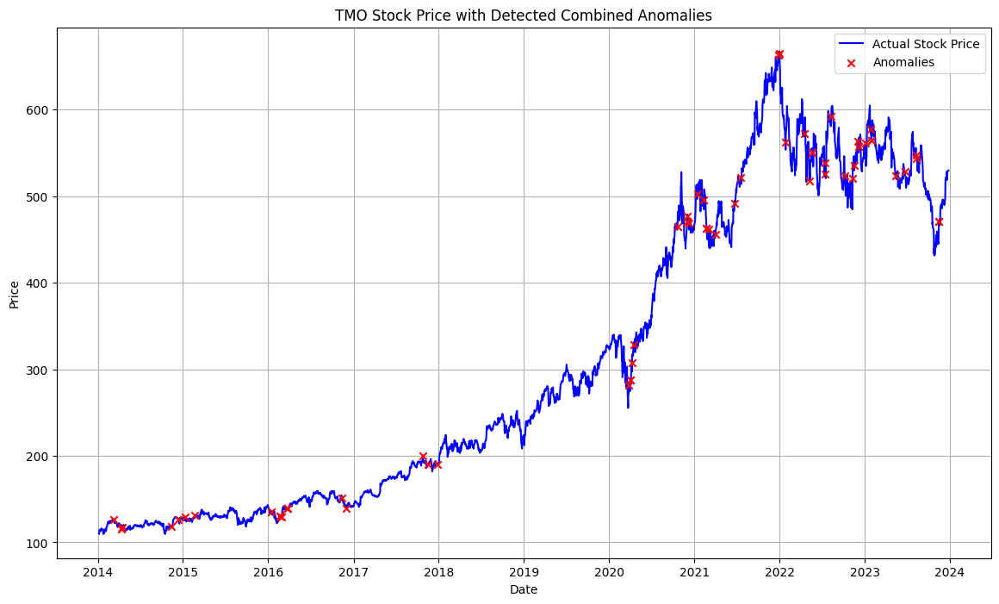

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 421.26it/s]


Combined Score Threshold: 0.2823045518283121


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2077.85it/s]


Sequence 0 is anomalous with combined score 0.7669463275534725
Sequence 1 is anomalous with combined score 0.4624365900765976
Sequence 2 is anomalous with combined score 0.40600878731849444
Sequence 3 is anomalous with combined score 0.35631680945577027
Sequence 7 is anomalous with combined score 0.3758250128994247
Sequence 8 is anomalous with combined score 0.3580799871604078
Sequence 28 is anomalous with combined score 0.31041355708772334
Sequence 72 is anomalous with combined score 0.5656959087862896
Sequence 73 is anomalous with combined score 0.611841139300308
Sequence 101 is anomalous with combined score 0.36444017847662125
Sequence 102 is anomalous with combined score 0.5200554381937994
Sequence 103 is anomalous with combined score 0.45390067651089755
Sequence 104 is anomalous with combined score 0.37303123480278355
Sequence 105 is anomalous with combined score 0.30340038258291
Sequence 108 is anomalous with combined score 0.3044230729647843
Sequence 109 is anomalous with combin

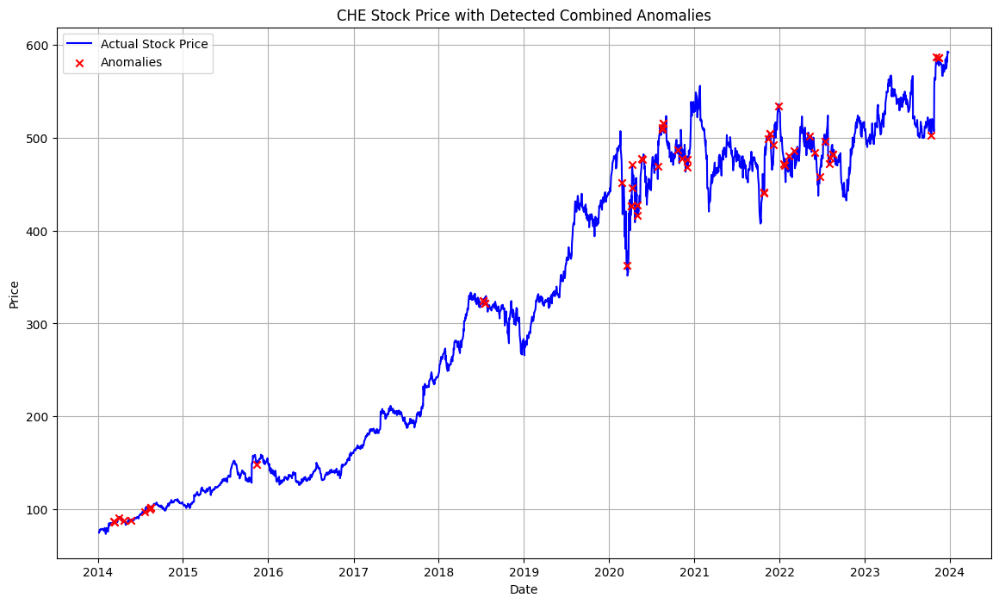

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 428.62it/s]


Combined Score Threshold: 0.22927167331373732


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1819.45it/s]


Sequence 0 is anomalous with combined score 0.23885034514616008
Sequence 1 is anomalous with combined score 0.2727479004374758
Sequence 2 is anomalous with combined score 0.3692085131040054
Sequence 3 is anomalous with combined score 0.2962083168341316
Sequence 15 is anomalous with combined score 0.328893645453818
Sequence 16 is anomalous with combined score 0.2532449916017441
Sequence 23 is anomalous with combined score 0.28463921374656487
Sequence 27 is anomalous with combined score 0.272722698228823
Sequence 28 is anomalous with combined score 0.3167248132170528
Sequence 29 is anomalous with combined score 0.25986097567671873
Sequence 46 is anomalous with combined score 0.2697680809650668
Sequence 47 is anomalous with combined score 0.25482814642041435
Sequence 66 is anomalous with combined score 0.23994742186109264
Sequence 84 is anomalous with combined score 0.30515634245085416
Sequence 85 is anomalous with combined score 0.3047556641027934
Sequence 86 is anomalous with combined s

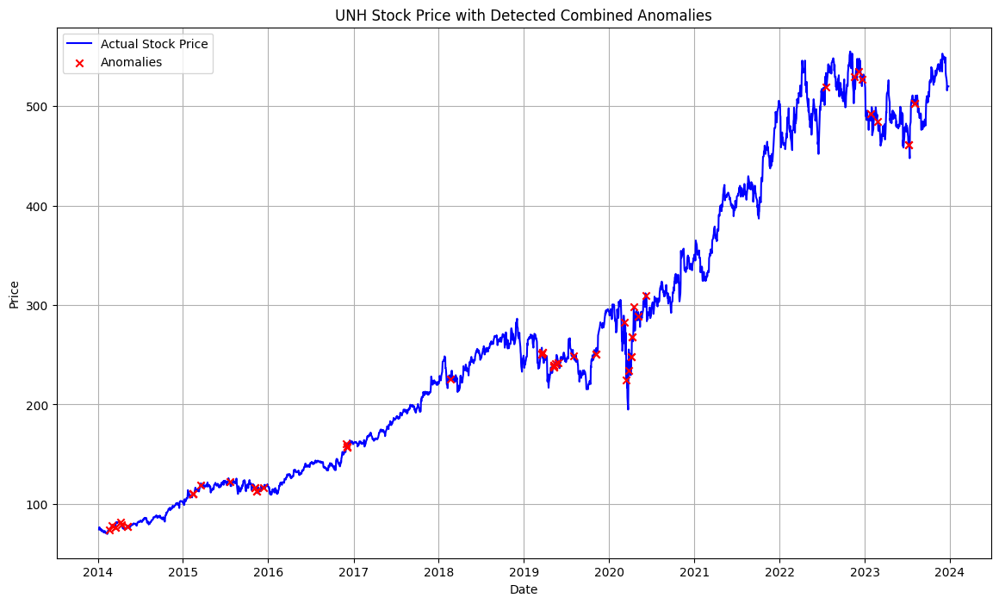

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 417.64it/s]


Combined Score Threshold: 0.33932267170119496


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2116.56it/s]


Sequence 19 is anomalous with combined score 0.43342798891644013
Sequence 20 is anomalous with combined score 0.521151503109397
Sequence 23 is anomalous with combined score 0.4030000273880209
Sequence 24 is anomalous with combined score 0.509075645391889
Sequence 28 is anomalous with combined score 0.41991687348346207
Sequence 29 is anomalous with combined score 0.3666936165099224
Sequence 33 is anomalous with combined score 0.3958296098590958
Sequence 46 is anomalous with combined score 0.35155227706904363
Sequence 48 is anomalous with combined score 0.4885821189406503
Sequence 49 is anomalous with combined score 0.7238113107240456
Sequence 96 is anomalous with combined score 0.3910599337040289
Sequence 101 is anomalous with combined score 0.4826830486201743
Sequence 102 is anomalous with combined score 0.7159609461513357
Sequence 103 is anomalous with combined score 0.4740572794172722
Sequence 105 is anomalous with combined score 0.36210189466730736
Sequence 112 is anomalous with com

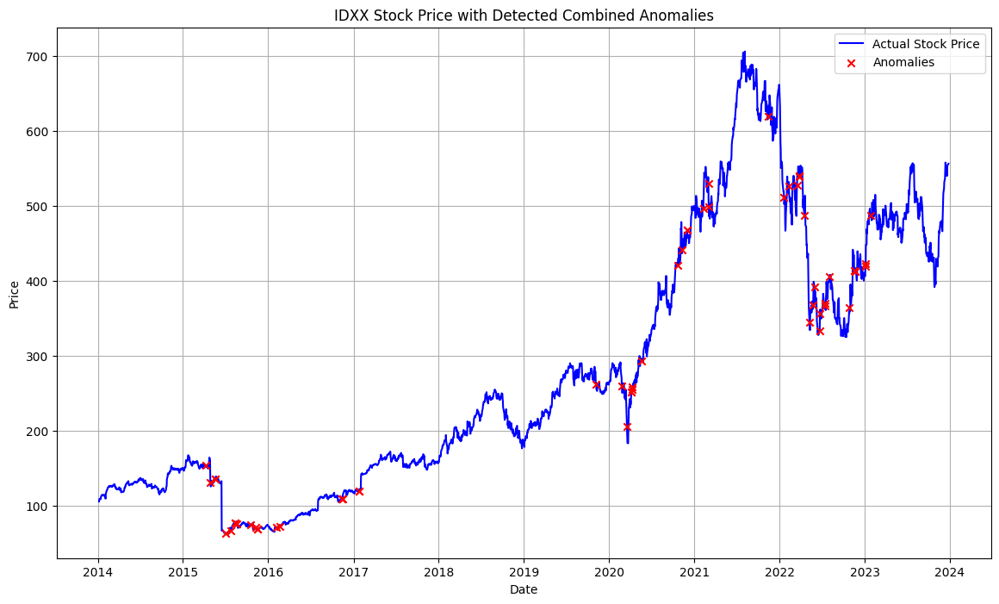

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 417.71it/s]


Combined Score Threshold: 0.20610395432466538


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2065.37it/s]


Sequence 28 is anomalous with combined score 0.252122040924197
Sequence 29 is anomalous with combined score 0.2201264599215676
Sequence 31 is anomalous with combined score 0.22719285547873547
Sequence 32 is anomalous with combined score 0.2931399723322805
Sequence 33 is anomalous with combined score 0.20782733464472014
Sequence 37 is anomalous with combined score 0.20789645594956596
Sequence 45 is anomalous with combined score 0.5165667212226035
Sequence 46 is anomalous with combined score 0.6081323329159034
Sequence 49 is anomalous with combined score 0.22121691442698488
Sequence 50 is anomalous with combined score 0.2192428067642432
Sequence 54 is anomalous with combined score 0.2315164579501137
Sequence 62 is anomalous with combined score 0.27875450757637954
Sequence 63 is anomalous with combined score 0.35485977727403595
Sequence 79 is anomalous with combined score 0.23156209544675405
Sequence 80 is anomalous with combined score 0.2201893597451422
Sequence 81 is anomalous with comb

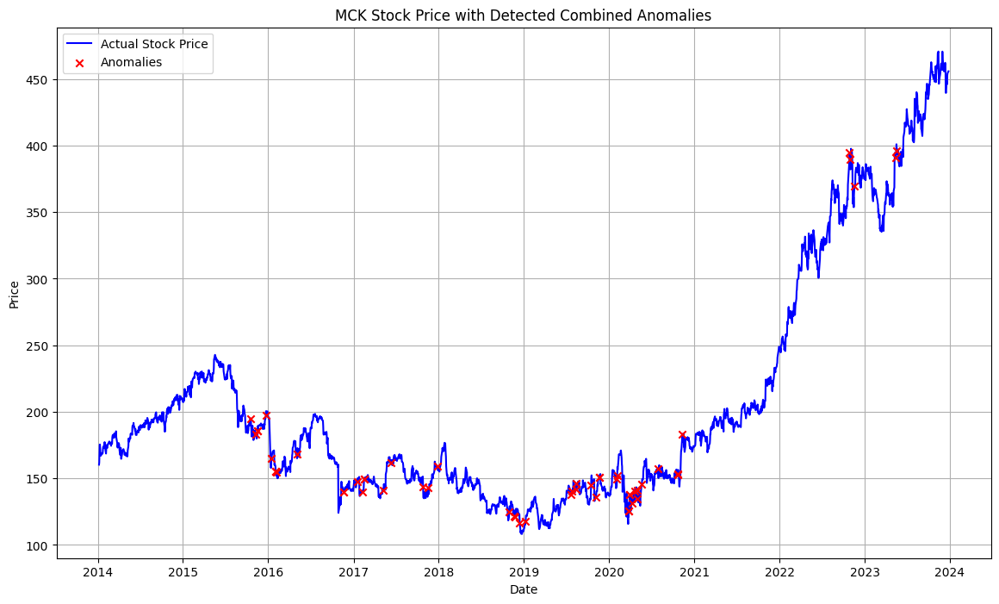

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 423.08it/s]


Combined Score Threshold: 0.37018126541059676


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2112.11it/s]


Sequence 2 is anomalous with combined score 0.5991910355425855
Sequence 3 is anomalous with combined score 0.5076370543685537
Sequence 79 is anomalous with combined score 0.4182525040663396
Sequence 80 is anomalous with combined score 0.37328227345276593
Sequence 102 is anomalous with combined score 0.5421455405609382
Sequence 103 is anomalous with combined score 0.43088292775230264
Sequence 130 is anomalous with combined score 0.3791918505708589
Sequence 131 is anomalous with combined score 0.4854881109366027
Sequence 132 is anomalous with combined score 0.4657409913401618
Sequence 133 is anomalous with combined score 0.643262629129842
Sequence 134 is anomalous with combined score 0.6685558608621509
Sequence 135 is anomalous with combined score 0.5902413825695865
Sequence 136 is anomalous with combined score 0.5771033795751337
Sequence 137 is anomalous with combined score 0.7933871572801863
Sequence 138 is anomalous with combined score 0.8696017941449294
Sequence 139 is anomalous with

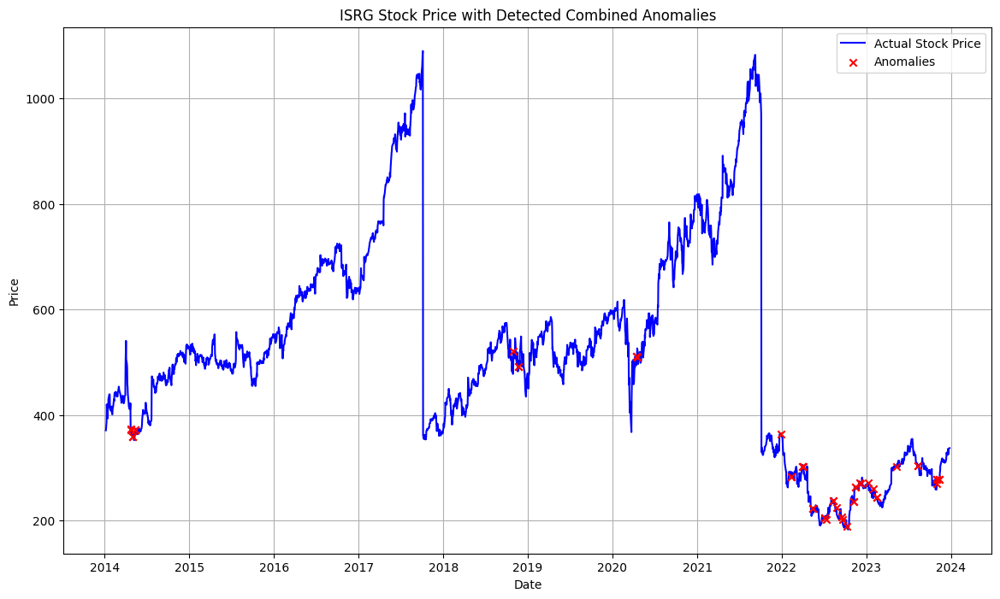

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.12it/s]


Combined Score Threshold: 0.2829611869800703


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2091.26it/s]


Sequence 12 is anomalous with combined score 0.37567492422547005
Sequence 13 is anomalous with combined score 0.3005837040059602
Sequence 15 is anomalous with combined score 0.5865529144207549
Sequence 16 is anomalous with combined score 0.5839578160675902
Sequence 28 is anomalous with combined score 0.3947738528587266
Sequence 29 is anomalous with combined score 0.3172604767020497
Sequence 32 is anomalous with combined score 0.28756079418492836
Sequence 45 is anomalous with combined score 0.3032607408106341
Sequence 46 is anomalous with combined score 0.3527809419374103
Sequence 90 is anomalous with combined score 0.29036501572639795
Sequence 101 is anomalous with combined score 0.35337163925216536
Sequence 102 is anomalous with combined score 0.614607602319475
Sequence 103 is anomalous with combined score 0.544474396786785
Sequence 104 is anomalous with combined score 0.32037521982732636
Sequence 105 is anomalous with combined score 0.3731438389871297
Sequence 108 is anomalous with c

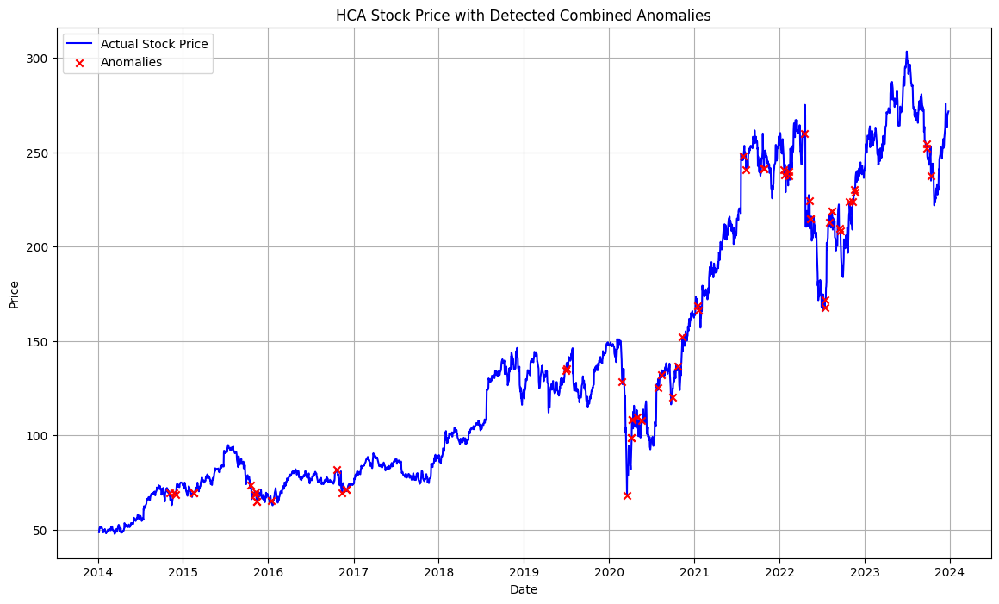

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 415.72it/s]


Combined Score Threshold: 0.17953424898151163


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2079.91it/s]


Sequence 32 is anomalous with combined score 0.30365785361056136
Sequence 33 is anomalous with combined score 0.29502374942875464
Sequence 45 is anomalous with combined score 0.25977355622806886
Sequence 46 is anomalous with combined score 0.3618822965994872
Sequence 72 is anomalous with combined score 0.31039261068361335
Sequence 73 is anomalous with combined score 0.3047926280180616
Sequence 83 is anomalous with combined score 0.19071987594234568
Sequence 84 is anomalous with combined score 0.1825530427425354
Sequence 95 is anomalous with combined score 0.21355110303532787
Sequence 96 is anomalous with combined score 0.19891366886083273
Sequence 101 is anomalous with combined score 0.4661116968684571
Sequence 102 is anomalous with combined score 0.9999940556160235
Sequence 103 is anomalous with combined score 0.7937335155665978
Sequence 104 is anomalous with combined score 0.3821704930897618
Sequence 105 is anomalous with combined score 0.31436966592912113
Sequence 106 is anomalous w

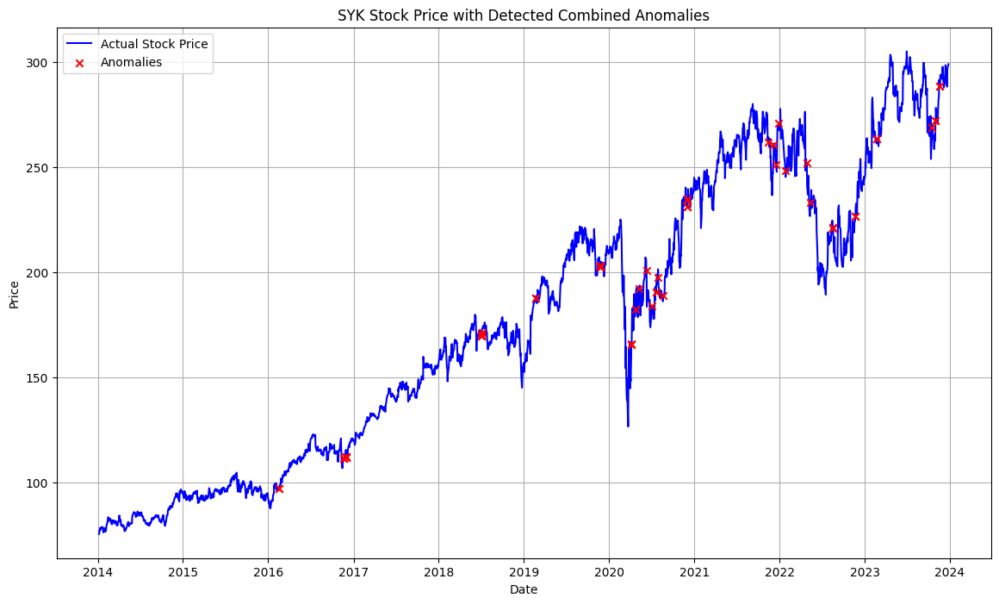

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 412.35it/s]


Combined Score Threshold: 0.2407100803567361


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1912.33it/s]


Sequence 0 is anomalous with combined score 0.2982575941002602
Sequence 24 is anomalous with combined score 0.36651602926945714
Sequence 25 is anomalous with combined score 0.41558423229263536
Sequence 26 is anomalous with combined score 0.24802169075440822
Sequence 27 is anomalous with combined score 0.2538546012833581
Sequence 28 is anomalous with combined score 0.3025566501473176
Sequence 31 is anomalous with combined score 0.2596898268189356
Sequence 32 is anomalous with combined score 0.3204022994579847
Sequence 33 is anomalous with combined score 0.3954358485111997
Sequence 34 is anomalous with combined score 0.3017408376580425
Sequence 83 is anomalous with combined score 0.24356784167097156
Sequence 90 is anomalous with combined score 0.28012163053537287
Sequence 91 is anomalous with combined score 0.5825747191526474
Sequence 92 is anomalous with combined score 0.6193336109863358
Sequence 93 is anomalous with combined score 0.4781674144600281
Sequence 94 is anomalous with combin

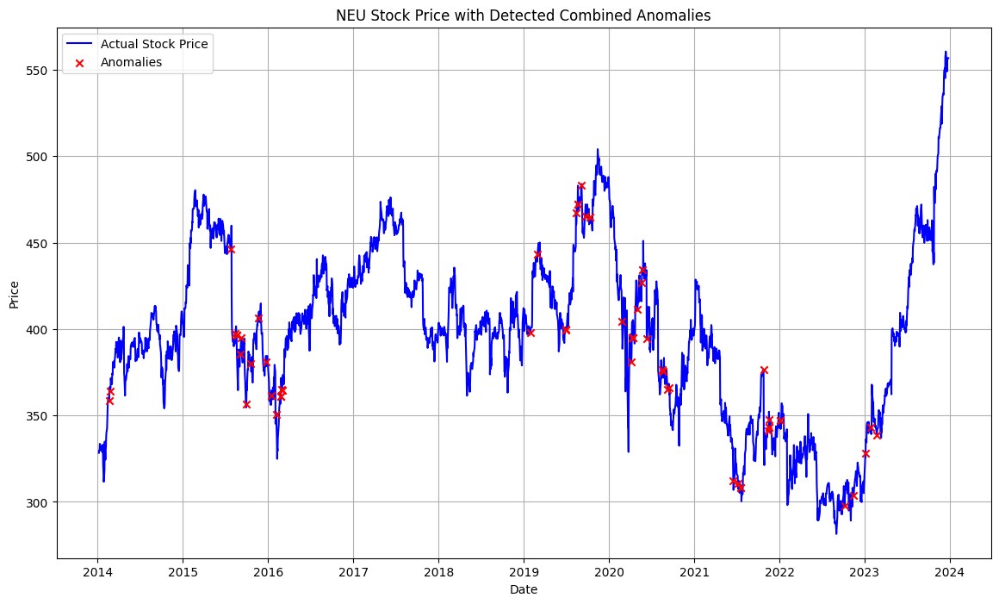

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 411.21it/s]


Combined Score Threshold: 0.24981611719094343


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1863.40it/s]


Sequence 0 is anomalous with combined score 0.2704227069848066
Sequence 3 is anomalous with combined score 0.3274294972482266
Sequence 6 is anomalous with combined score 0.5431995984684417
Sequence 7 is anomalous with combined score 0.5875810495469822
Sequence 11 is anomalous with combined score 0.34820761954886265
Sequence 12 is anomalous with combined score 0.25307032851604194
Sequence 14 is anomalous with combined score 0.28412188279700934
Sequence 16 is anomalous with combined score 0.3440258613894528
Sequence 17 is anomalous with combined score 0.2757883094148993
Sequence 21 is anomalous with combined score 0.27650970304866357
Sequence 27 is anomalous with combined score 0.3658373631426003
Sequence 28 is anomalous with combined score 0.5698906187590953
Sequence 29 is anomalous with combined score 0.40099350595695527
Sequence 31 is anomalous with combined score 0.2874434419909385
Sequence 32 is anomalous with combined score 0.34504247059114646
Sequence 33 is anomalous with combined

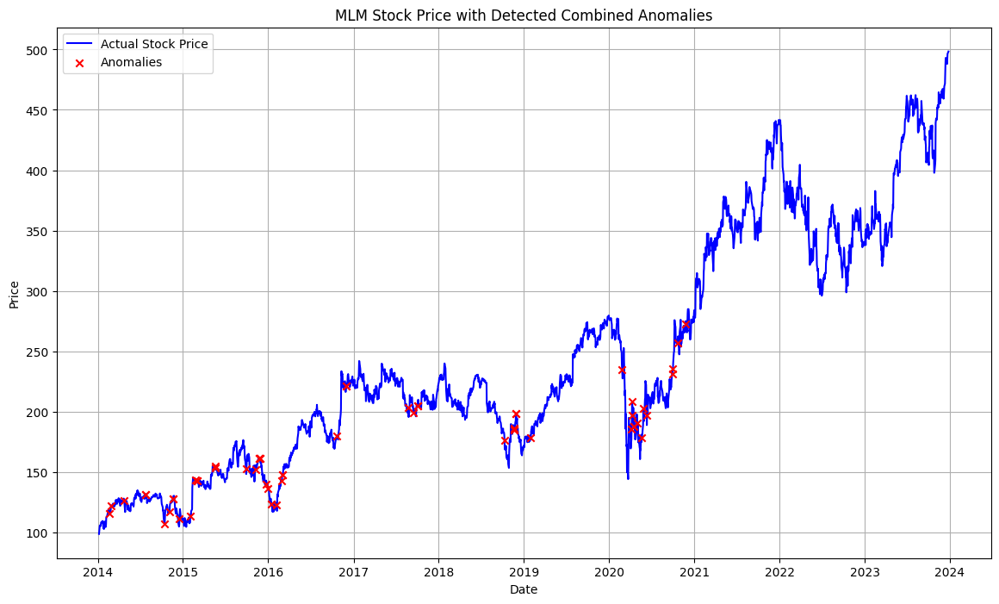

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 394.30it/s]


Combined Score Threshold: 0.3576387709751171


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1869.52it/s]


Sequence 24 is anomalous with combined score 0.36556434545546534
Sequence 27 is anomalous with combined score 0.3786899724072643
Sequence 28 is anomalous with combined score 0.4049682847042664
Sequence 46 is anomalous with combined score 0.3927728247056424
Sequence 102 is anomalous with combined score 0.5761725326500661
Sequence 103 is anomalous with combined score 0.5238683463350181
Sequence 104 is anomalous with combined score 0.3696365580067681
Sequence 105 is anomalous with combined score 0.36720412739813113
Sequence 133 is anomalous with combined score 0.5862279679653298
Sequence 134 is anomalous with combined score 0.5413868871945211
Sequence 135 is anomalous with combined score 0.4840438478320087
Sequence 136 is anomalous with combined score 0.5681133850064534
Sequence 137 is anomalous with combined score 0.7830155484186714
Sequence 138 is anomalous with combined score 0.8837750409036047
Sequence 139 is anomalous with combined score 0.6767836722669294
Sequence 140 is anomalous w

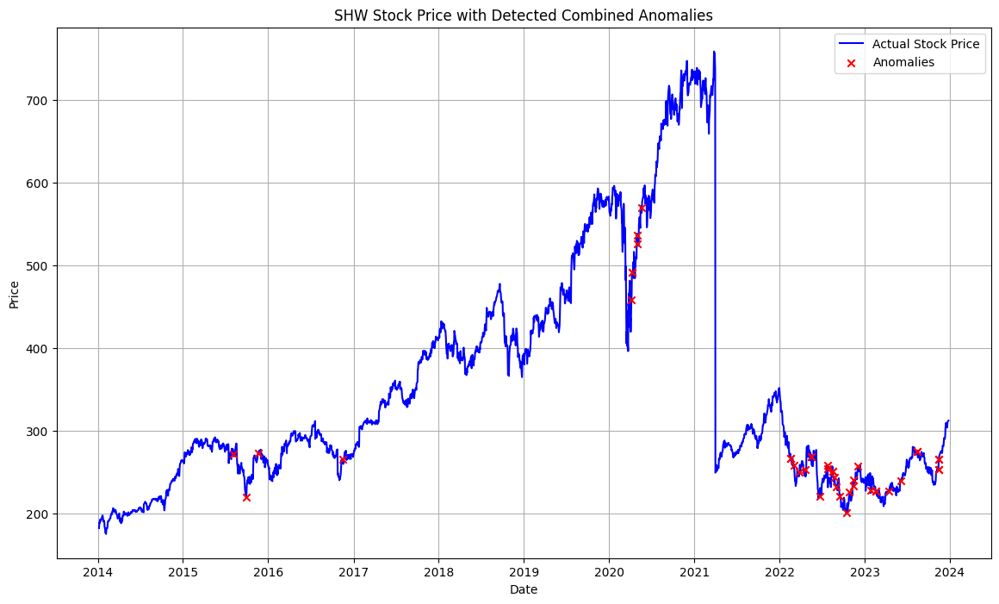

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.45it/s]


Combined Score Threshold: 0.3190906670882174


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2059.31it/s]


Sequence 0 is anomalous with combined score 0.3247785999891102
Sequence 5 is anomalous with combined score 0.3289238312735015
Sequence 9 is anomalous with combined score 0.34405361672231743
Sequence 10 is anomalous with combined score 0.5411819348932035
Sequence 11 is anomalous with combined score 0.5492464797502331
Sequence 12 is anomalous with combined score 0.4399999584948571
Sequence 24 is anomalous with combined score 0.3701257951349369
Sequence 25 is anomalous with combined score 0.39929829153448215
Sequence 30 is anomalous with combined score 0.35854860198108307
Sequence 31 is anomalous with combined score 0.4380711982933374
Sequence 32 is anomalous with combined score 0.5323552053371422
Sequence 33 is anomalous with combined score 0.4731374669688176
Sequence 34 is anomalous with combined score 0.5921054495126405
Sequence 35 is anomalous with combined score 0.6154066389610795
Sequence 43 is anomalous with combined score 0.32389118130321176
Sequence 44 is anomalous with combined 

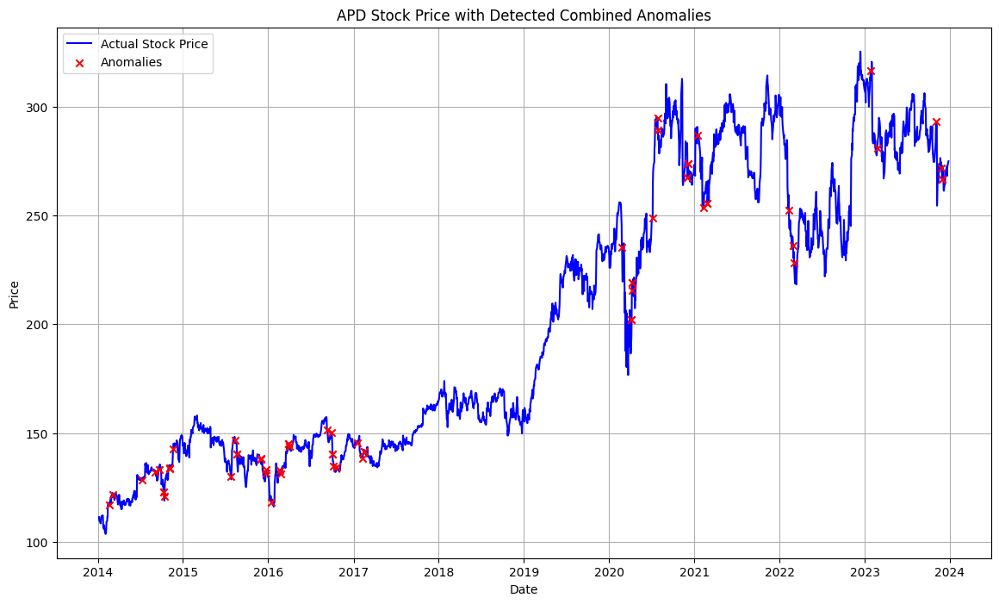

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 419.45it/s]


Combined Score Threshold: 0.39866238737899273


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2070.54it/s]


Sequence 12 is anomalous with combined score 0.4710743324811517
Sequence 14 is anomalous with combined score 0.45014622275700444
Sequence 15 is anomalous with combined score 0.46766060219097694
Sequence 16 is anomalous with combined score 0.461825842017398
Sequence 17 is anomalous with combined score 0.5439823847957779
Sequence 18 is anomalous with combined score 0.627392602438346
Sequence 19 is anomalous with combined score 0.8207220241133453
Sequence 20 is anomalous with combined score 0.4959127157556126
Sequence 24 is anomalous with combined score 0.5340893012732529
Sequence 25 is anomalous with combined score 0.4096214534748624
Sequence 26 is anomalous with combined score 0.4567419988493744
Sequence 27 is anomalous with combined score 0.6183967372346779
Sequence 28 is anomalous with combined score 0.6119928829957024
Sequence 34 is anomalous with combined score 0.5455144357289411
Sequence 35 is anomalous with combined score 0.47705677947743547
Sequence 36 is anomalous with combined 

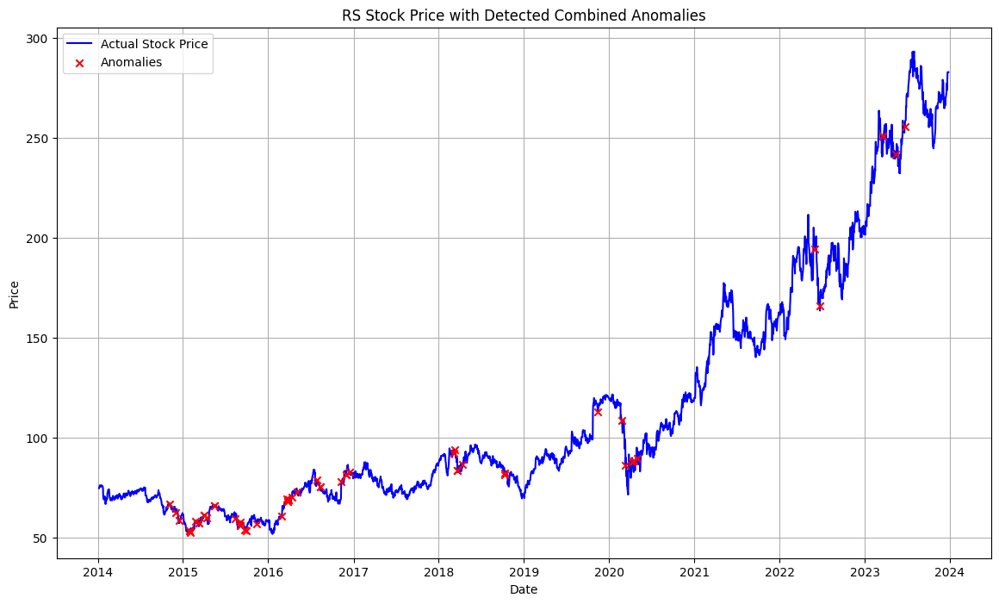

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.89it/s]


Combined Score Threshold: 0.26695266742203166


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2093.33it/s]


Sequence 0 is anomalous with combined score 0.29220530065419503
Sequence 3 is anomalous with combined score 0.2883316390043593
Sequence 4 is anomalous with combined score 0.29916622458715175
Sequence 10 is anomalous with combined score 0.31731187710613573
Sequence 11 is anomalous with combined score 0.6555132182919363
Sequence 12 is anomalous with combined score 0.5524012488967907
Sequence 13 is anomalous with combined score 0.52282305450337
Sequence 14 is anomalous with combined score 0.5484132558030645
Sequence 15 is anomalous with combined score 0.3790214163981843
Sequence 16 is anomalous with combined score 0.34461658846710475
Sequence 17 is anomalous with combined score 0.3468516444403713
Sequence 18 is anomalous with combined score 0.2944196797460999
Sequence 24 is anomalous with combined score 0.3050210693104583
Sequence 25 is anomalous with combined score 0.29865448905105374
Sequence 27 is anomalous with combined score 0.2981685510005295
Sequence 28 is anomalous with combined s

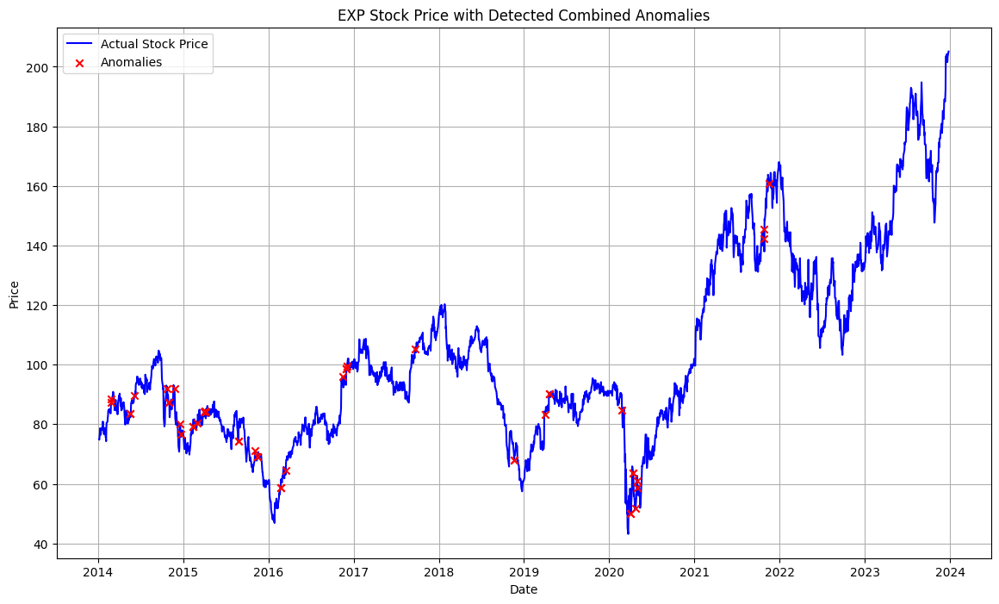

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.33it/s]


Combined Score Threshold: 0.16888706922729999


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2062.37it/s]


Sequence 14 is anomalous with combined score 0.16907274159278207
Sequence 33 is anomalous with combined score 0.21783479530341315
Sequence 34 is anomalous with combined score 0.22201135608446781
Sequence 79 is anomalous with combined score 0.176838713247358
Sequence 80 is anomalous with combined score 0.17359884869811765
Sequence 89 is anomalous with combined score 0.2012223153316415
Sequence 90 is anomalous with combined score 0.19139956547296794
Sequence 101 is anomalous with combined score 0.2921633241043637
Sequence 102 is anomalous with combined score 0.5761770782179247
Sequence 103 is anomalous with combined score 0.47365596890550155
Sequence 104 is anomalous with combined score 0.22340098201076464
Sequence 105 is anomalous with combined score 0.6253587349734016
Sequence 106 is anomalous with combined score 0.6524991866710096
Sequence 107 is anomalous with combined score 0.17291634785048587
Sequence 108 is anomalous with combined score 0.17767558596988317
Sequence 109 is anomalou

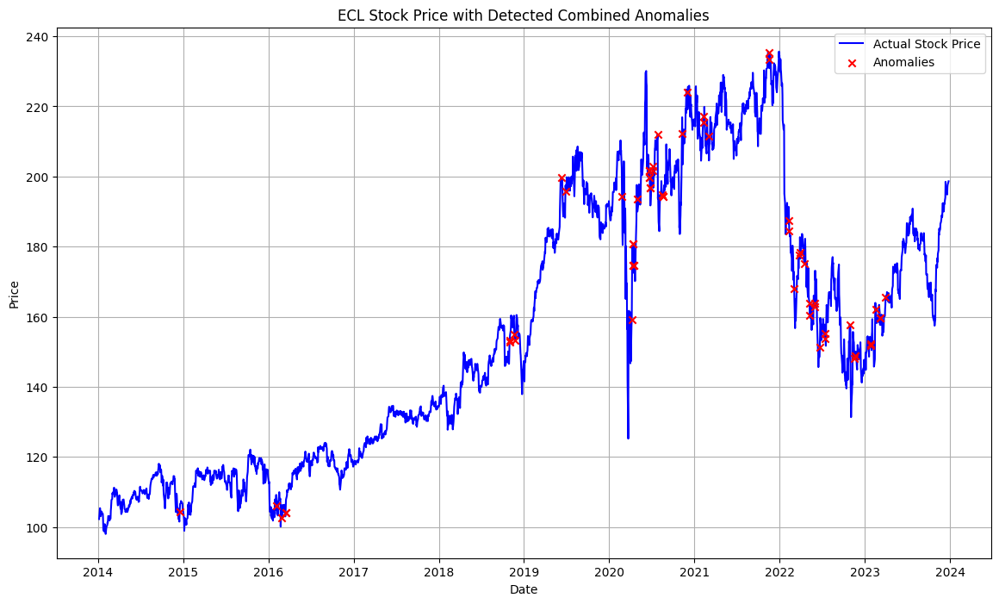

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 411.58it/s]


Combined Score Threshold: 0.24380307284760502


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2099.59it/s]


Sequence 25 is anomalous with combined score 0.2753779600896236
Sequence 27 is anomalous with combined score 0.29520054189295697
Sequence 28 is anomalous with combined score 0.4176218940169578
Sequence 32 is anomalous with combined score 0.26831578611705253
Sequence 33 is anomalous with combined score 0.25179791730184886
Sequence 45 is anomalous with combined score 0.38173362009228584
Sequence 46 is anomalous with combined score 0.46558779569097014
Sequence 47 is anomalous with combined score 0.26733760749257107
Sequence 50 is anomalous with combined score 0.4034146385313451
Sequence 51 is anomalous with combined score 0.33119301899206627
Sequence 52 is anomalous with combined score 0.26718233575858613
Sequence 53 is anomalous with combined score 0.2590274892939996
Sequence 59 is anomalous with combined score 0.2691383613538214
Sequence 66 is anomalous with combined score 0.29573463762992547
Sequence 67 is anomalous with combined score 0.3728080567542709
Sequence 68 is anomalous with c

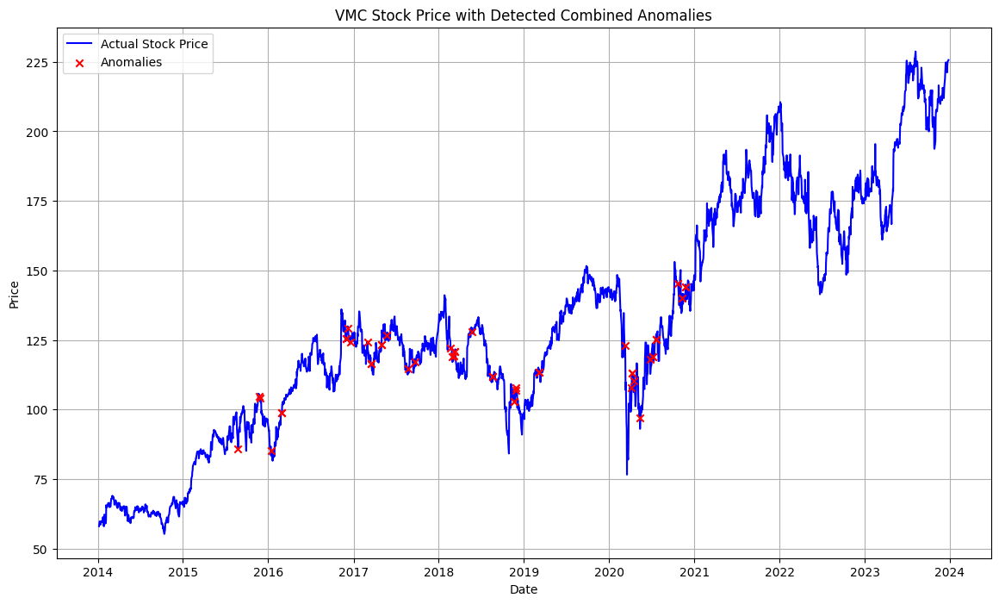

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.49it/s]


Combined Score Threshold: 0.24383069436513405


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2037.29it/s]


Sequence 0 is anomalous with combined score 0.285335609359929
Sequence 4 is anomalous with combined score 0.2827837123403224
Sequence 5 is anomalous with combined score 0.2457504125894212
Sequence 10 is anomalous with combined score 0.3505310233513259
Sequence 11 is anomalous with combined score 0.5541584312945745
Sequence 12 is anomalous with combined score 0.2823933191535656
Sequence 14 is anomalous with combined score 0.3749119460631745
Sequence 15 is anomalous with combined score 0.33858482973501414
Sequence 16 is anomalous with combined score 0.28992232589951467
Sequence 20 is anomalous with combined score 0.4081881587415682
Sequence 21 is anomalous with combined score 0.4946360469183832
Sequence 22 is anomalous with combined score 0.2609518950461862
Sequence 32 is anomalous with combined score 0.4283168031611323
Sequence 33 is anomalous with combined score 0.42696253787323907
Sequence 34 is anomalous with combined score 0.48551789118939326
Sequence 35 is anomalous with combined s

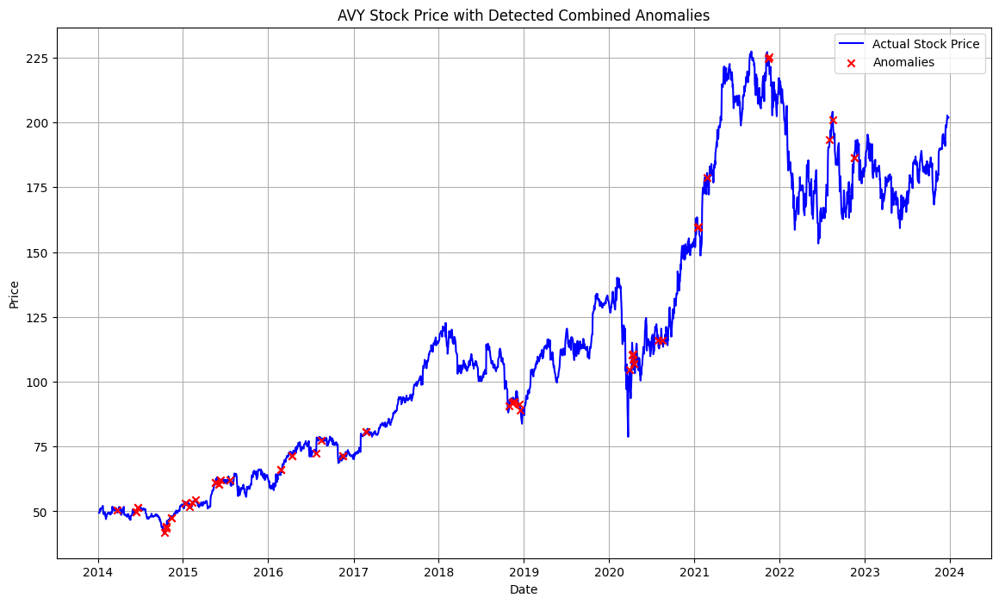

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 417.01it/s]


Combined Score Threshold: 0.2991812726241841


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1738.18it/s]


Sequence 11 is anomalous with combined score 0.3476473682276121
Sequence 12 is anomalous with combined score 0.37517000865791506
Sequence 16 is anomalous with combined score 0.3028938032442252
Sequence 19 is anomalous with combined score 0.45405583076918044
Sequence 20 is anomalous with combined score 0.4513271647824272
Sequence 32 is anomalous with combined score 0.39501993496405463
Sequence 33 is anomalous with combined score 0.5720590421682886
Sequence 34 is anomalous with combined score 0.3683799186909784
Sequence 57 is anomalous with combined score 0.5469347288592813
Sequence 58 is anomalous with combined score 0.5737399491806392
Sequence 78 is anomalous with combined score 0.3863805782036418
Sequence 101 is anomalous with combined score 0.35404641208486
Sequence 102 is anomalous with combined score 0.49999539906228363
Sequence 103 is anomalous with combined score 0.5159878813639136
Sequence 104 is anomalous with combined score 0.42495195533527574
Sequence 105 is anomalous with co

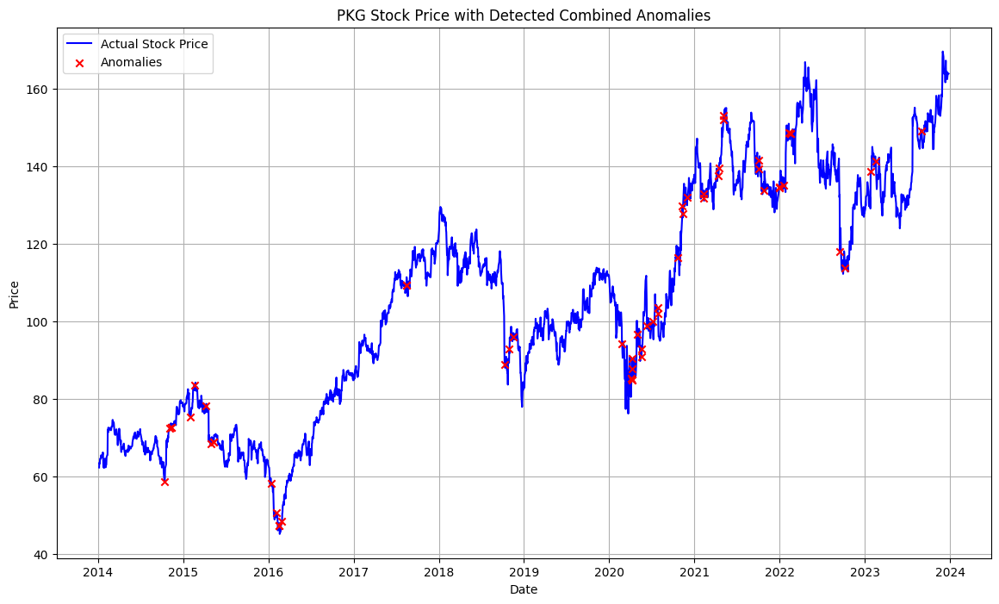

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 380.79it/s]


Combined Score Threshold: 0.11897031243366536


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2104.40it/s]


Sequence 5 is anomalous with combined score 0.13170222559759798
Sequence 31 is anomalous with combined score 0.12062604168716945
Sequence 32 is anomalous with combined score 0.157336855477075
Sequence 33 is anomalous with combined score 0.31796420963278127
Sequence 34 is anomalous with combined score 0.3003000189411435
Sequence 37 is anomalous with combined score 0.1472190786217793
Sequence 38 is anomalous with combined score 0.36239215581636963
Sequence 39 is anomalous with combined score 0.270822950066671
Sequence 46 is anomalous with combined score 0.20149727364429512
Sequence 47 is anomalous with combined score 0.2139064927656064
Sequence 49 is anomalous with combined score 0.5247695946926996
Sequence 50 is anomalous with combined score 0.607018243785833
Sequence 51 is anomalous with combined score 0.5041909001921436
Sequence 52 is anomalous with combined score 0.5541032951468452
Sequence 53 is anomalous with combined score 0.24124752814476372
Sequence 54 is anomalous with combined

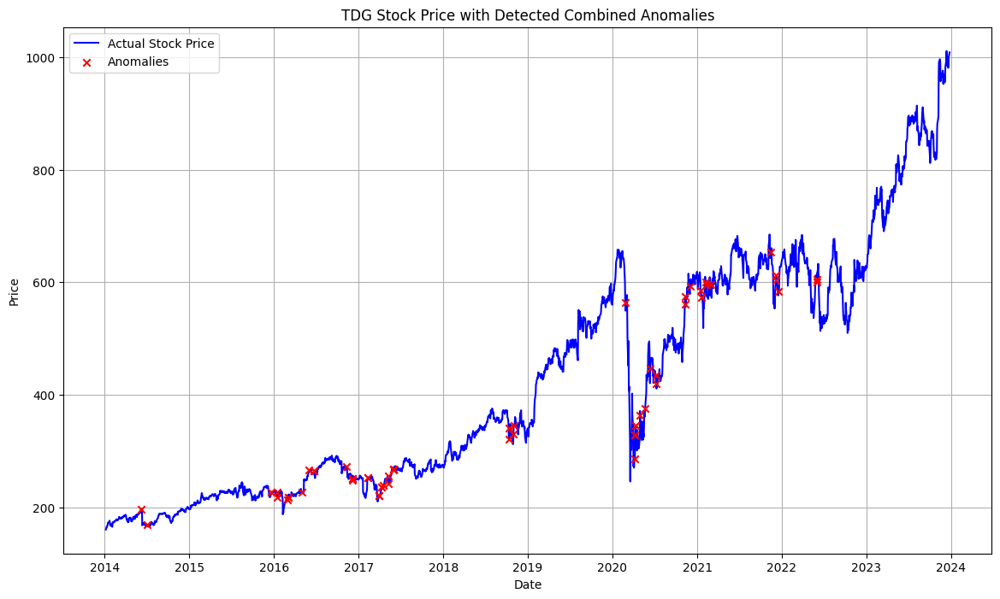

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 354.58it/s]


Combined Score Threshold: 0.291095227855078


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1803.61it/s]


Sequence 27 is anomalous with combined score 0.3301516267769221
Sequence 28 is anomalous with combined score 0.44690591520392303
Sequence 29 is anomalous with combined score 0.32289644675511936
Sequence 32 is anomalous with combined score 0.4103550149131641
Sequence 33 is anomalous with combined score 0.4333725368763699
Sequence 34 is anomalous with combined score 0.33400324108683466
Sequence 53 is anomalous with combined score 0.6046616621310549
Sequence 54 is anomalous with combined score 0.6789659951932288
Sequence 55 is anomalous with combined score 0.4414771955581839
Sequence 56 is anomalous with combined score 0.40692397503463484
Sequence 57 is anomalous with combined score 0.6735099262087931
Sequence 58 is anomalous with combined score 0.6552811606674733
Sequence 59 is anomalous with combined score 0.32778918851975514
Sequence 61 is anomalous with combined score 0.7233464136807916
Sequence 62 is anomalous with combined score 0.8860702708254733
Sequence 63 is anomalous with combi

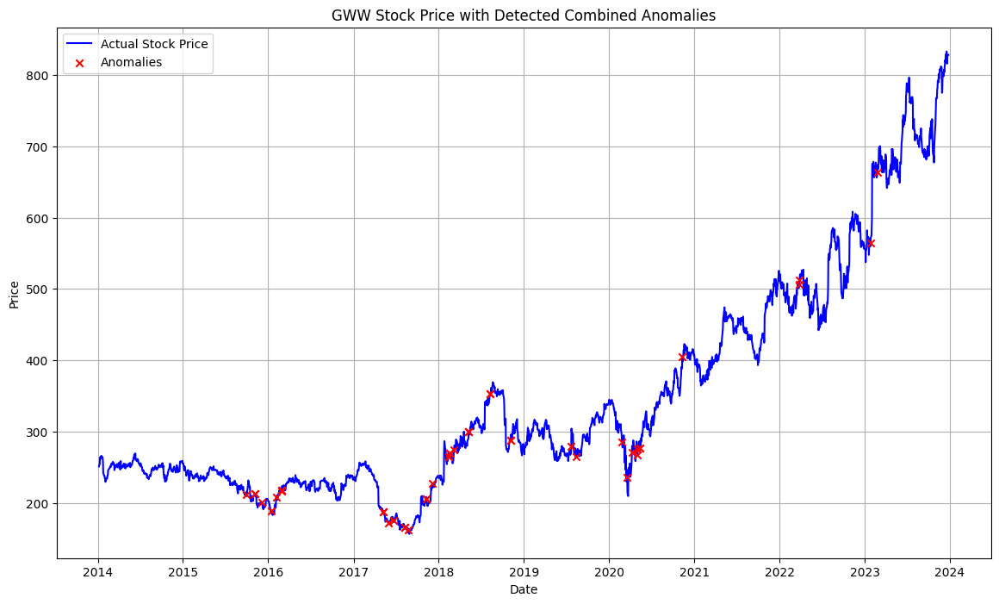

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 396.17it/s]


Combined Score Threshold: 0.2736878902468576


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1997.82it/s]


Sequence 10 is anomalous with combined score 0.33355054469309364
Sequence 11 is anomalous with combined score 0.3950036418491806
Sequence 14 is anomalous with combined score 0.4286183129638609
Sequence 15 is anomalous with combined score 0.6507634099339457
Sequence 16 is anomalous with combined score 0.5091654894030814
Sequence 21 is anomalous with combined score 0.3652909806912702
Sequence 22 is anomalous with combined score 0.4248487485146914
Sequence 23 is anomalous with combined score 0.42612182016084454
Sequence 24 is anomalous with combined score 0.5706258900238558
Sequence 25 is anomalous with combined score 0.4894136562591727
Sequence 26 is anomalous with combined score 0.38228714695031063
Sequence 27 is anomalous with combined score 0.39778615802871664
Sequence 28 is anomalous with combined score 0.4017535124023966
Sequence 31 is anomalous with combined score 0.32059628281593155
Sequence 32 is anomalous with combined score 0.655991746109738
Sequence 33 is anomalous with combin

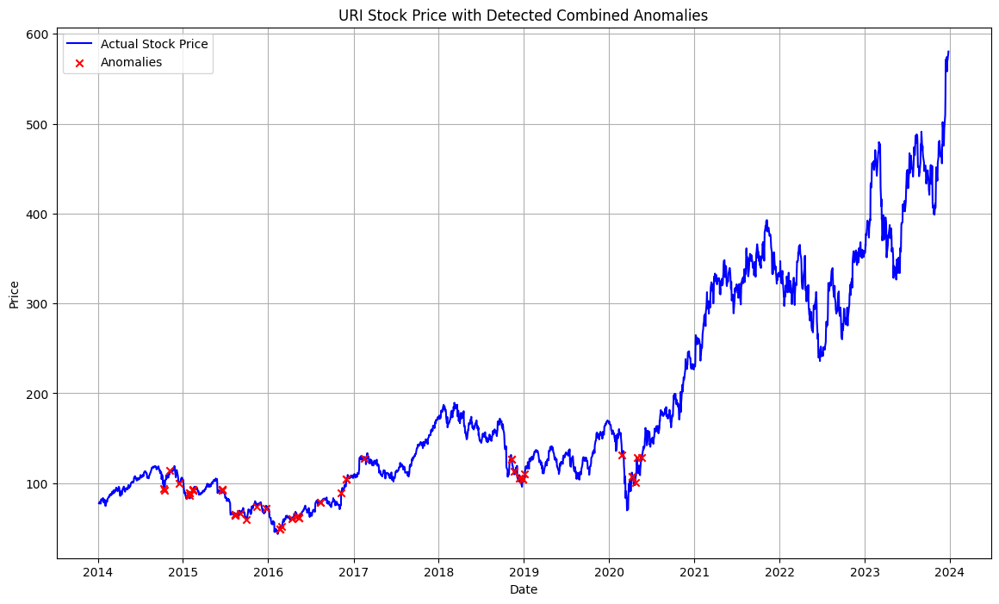

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 398.73it/s]


Combined Score Threshold: 0.2331762467075229


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1863.32it/s]


Sequence 11 is anomalous with combined score 0.33433874402663233
Sequence 12 is anomalous with combined score 0.33811413090921283
Sequence 15 is anomalous with combined score 0.2919387352535926
Sequence 16 is anomalous with combined score 0.2548068270368484
Sequence 20 is anomalous with combined score 0.23819240783272794
Sequence 24 is anomalous with combined score 0.4290355458773458
Sequence 25 is anomalous with combined score 0.6095463981371664
Sequence 26 is anomalous with combined score 0.37091244487242114
Sequence 27 is anomalous with combined score 0.26636067611722025
Sequence 28 is anomalous with combined score 0.3695641779325941
Sequence 29 is anomalous with combined score 0.2899430299617727
Sequence 32 is anomalous with combined score 0.4292687984163461
Sequence 33 is anomalous with combined score 0.5203450690921313
Sequence 34 is anomalous with combined score 0.2650911181972731
Sequence 45 is anomalous with combined score 0.261437187571952
Sequence 46 is anomalous with combin

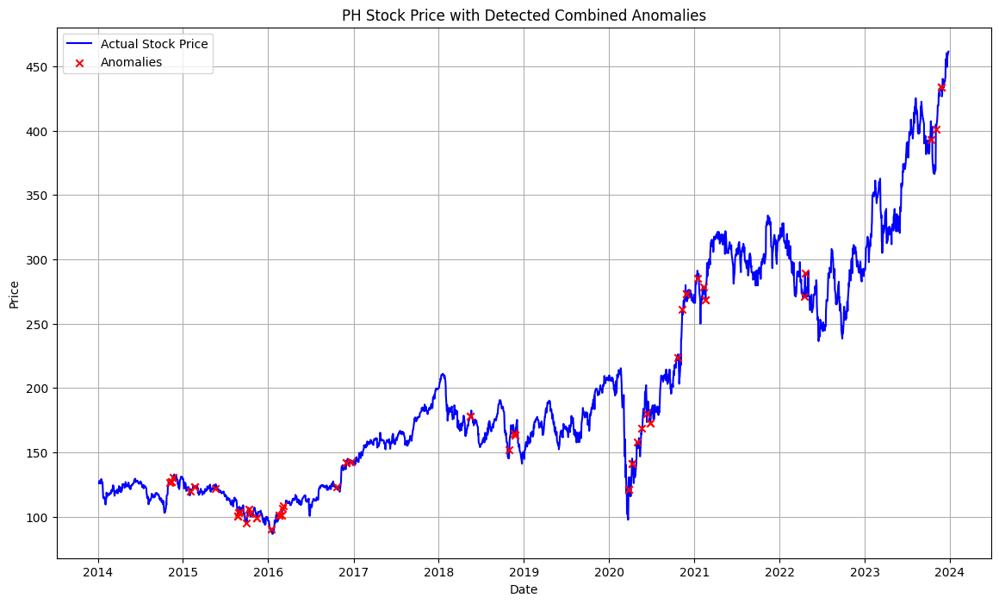

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 427.08it/s]


Combined Score Threshold: 0.2554536949937156


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2098.57it/s]


Sequence 2 is anomalous with combined score 0.3918548521392719
Sequence 3 is anomalous with combined score 0.4352366015956557
Sequence 11 is anomalous with combined score 0.6107393757931384
Sequence 12 is anomalous with combined score 0.5767445925424111
Sequence 19 is anomalous with combined score 0.2736037581125085
Sequence 20 is anomalous with combined score 0.27530678325552527
Sequence 23 is anomalous with combined score 0.30274192070121997
Sequence 24 is anomalous with combined score 0.2572174822043759
Sequence 28 is anomalous with combined score 0.31998111491704967
Sequence 33 is anomalous with combined score 0.36712093976176086
Sequence 34 is anomalous with combined score 0.3399448791733557
Sequence 45 is anomalous with combined score 0.31383829344642866
Sequence 50 is anomalous with combined score 0.2723455512449143
Sequence 51 is anomalous with combined score 0.28201735170704334
Sequence 61 is anomalous with combined score 0.2783838138372034
Sequence 71 is anomalous with combin

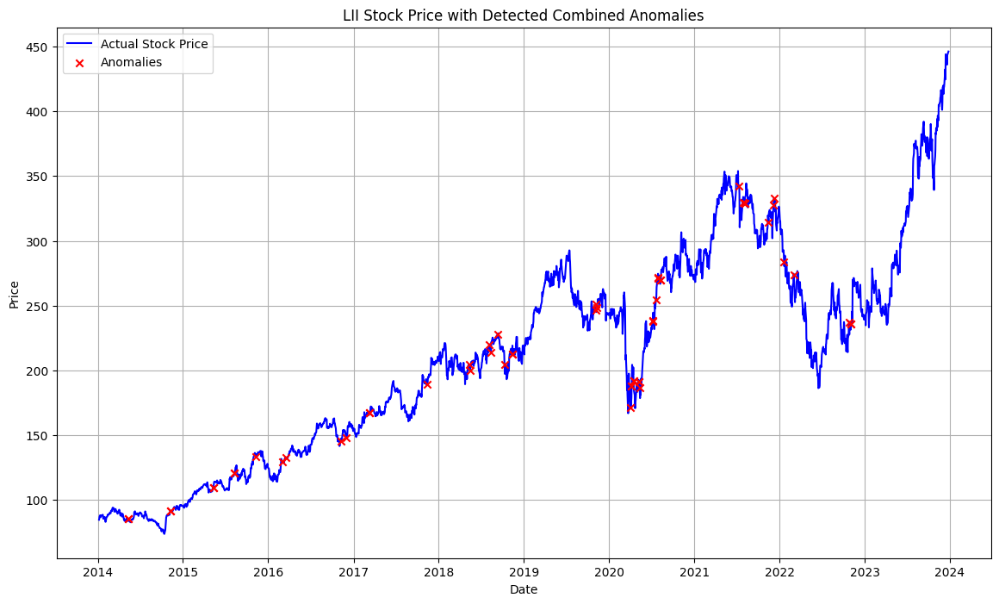

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 383.57it/s]


Combined Score Threshold: 0.1783610550655415


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2047.42it/s]


Sequence 33 is anomalous with combined score 0.19658068941215645
Sequence 40 is anomalous with combined score 0.18373391330085775
Sequence 41 is anomalous with combined score 0.5270379650356823
Sequence 42 is anomalous with combined score 0.5754252301781316
Sequence 43 is anomalous with combined score 0.20805471566007205
Sequence 70 is anomalous with combined score 0.19841175151309304
Sequence 71 is anomalous with combined score 0.2060149068575175
Sequence 81 is anomalous with combined score 0.20976898812007821
Sequence 101 is anomalous with combined score 0.2518348780998277
Sequence 102 is anomalous with combined score 0.6393637051993377
Sequence 103 is anomalous with combined score 0.5443845060393834
Sequence 104 is anomalous with combined score 0.2722764132194356
Sequence 105 is anomalous with combined score 0.2746729864698412
Sequence 106 is anomalous with combined score 0.19965145499675338
Sequence 116 is anomalous with combined score 0.2060141695776706
Sequence 117 is anomalous w

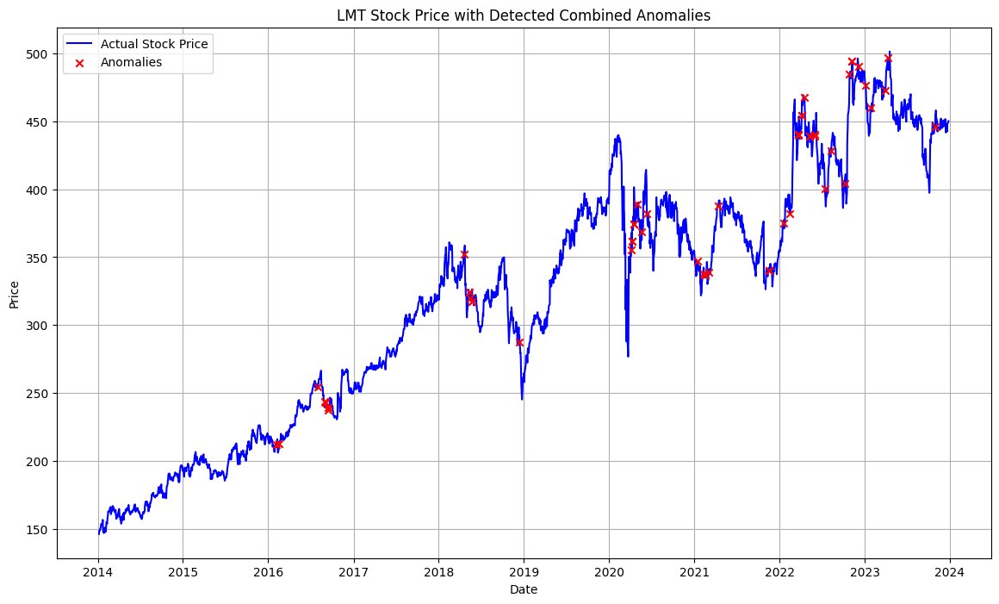

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.39it/s]


Combined Score Threshold: 0.32666712238212714


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2085.99it/s]


Sequence 0 is anomalous with combined score 0.3556438069714259
Sequence 14 is anomalous with combined score 0.561467716246946
Sequence 15 is anomalous with combined score 0.5747853652138564
Sequence 31 is anomalous with combined score 0.3521700968035404
Sequence 32 is anomalous with combined score 0.39299891147166377
Sequence 33 is anomalous with combined score 0.36181231119385227
Sequence 70 is anomalous with combined score 0.37469009402125397
Sequence 71 is anomalous with combined score 0.4011714257047497
Sequence 74 is anomalous with combined score 0.3934172301967924
Sequence 75 is anomalous with combined score 0.3577393880866767
Sequence 78 is anomalous with combined score 0.45542829881815283
Sequence 79 is anomalous with combined score 0.4788544990965742
Sequence 80 is anomalous with combined score 0.6043087799636072
Sequence 81 is anomalous with combined score 0.5887432901407887
Sequence 91 is anomalous with combined score 0.3718775401443793
Sequence 92 is anomalous with combined

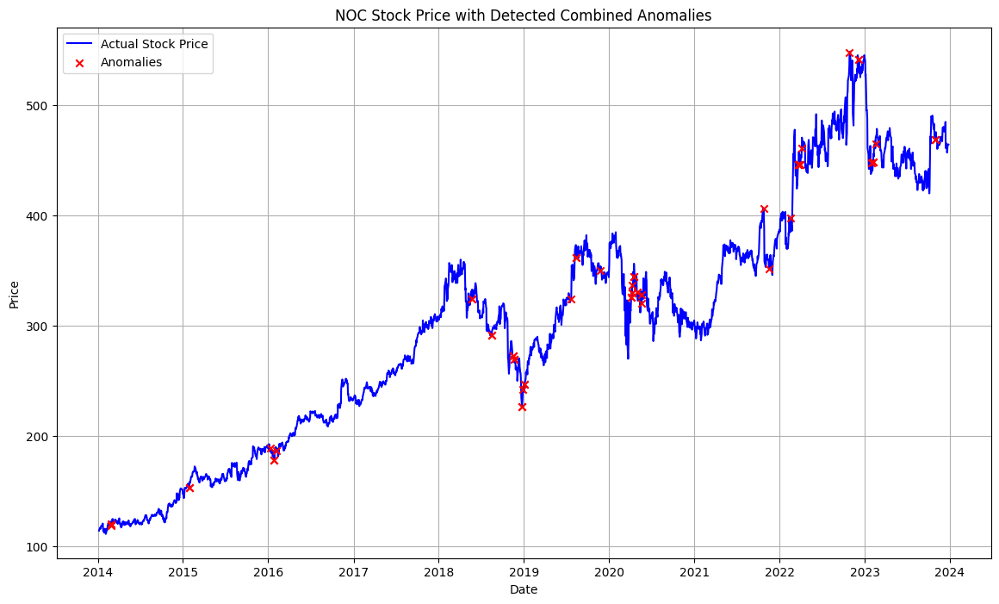

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 423.97it/s]


Combined Score Threshold: 0.32624948565125567


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2073.41it/s]


Sequence 0 is anomalous with combined score 0.612720710057631
Sequence 1 is anomalous with combined score 0.6003689544653922
Sequence 2 is anomalous with combined score 0.5896556745360434
Sequence 3 is anomalous with combined score 0.5701003721442216
Sequence 11 is anomalous with combined score 0.3312615135628555
Sequence 30 is anomalous with combined score 0.4179275930978139
Sequence 31 is anomalous with combined score 0.41202160906404933
Sequence 32 is anomalous with combined score 0.47769478330383336
Sequence 33 is anomalous with combined score 0.5657373885517847
Sequence 39 is anomalous with combined score 0.32969461842656533
Sequence 46 is anomalous with combined score 0.36907041817034814
Sequence 53 is anomalous with combined score 0.3340338602568997
Sequence 80 is anomalous with combined score 0.6245811577503552
Sequence 81 is anomalous with combined score 0.7138345555871053
Sequence 89 is anomalous with combined score 0.38021295273938654
Sequence 90 is anomalous with combined s

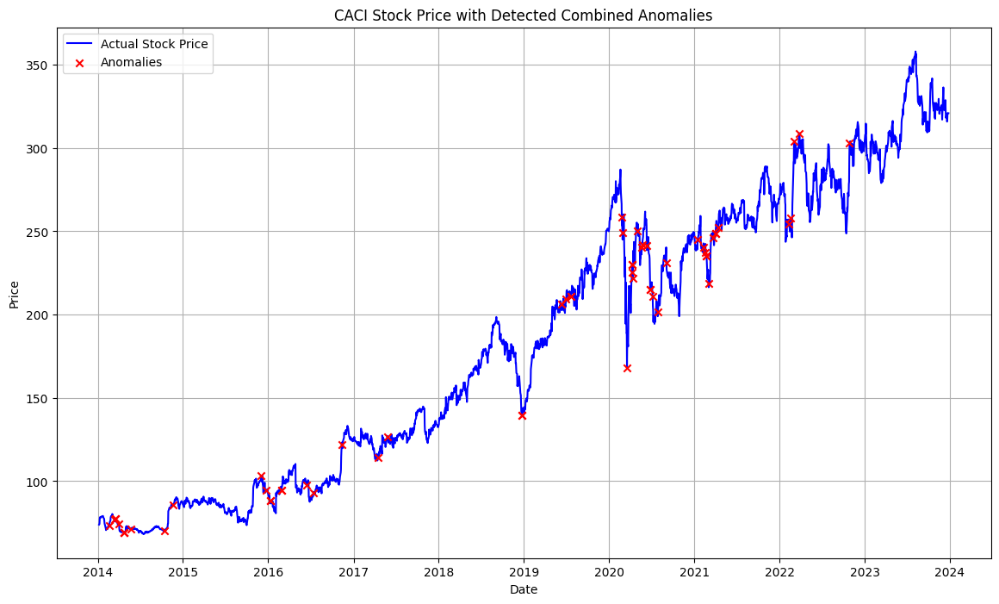

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 401.80it/s]


Combined Score Threshold: 0.25645094343625147


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1864.11it/s]


Sequence 50 is anomalous with combined score 0.4827965968031609
Sequence 51 is anomalous with combined score 0.5238939700790968
Sequence 53 is anomalous with combined score 0.2655998386179423
Sequence 68 is anomalous with combined score 0.260698002924495
Sequence 69 is anomalous with combined score 0.3639795646612079
Sequence 70 is anomalous with combined score 0.37817617745923227
Sequence 74 is anomalous with combined score 0.2597756662061025
Sequence 75 is anomalous with combined score 0.25857799863191755
Sequence 79 is anomalous with combined score 0.4659373872186342
Sequence 80 is anomalous with combined score 0.326465166972598
Sequence 85 is anomalous with combined score 0.2898031508901349
Sequence 86 is anomalous with combined score 0.4522095078874869
Sequence 87 is anomalous with combined score 0.28808398638364896
Sequence 101 is anomalous with combined score 0.5298491159896357
Sequence 102 is anomalous with combined score 0.7659520597043559
Sequence 103 is anomalous with combin

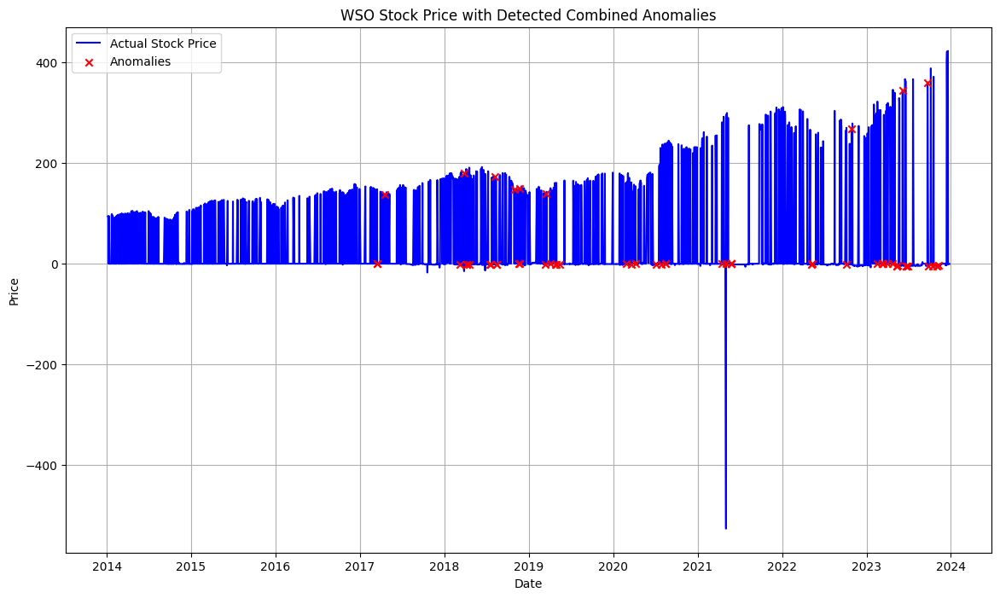

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 428.60it/s]


Combined Score Threshold: 0.28548634693870567


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2014.68it/s]


Sequence 10 is anomalous with combined score 0.3282652380761156
Sequence 11 is anomalous with combined score 0.47812088685877197
Sequence 15 is anomalous with combined score 0.43536709179516325
Sequence 16 is anomalous with combined score 0.3502930952648471
Sequence 28 is anomalous with combined score 0.7151676804565004
Sequence 29 is anomalous with combined score 0.6481225697469613
Sequence 33 is anomalous with combined score 0.3282182680484632
Sequence 53 is anomalous with combined score 0.2964898602475803
Sequence 54 is anomalous with combined score 0.41517090199421364
Sequence 55 is anomalous with combined score 0.4764307631929588
Sequence 56 is anomalous with combined score 0.4310983730458231
Sequence 66 is anomalous with combined score 0.5029921977470929
Sequence 67 is anomalous with combined score 0.4556647448400377
Sequence 70 is anomalous with combined score 0.3291205287436665
Sequence 78 is anomalous with combined score 0.5411235213576269
Sequence 79 is anomalous with combine

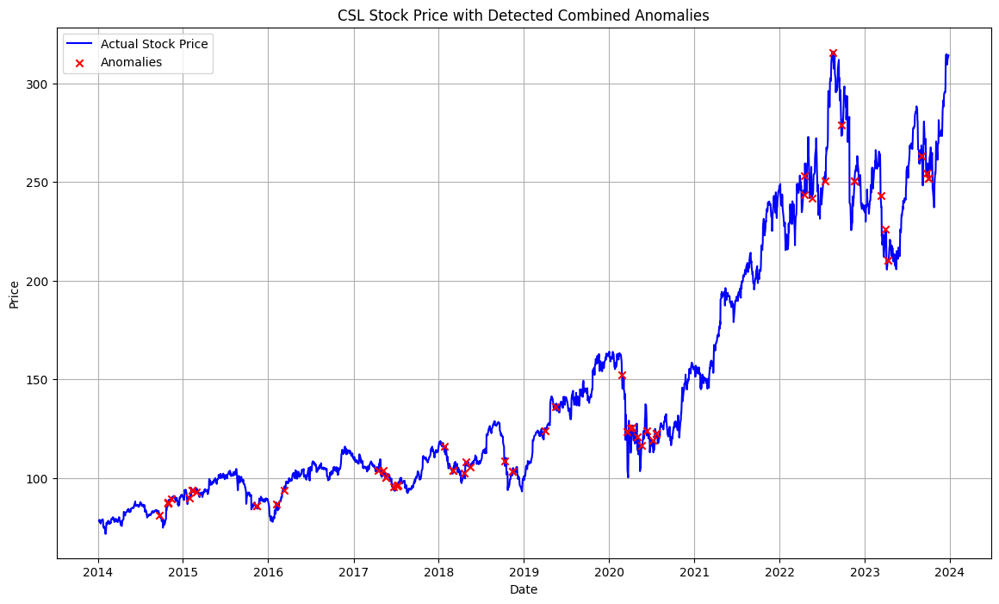

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 427.01it/s]


Combined Score Threshold: 0.282484342860014


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2025.04it/s]


Sequence 3 is anomalous with combined score 0.2908748282882477
Sequence 91 is anomalous with combined score 0.3139915011277522
Sequence 94 is anomalous with combined score 0.6302463984210901
Sequence 95 is anomalous with combined score 0.6139079003004458
Sequence 101 is anomalous with combined score 0.28904682618718947
Sequence 102 is anomalous with combined score 0.5772901071826932
Sequence 103 is anomalous with combined score 0.5355024322487095
Sequence 104 is anomalous with combined score 0.30291560094792724
Sequence 108 is anomalous with combined score 0.29739477878599396
Sequence 111 is anomalous with combined score 0.3517920589973538
Sequence 112 is anomalous with combined score 0.3030899618505275
Sequence 119 is anomalous with combined score 0.29866620599359295
Sequence 120 is anomalous with combined score 0.3082427350156788
Sequence 121 is anomalous with combined score 0.29177097514160844
Sequence 122 is anomalous with combined score 0.29034888857552876
Sequence 125 is anomalou

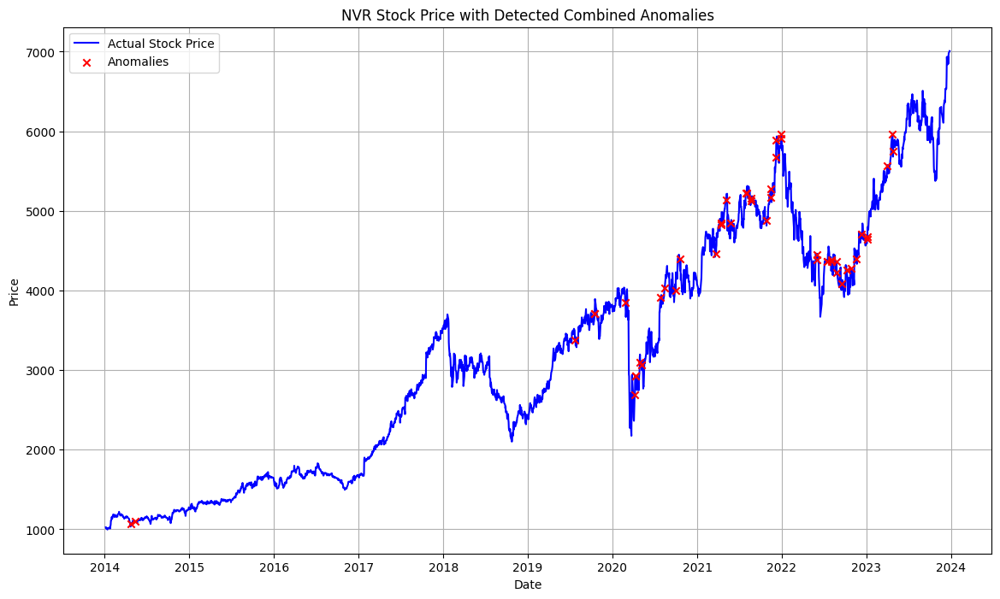

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.68it/s]


Combined Score Threshold: 0.3461735360413326


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2080.86it/s]


Sequence 43 is anomalous with combined score 0.35350353494204156
Sequence 54 is anomalous with combined score 0.6361645624430211
Sequence 55 is anomalous with combined score 0.7377062221992792
Sequence 56 is anomalous with combined score 0.6829322338062455
Sequence 57 is anomalous with combined score 0.7598941742559717
Sequence 58 is anomalous with combined score 0.5366190014889791
Sequence 59 is anomalous with combined score 0.37429268101330904
Sequence 60 is anomalous with combined score 0.5387729397846719
Sequence 61 is anomalous with combined score 0.4595199766791137
Sequence 63 is anomalous with combined score 0.5596047011879574
Sequence 64 is anomalous with combined score 0.4884649379608719
Sequence 65 is anomalous with combined score 0.3512095163152217
Sequence 66 is anomalous with combined score 0.3761023647090489
Sequence 67 is anomalous with combined score 0.5106316562400406
Sequence 68 is anomalous with combined score 0.49163805057894483
Sequence 71 is anomalous with combine

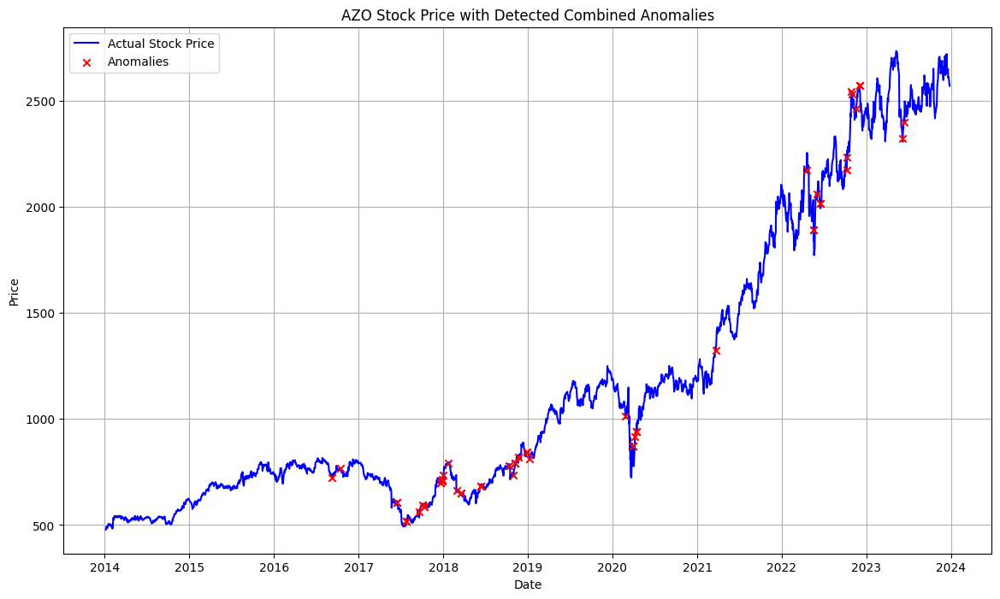

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.10it/s]


Combined Score Threshold: 0.2858625517911721


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2036.71it/s]


Sequence 33 is anomalous with combined score 0.33620390774867315
Sequence 53 is anomalous with combined score 0.31950874280985864
Sequence 54 is anomalous with combined score 0.4083495615807596
Sequence 55 is anomalous with combined score 0.3244226663695627
Sequence 56 is anomalous with combined score 0.6778578663437151
Sequence 57 is anomalous with combined score 0.8381168616834372
Sequence 58 is anomalous with combined score 0.49480277176251586
Sequence 59 is anomalous with combined score 0.34131692281203085
Sequence 60 is anomalous with combined score 0.3215502041346556
Sequence 62 is anomalous with combined score 0.30083548899317275
Sequence 63 is anomalous with combined score 0.3923911472726179
Sequence 64 is anomalous with combined score 0.29987320447324844
Sequence 66 is anomalous with combined score 0.311321837129913
Sequence 67 is anomalous with combined score 0.3501050955148952
Sequence 70 is anomalous with combined score 0.3355022612736248
Sequence 71 is anomalous with combi

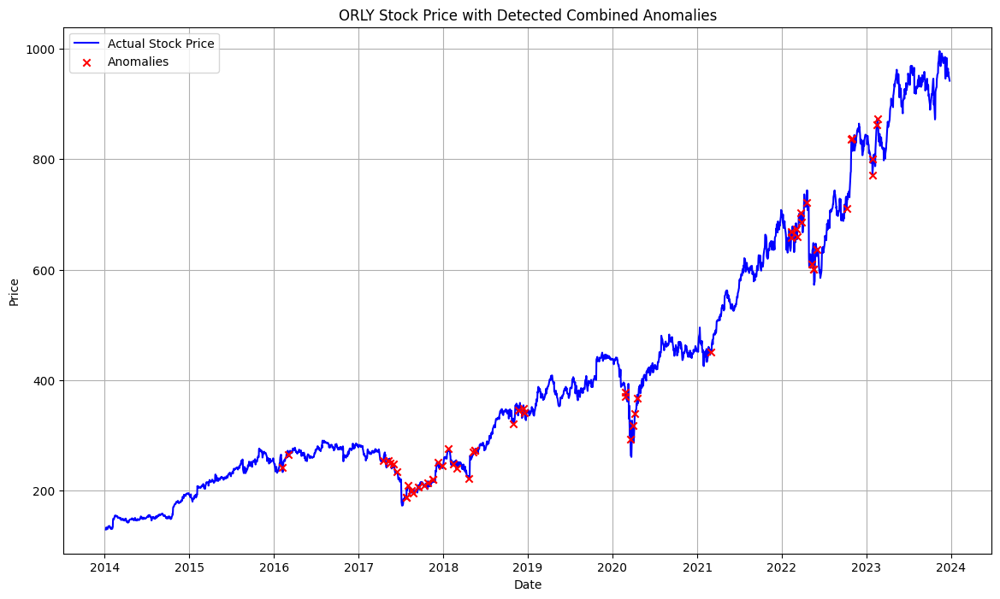

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.04it/s]


Combined Score Threshold: 0.23647513218147548


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1968.62it/s]


Sequence 9 is anomalous with combined score 0.5406923543125701
Sequence 10 is anomalous with combined score 0.48405910182361533
Sequence 23 is anomalous with combined score 0.25613505151347593
Sequence 24 is anomalous with combined score 0.2564808921009818
Sequence 102 is anomalous with combined score 0.48131743524927373
Sequence 103 is anomalous with combined score 0.537688990795402
Sequence 104 is anomalous with combined score 0.435935653772816
Sequence 105 is anomalous with combined score 0.30552096335332746
Sequence 106 is anomalous with combined score 0.24565105884627736
Sequence 107 is anomalous with combined score 0.27268641826942897
Sequence 118 is anomalous with combined score 0.253226152255973
Sequence 121 is anomalous with combined score 0.24356876581865647
Sequence 122 is anomalous with combined score 0.24315798843067857
Sequence 123 is anomalous with combined score 0.33426190828166835
Sequence 124 is anomalous with combined score 0.3088428380471104
Sequence 129 is anomalou

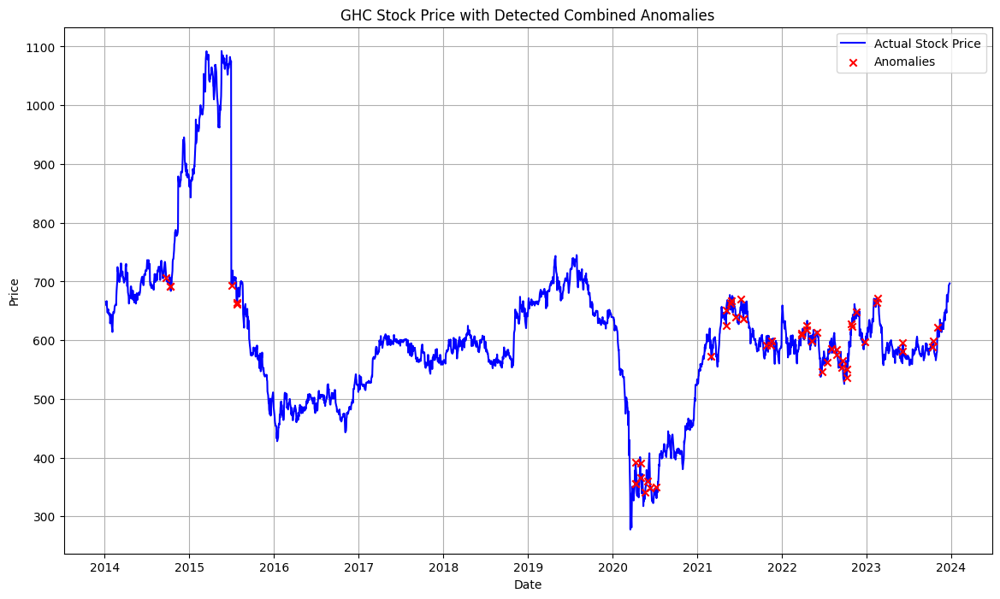

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 411.17it/s]


Combined Score Threshold: 0.30698351825290643


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2000.90it/s]


Sequence 3 is anomalous with combined score 0.5190191759520997
Sequence 4 is anomalous with combined score 0.4925522937951231
Sequence 32 is anomalous with combined score 0.4296849638162624
Sequence 33 is anomalous with combined score 0.5402089611767291
Sequence 34 is anomalous with combined score 0.36591945740041604
Sequence 46 is anomalous with combined score 0.3559072891783548
Sequence 49 is anomalous with combined score 0.4310968991021703
Sequence 50 is anomalous with combined score 0.5974254473937717
Sequence 51 is anomalous with combined score 0.3637835496975612
Sequence 53 is anomalous with combined score 0.3787222845837186
Sequence 54 is anomalous with combined score 0.42697407705526347
Sequence 70 is anomalous with combined score 0.38104381553064626
Sequence 72 is anomalous with combined score 0.4831520098568342
Sequence 73 is anomalous with combined score 0.47437902238814256
Sequence 95 is anomalous with combined score 0.43378088717377306
Sequence 96 is anomalous with combine

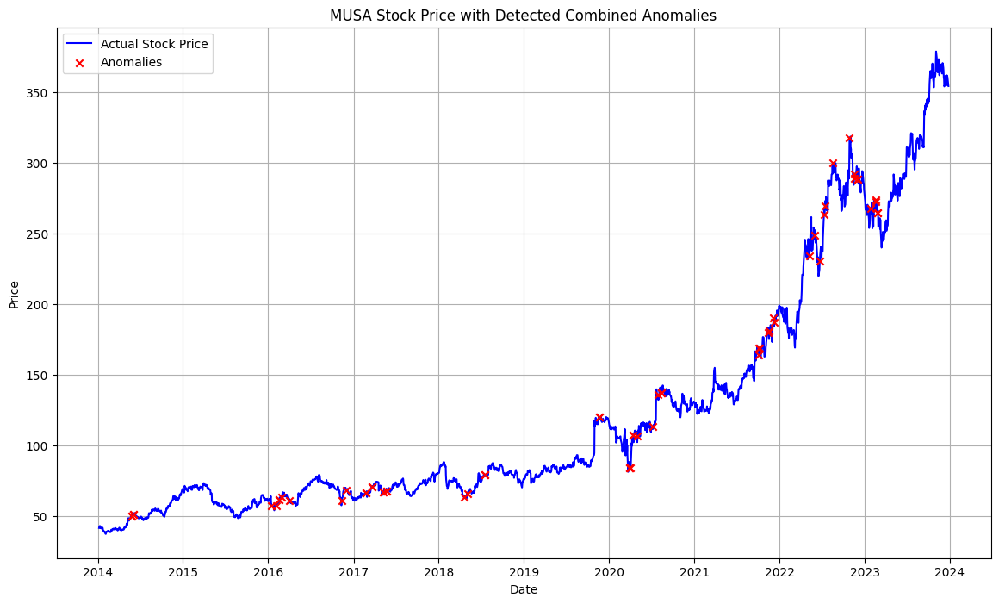

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 377.05it/s]


Combined Score Threshold: 0.2433716835281484


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2019.81it/s]


Sequence 14 is anomalous with combined score 0.32448785827303867
Sequence 15 is anomalous with combined score 0.2637160456933133
Sequence 16 is anomalous with combined score 0.25946971861459867
Sequence 19 is anomalous with combined score 0.26819823708357116
Sequence 37 is anomalous with combined score 0.4835616077472239
Sequence 38 is anomalous with combined score 0.5650941379542951
Sequence 43 is anomalous with combined score 0.3788024183152005
Sequence 44 is anomalous with combined score 0.3758699172083972
Sequence 66 is anomalous with combined score 0.24724510044653952
Sequence 79 is anomalous with combined score 0.38908707447382684
Sequence 80 is anomalous with combined score 0.37299108781145635
Sequence 83 is anomalous with combined score 0.4219388306646589
Sequence 84 is anomalous with combined score 0.4711226391157126
Sequence 85 is anomalous with combined score 0.3257712429940403
Sequence 86 is anomalous with combined score 0.2839159747717433
Sequence 88 is anomalous with comb

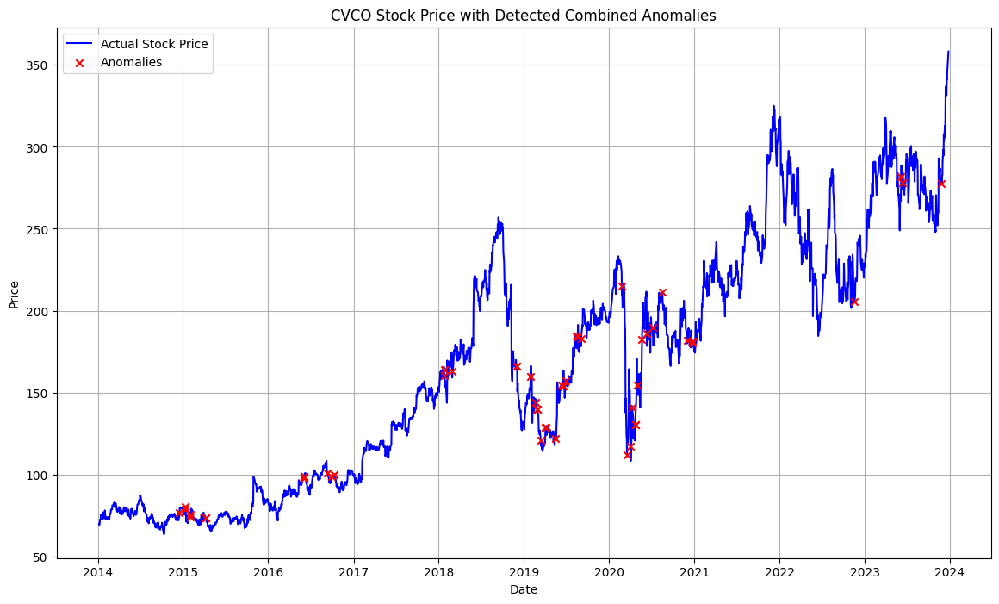

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 423.64it/s]


Combined Score Threshold: 0.38879958010316124


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2088.61it/s]


Sequence 33 is anomalous with combined score 0.48127043732379937
Sequence 34 is anomalous with combined score 0.5315753612495121
Sequence 37 is anomalous with combined score 0.3894616879385049
Sequence 57 is anomalous with combined score 0.4244965247724692
Sequence 58 is anomalous with combined score 0.6350571761561028
Sequence 59 is anomalous with combined score 0.44360871739801144
Sequence 61 is anomalous with combined score 0.5794200502231401
Sequence 62 is anomalous with combined score 0.67482513229879
Sequence 63 is anomalous with combined score 0.48170184882145817
Sequence 64 is anomalous with combined score 0.4035433980885233
Sequence 65 is anomalous with combined score 0.4143178078822565
Sequence 66 is anomalous with combined score 0.45946048094183956
Sequence 67 is anomalous with combined score 0.5722286256623175
Sequence 68 is anomalous with combined score 0.4857673090499943
Sequence 84 is anomalous with combined score 0.4221166785614853
Sequence 85 is anomalous with combined

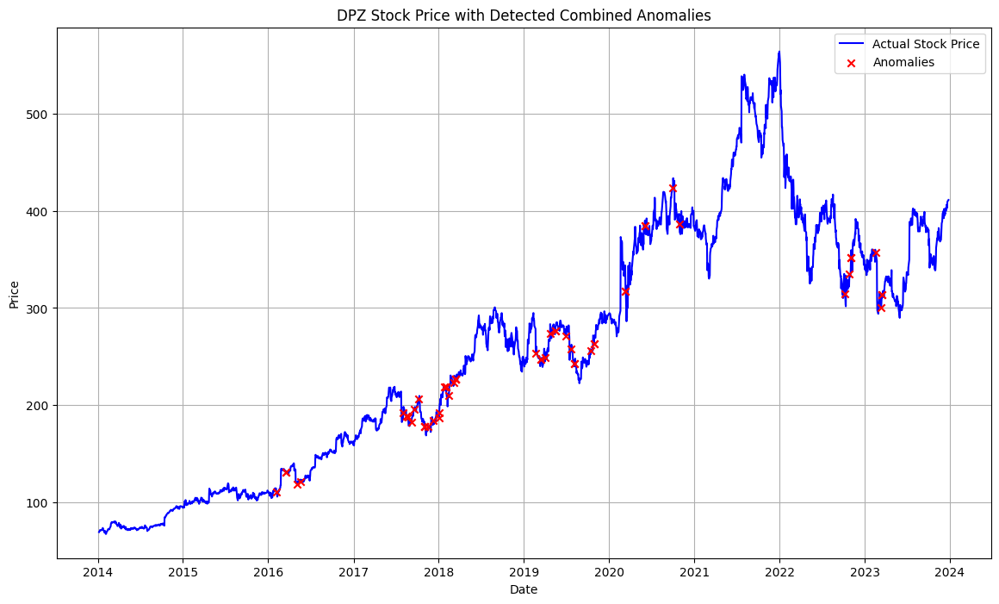

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.01it/s]


Combined Score Threshold: 0.34379673415644146


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2024.57it/s]


Sequence 1 is anomalous with combined score 0.3909104322212965
Sequence 2 is anomalous with combined score 0.4230979358019664
Sequence 10 is anomalous with combined score 0.35050258355842284
Sequence 33 is anomalous with combined score 0.3468514266118567
Sequence 34 is anomalous with combined score 0.5061029754801634
Sequence 35 is anomalous with combined score 0.34500408149606043
Sequence 59 is anomalous with combined score 0.46613395647925815
Sequence 60 is anomalous with combined score 0.39677749919096017
Sequence 61 is anomalous with combined score 0.39057323426064783
Sequence 62 is anomalous with combined score 0.3764344550891558
Sequence 63 is anomalous with combined score 0.36966328530321235
Sequence 64 is anomalous with combined score 0.39492174618488385
Sequence 69 is anomalous with combined score 0.3759157869162242
Sequence 80 is anomalous with combined score 0.4260984189569169
Sequence 92 is anomalous with combined score 0.526517441173153
Sequence 93 is anomalous with combin

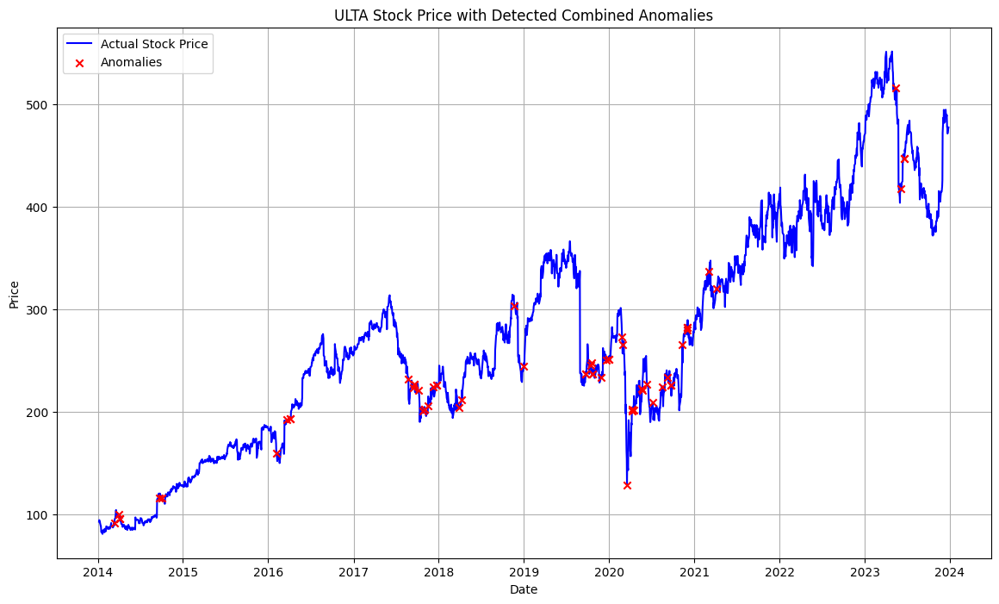

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.44it/s]


Combined Score Threshold: 0.3484382209539693


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1980.81it/s]


Sequence 0 is anomalous with combined score 0.3576950104582552
Sequence 9 is anomalous with combined score 0.483092422353911
Sequence 32 is anomalous with combined score 0.38355288087334394
Sequence 33 is anomalous with combined score 0.4162735187824216
Sequence 79 is anomalous with combined score 0.3591073595524186
Sequence 96 is anomalous with combined score 0.4035771089881096
Sequence 101 is anomalous with combined score 0.5878683556976385
Sequence 102 is anomalous with combined score 0.9999931173578323
Sequence 103 is anomalous with combined score 0.7201318582036169
Sequence 104 is anomalous with combined score 0.39551628265418576
Sequence 108 is anomalous with combined score 0.37822669505867035
Sequence 112 is anomalous with combined score 0.36426927023374533
Sequence 117 is anomalous with combined score 0.41198586075502897
Sequence 118 is anomalous with combined score 0.42484547425535535
Sequence 126 is anomalous with combined score 0.3588016851341116
Sequence 132 is anomalous wi

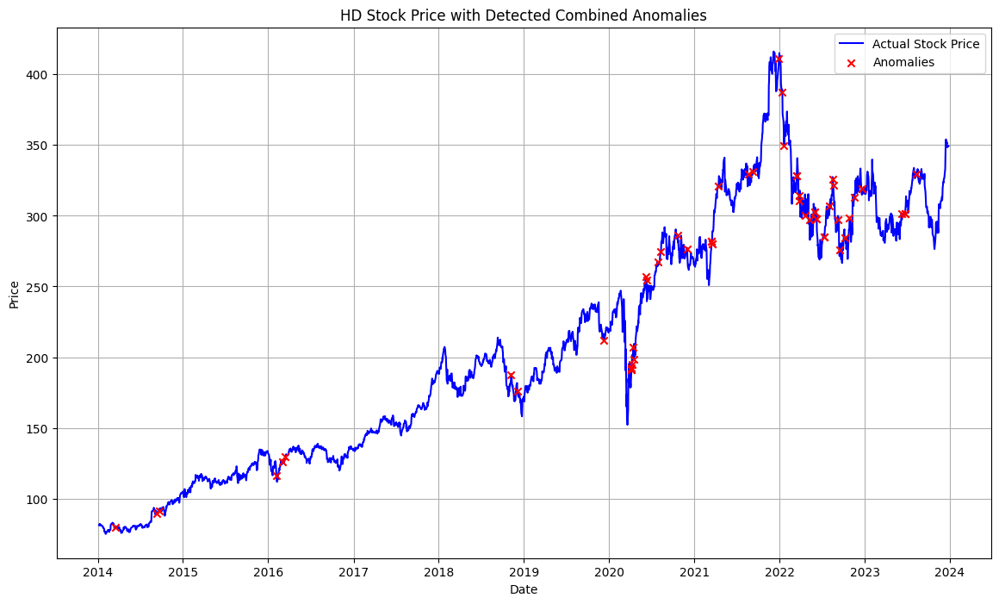

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 405.38it/s]


Combined Score Threshold: 0.23219295812624713


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2044.68it/s]


Sequence 12 is anomalous with combined score 0.28368601012069933
Sequence 13 is anomalous with combined score 0.2874057233458082
Sequence 29 is anomalous with combined score 0.24743611096279167
Sequence 30 is anomalous with combined score 0.2661851755519382
Sequence 50 is anomalous with combined score 0.36283177104956654
Sequence 51 is anomalous with combined score 0.39199293909857524
Sequence 54 is anomalous with combined score 0.3330012479110276
Sequence 55 is anomalous with combined score 0.4028269238917655
Sequence 56 is anomalous with combined score 0.2899813877303078
Sequence 57 is anomalous with combined score 0.5635018480947821
Sequence 58 is anomalous with combined score 0.6436553325710862
Sequence 59 is anomalous with combined score 0.3493557909876165
Sequence 63 is anomalous with combined score 0.26414722660312917
Sequence 67 is anomalous with combined score 0.24413879711857872
Sequence 68 is anomalous with combined score 0.251295924522445
Sequence 79 is anomalous with combi

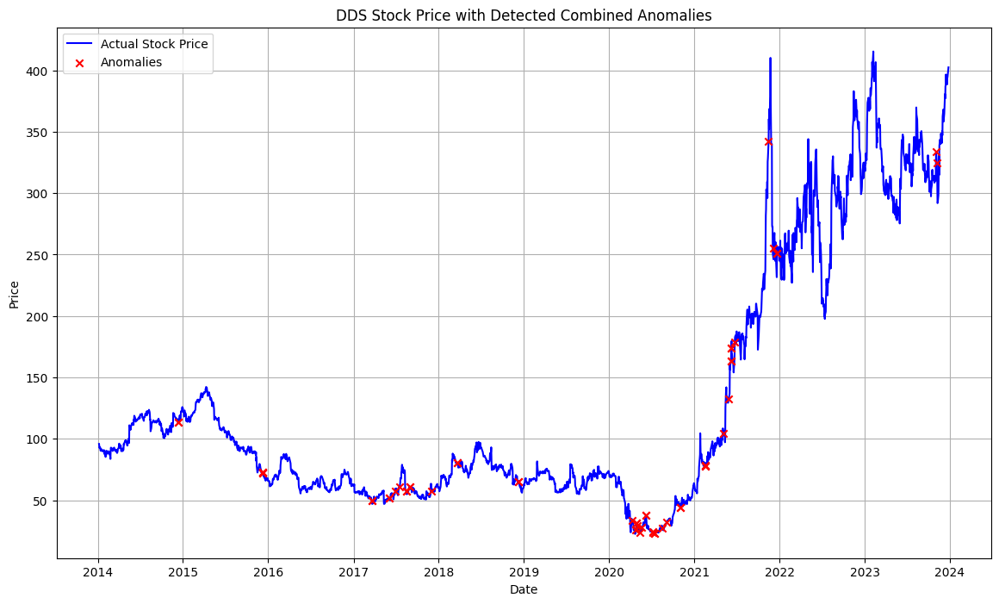

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 421.77it/s]


Combined Score Threshold: 0.26187649473155117


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2070.40it/s]


Sequence 12 is anomalous with combined score 0.29726932799070205
Sequence 15 is anomalous with combined score 0.35648608286250916
Sequence 16 is anomalous with combined score 0.3238438350417241
Sequence 28 is anomalous with combined score 0.2773864387104785
Sequence 32 is anomalous with combined score 0.3588651911825671
Sequence 33 is anomalous with combined score 0.3218606902779759
Sequence 41 is anomalous with combined score 0.3140630449436532
Sequence 42 is anomalous with combined score 0.27839547800163744
Sequence 60 is anomalous with combined score 0.2626438528356204
Sequence 72 is anomalous with combined score 0.3105127133061884
Sequence 93 is anomalous with combined score 0.40974780538458344
Sequence 94 is anomalous with combined score 0.3163101421458712
Sequence 95 is anomalous with combined score 0.2668184205908708
Sequence 101 is anomalous with combined score 0.40396565265143547
Sequence 102 is anomalous with combined score 0.7868173983883358
Sequence 103 is anomalous with co

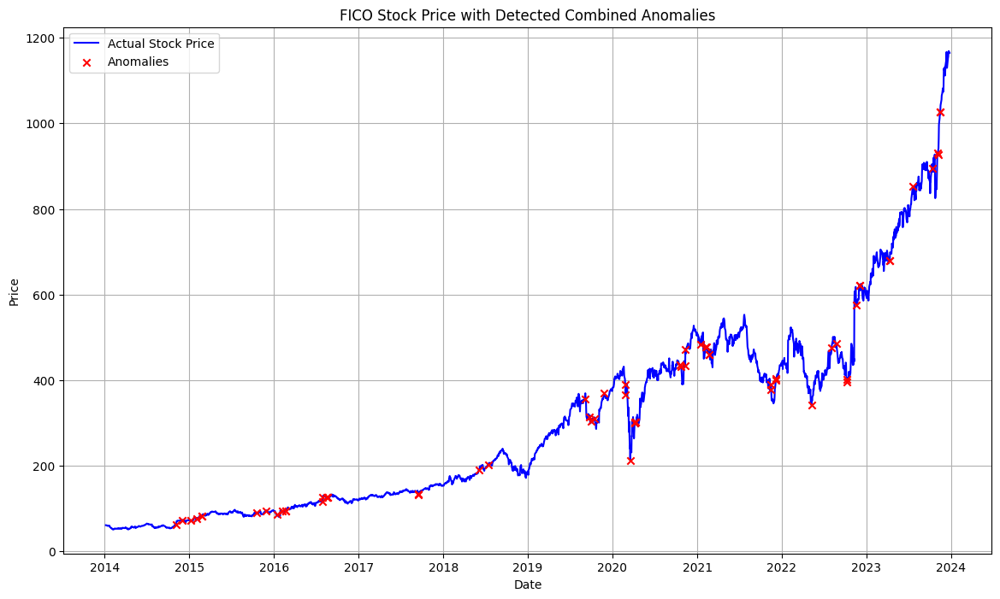

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.20it/s]


Combined Score Threshold: 0.40135511785204997


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2084.26it/s]


Sequence 10 is anomalous with combined score 0.4076034993294518
Sequence 11 is anomalous with combined score 0.43479607526194086
Sequence 13 is anomalous with combined score 0.41234729631318945
Sequence 15 is anomalous with combined score 0.4218283498926045
Sequence 34 is anomalous with combined score 0.43036957897709094
Sequence 42 is anomalous with combined score 0.5050331498688944
Sequence 43 is anomalous with combined score 0.41893337985941514
Sequence 62 is anomalous with combined score 0.40190540557580506
Sequence 72 is anomalous with combined score 0.45258702064117895
Sequence 101 is anomalous with combined score 0.4902257263269105
Sequence 102 is anomalous with combined score 0.4999949747104853
Sequence 103 is anomalous with combined score 0.4752316414590717
Sequence 109 is anomalous with combined score 0.43230988294779416
Sequence 110 is anomalous with combined score 0.4235527719173004
Sequence 112 is anomalous with combined score 0.4659893838461131
Sequence 113 is anomalous w

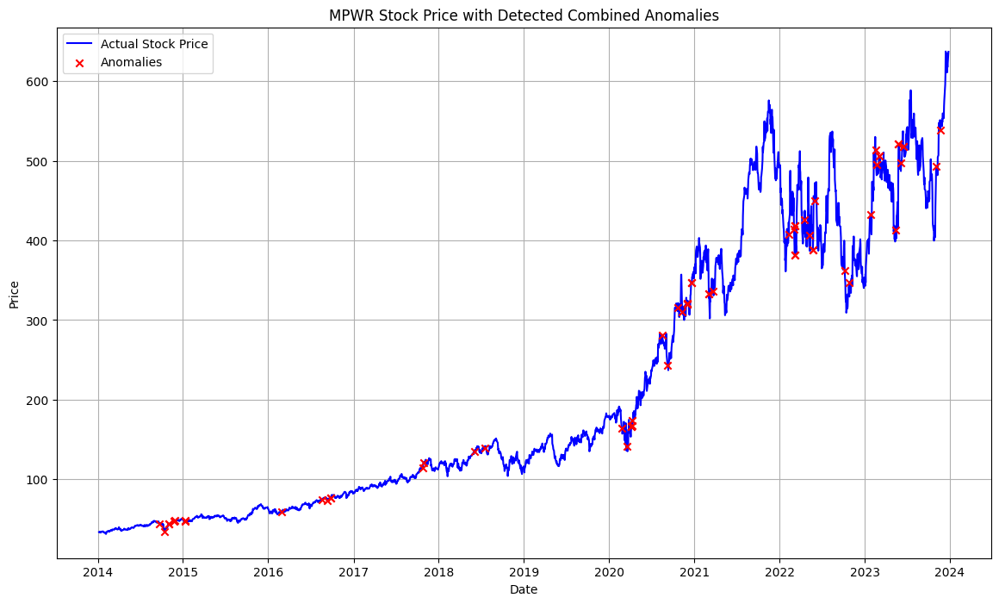

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 411.47it/s]


Combined Score Threshold: 0.30591686154879394


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2006.24it/s]


Sequence 0 is anomalous with combined score 0.337092758207966
Sequence 2 is anomalous with combined score 0.6232684303025124
Sequence 3 is anomalous with combined score 0.8164638865905098
Sequence 4 is anomalous with combined score 0.6112429829722471
Sequence 7 is anomalous with combined score 0.32157350265804874
Sequence 11 is anomalous with combined score 0.34190550670850306
Sequence 12 is anomalous with combined score 0.34467915728240817
Sequence 19 is anomalous with combined score 0.3269289400116327
Sequence 20 is anomalous with combined score 0.33816482792167607
Sequence 32 is anomalous with combined score 0.49418949661188627
Sequence 33 is anomalous with combined score 0.8517572321784455
Sequence 34 is anomalous with combined score 0.5348615450303111
Sequence 36 is anomalous with combined score 0.3171658353773278
Sequence 78 is anomalous with combined score 0.3598100001990023
Sequence 79 is anomalous with combined score 0.4464383633329726
Sequence 80 is anomalous with combined sc

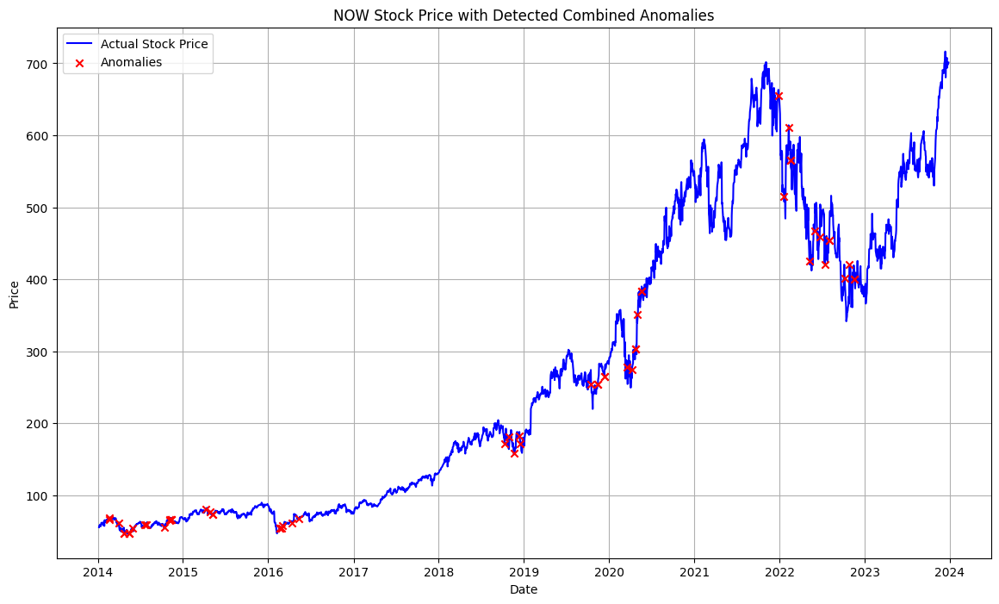

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 423.87it/s]


Combined Score Threshold: 0.33879753063555385


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2093.59it/s]


Sequence 19 is anomalous with combined score 0.40523925615711126
Sequence 28 is anomalous with combined score 0.49613462261193975
Sequence 29 is anomalous with combined score 0.39129815432461085
Sequence 32 is anomalous with combined score 0.368638798060855
Sequence 33 is anomalous with combined score 0.40710202320285505
Sequence 45 is anomalous with combined score 0.3577376941614545
Sequence 63 is anomalous with combined score 0.38833221398720214
Sequence 64 is anomalous with combined score 0.43005130275042225
Sequence 66 is anomalous with combined score 0.6396501714423828
Sequence 67 is anomalous with combined score 0.7209629161291251
Sequence 68 is anomalous with combined score 0.6083719465316648
Sequence 69 is anomalous with combined score 0.6650114055331384
Sequence 70 is anomalous with combined score 0.5256784420965859
Sequence 72 is anomalous with combined score 0.5322086805658004
Sequence 73 is anomalous with combined score 0.5027826164650628
Sequence 74 is anomalous with combi

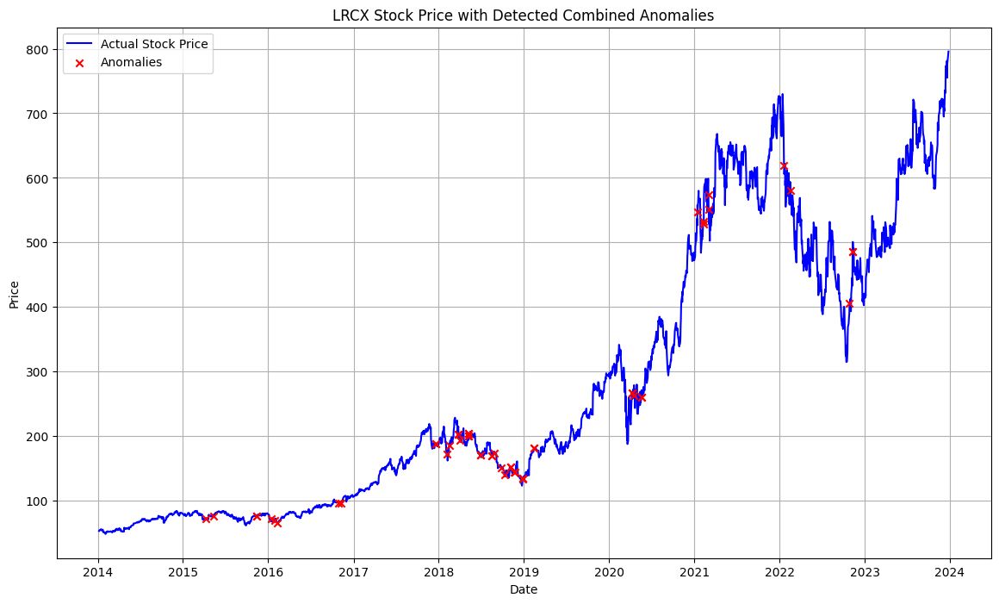

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.79it/s]


Combined Score Threshold: 0.2825383231077979


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2083.44it/s]


Sequence 11 is anomalous with combined score 0.41956639320328726
Sequence 12 is anomalous with combined score 0.3152192413209084
Sequence 13 is anomalous with combined score 0.3778850234283928
Sequence 14 is anomalous with combined score 0.3389757051319467
Sequence 26 is anomalous with combined score 0.32019861009969364
Sequence 27 is anomalous with combined score 0.3067268295825236
Sequence 28 is anomalous with combined score 0.7302157797524762
Sequence 29 is anomalous with combined score 0.6728907156234453
Sequence 42 is anomalous with combined score 0.3027365440124291
Sequence 44 is anomalous with combined score 0.3759345835030236
Sequence 45 is anomalous with combined score 0.4343231665233446
Sequence 46 is anomalous with combined score 0.29280453604170975
Sequence 63 is anomalous with combined score 0.3432561094665225
Sequence 74 is anomalous with combined score 0.28319924959047027
Sequence 75 is anomalous with combined score 0.32725514060489236
Sequence 77 is anomalous with combi

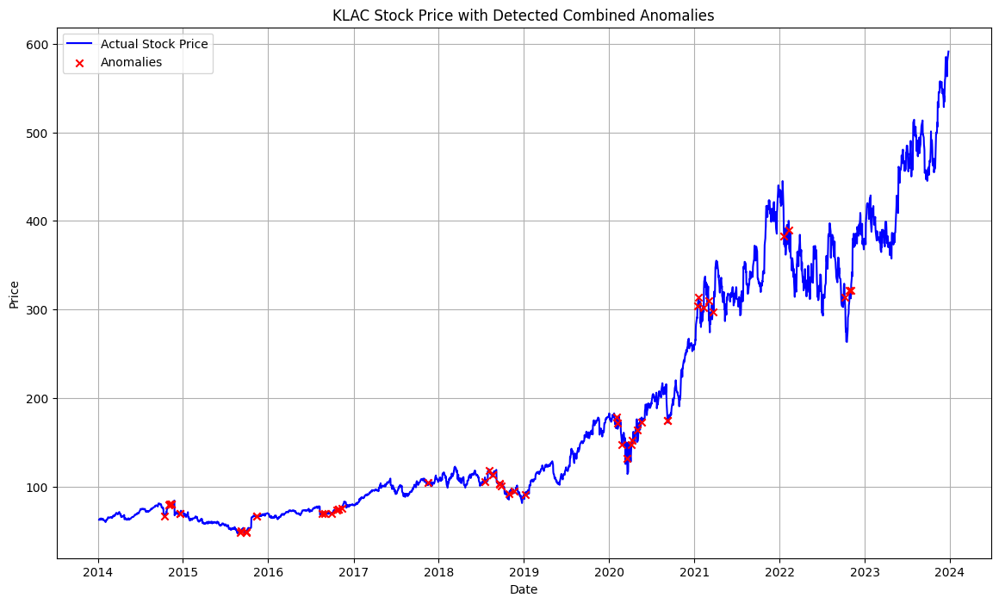

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 384.71it/s]


Combined Score Threshold: 0.2787779040238732


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1722.18it/s]


Sequence 0 is anomalous with combined score 0.34456833801243403
Sequence 16 is anomalous with combined score 0.28039058648857756
Sequence 25 is anomalous with combined score 0.6319354974497656
Sequence 26 is anomalous with combined score 0.7876616168298384
Sequence 27 is anomalous with combined score 0.32018933630015206
Sequence 29 is anomalous with combined score 0.3046592312820985
Sequence 30 is anomalous with combined score 0.384334315251312
Sequence 53 is anomalous with combined score 0.36962314154935605
Sequence 54 is anomalous with combined score 0.36775471140642346
Sequence 88 is anomalous with combined score 0.3171090293550733
Sequence 96 is anomalous with combined score 0.3099861471433665
Sequence 101 is anomalous with combined score 0.4162999478116421
Sequence 102 is anomalous with combined score 0.6661019762114514
Sequence 103 is anomalous with combined score 0.5267921966096296
Sequence 108 is anomalous with combined score 0.2794378953569202
Sequence 117 is anomalous with co

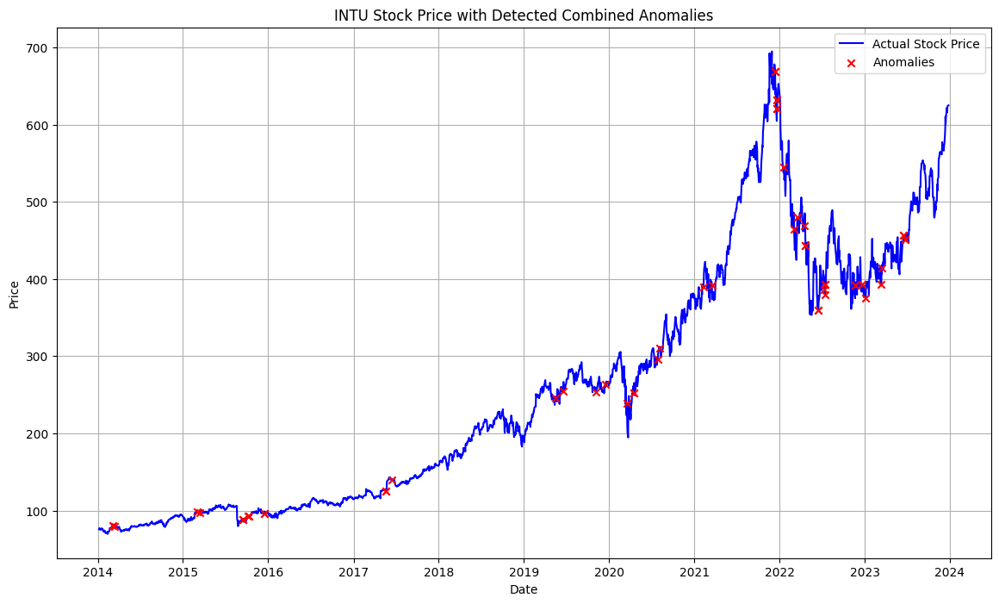

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.82it/s]


Combined Score Threshold: 0.23777678528900523


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2063.63it/s]


Sequence 0 is anomalous with combined score 0.2767928003670838
Sequence 3 is anomalous with combined score 0.24792492344145875
Sequence 11 is anomalous with combined score 0.3171822144182404
Sequence 12 is anomalous with combined score 0.27254090446347745
Sequence 13 is anomalous with combined score 0.36289932432483685
Sequence 14 is anomalous with combined score 0.35925512529448156
Sequence 27 is anomalous with combined score 0.28412572687390114
Sequence 28 is anomalous with combined score 0.28401382977170536
Sequence 33 is anomalous with combined score 0.496299258207887
Sequence 34 is anomalous with combined score 0.49072743764971094
Sequence 36 is anomalous with combined score 0.2819954693064442
Sequence 40 is anomalous with combined score 0.2733184581549386
Sequence 47 is anomalous with combined score 0.2379155075012844
Sequence 63 is anomalous with combined score 0.25219726486903793
Sequence 79 is anomalous with combined score 0.37423425816157313
Sequence 80 is anomalous with comb

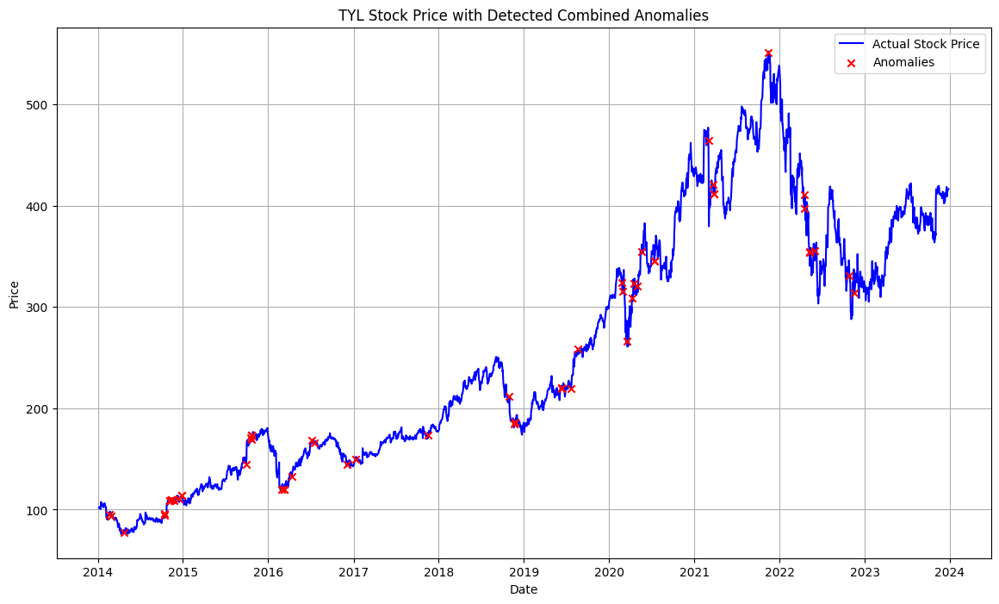

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 406.53it/s]


Combined Score Threshold: 0.3735061447875572


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1943.62it/s]


Sequence 32 is anomalous with combined score 0.461902122968206
Sequence 33 is anomalous with combined score 0.5054971869637088
Sequence 38 is anomalous with combined score 0.40779166915175014
Sequence 40 is anomalous with combined score 0.52868481712294
Sequence 41 is anomalous with combined score 0.5058677506940106
Sequence 45 is anomalous with combined score 0.43789364920762336
Sequence 46 is anomalous with combined score 0.6091057033292009
Sequence 47 is anomalous with combined score 0.4160477355952651
Sequence 78 is anomalous with combined score 0.4218072977066474
Sequence 79 is anomalous with combined score 0.39838313251547885
Sequence 96 is anomalous with combined score 0.41001143384745864
Sequence 101 is anomalous with combined score 0.54583985991221
Sequence 102 is anomalous with combined score 0.8932580558442794
Sequence 103 is anomalous with combined score 0.8594447220143779
Sequence 104 is anomalous with combined score 0.594591820124138
Sequence 105 is anomalous with combine

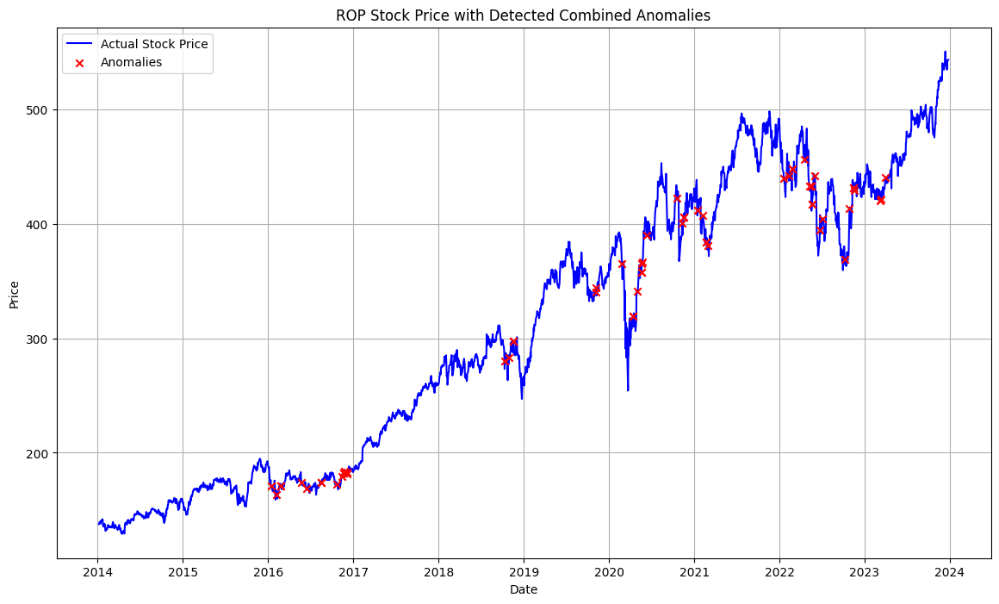

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.28it/s]


Combined Score Threshold: 0.4595413162228542


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2093.90it/s]


Sequence 2 is anomalous with combined score 0.604073194821846
Sequence 3 is anomalous with combined score 0.552706894447908
Sequence 13 is anomalous with combined score 0.5370471372352459
Sequence 14 is anomalous with combined score 0.565968868196561
Sequence 26 is anomalous with combined score 0.5287225814582044
Sequence 27 is anomalous with combined score 0.6626787955719151
Sequence 28 is anomalous with combined score 0.4994613651634437
Sequence 33 is anomalous with combined score 0.683799772211995
Sequence 34 is anomalous with combined score 0.7057037000671789
Sequence 61 is anomalous with combined score 0.5211739571506914
Sequence 78 is anomalous with combined score 0.6827754596481965
Sequence 79 is anomalous with combined score 0.7252804528784003
Sequence 80 is anomalous with combined score 0.5045115100937528
Sequence 81 is anomalous with combined score 0.6956280165451767
Sequence 82 is anomalous with combined score 0.5160248072794559
Sequence 101 is anomalous with combined score 

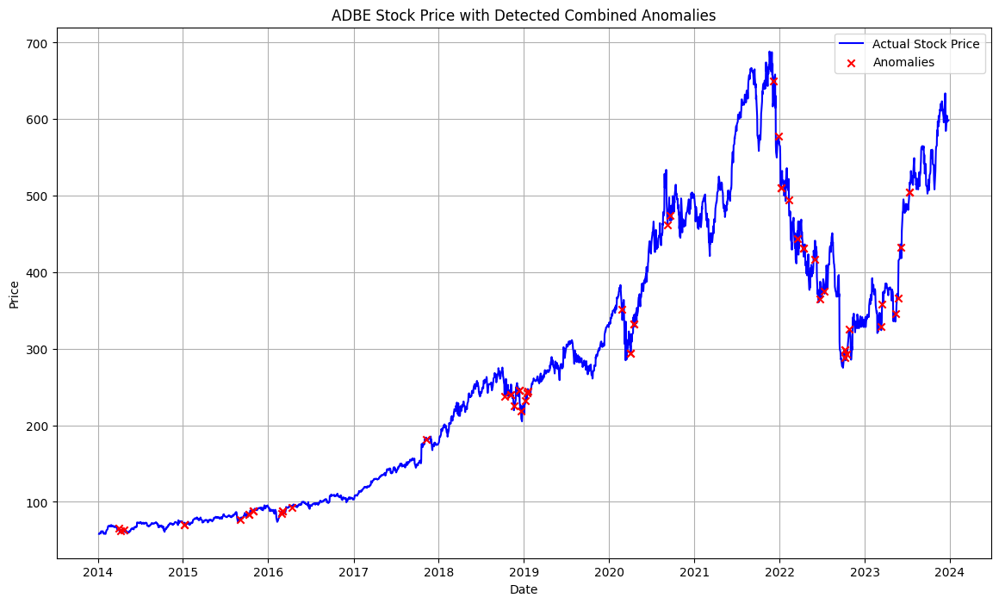

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 321.41it/s]


Combined Score Threshold: 0.39058986043565314


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1933.42it/s]


Sequence 29 is anomalous with combined score 0.5159814956016486
Sequence 30 is anomalous with combined score 0.5337939634753267
Sequence 51 is anomalous with combined score 0.6575759238554685
Sequence 52 is anomalous with combined score 0.46799840330993864
Sequence 67 is anomalous with combined score 0.39154745763660753
Sequence 89 is anomalous with combined score 0.4534663529414075
Sequence 93 is anomalous with combined score 0.4069117179488714
Sequence 100 is anomalous with combined score 0.4031307861709621
Sequence 101 is anomalous with combined score 0.6755957667325354
Sequence 102 is anomalous with combined score 0.5920436903600795
Sequence 106 is anomalous with combined score 0.5463750387215618
Sequence 109 is anomalous with combined score 0.41963916497945963
Sequence 110 is anomalous with combined score 0.4114870730092283
Sequence 114 is anomalous with combined score 0.4165437813200176
Sequence 117 is anomalous with combined score 0.5168468194213608
Sequence 118 is anomalous wit

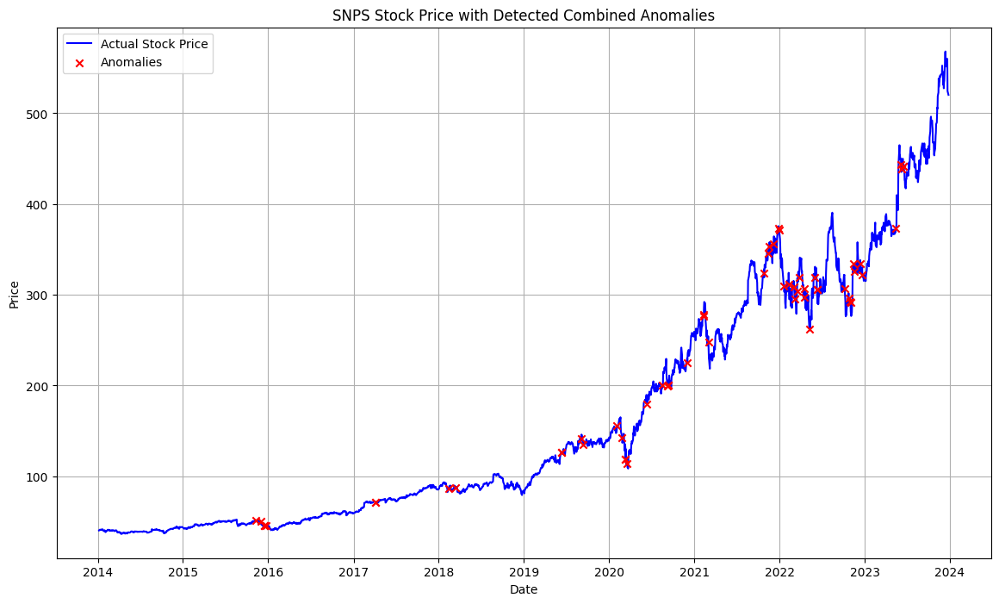

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.66it/s]


Combined Score Threshold: 0.3129669023022523


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2050.94it/s]


Sequence 11 is anomalous with combined score 0.4449732738112061
Sequence 12 is anomalous with combined score 0.37462362476791167
Sequence 18 is anomalous with combined score 0.6900470167293885
Sequence 19 is anomalous with combined score 0.5618383824758304
Sequence 25 is anomalous with combined score 0.32386408874304523
Sequence 26 is anomalous with combined score 0.4191840875579481
Sequence 31 is anomalous with combined score 0.3260437607566636
Sequence 32 is anomalous with combined score 0.5680290517581547
Sequence 33 is anomalous with combined score 0.7904132263297061
Sequence 34 is anomalous with combined score 0.6101110321353187
Sequence 51 is anomalous with combined score 0.3703294604831744
Sequence 62 is anomalous with combined score 0.3442849450083076
Sequence 68 is anomalous with combined score 0.31927500524786356
Sequence 94 is anomalous with combined score 0.3167742258407715
Sequence 101 is anomalous with combined score 0.3360790531026623
Sequence 102 is anomalous with combi

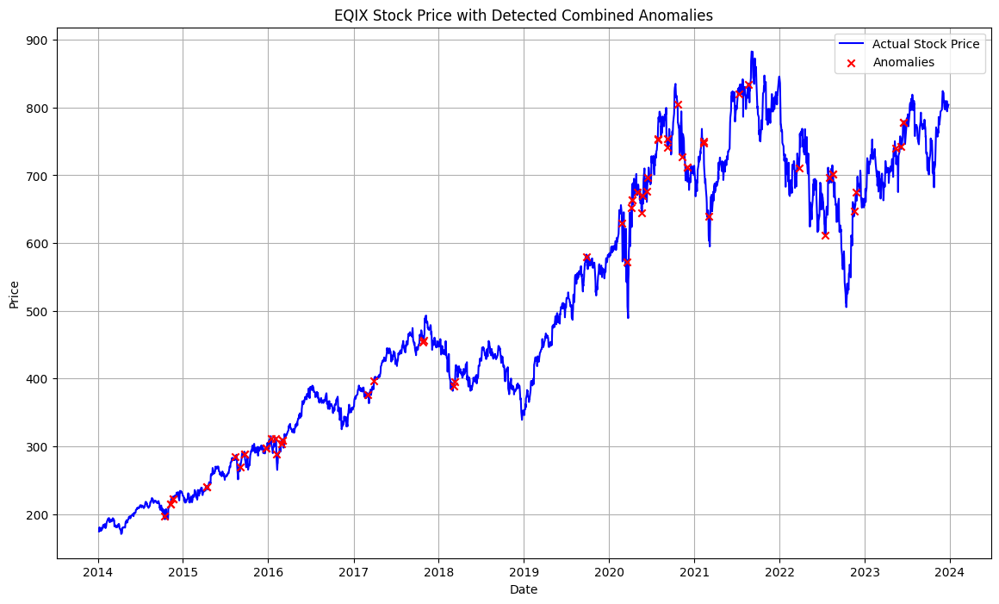

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 415.87it/s]


Combined Score Threshold: 0.2436374678207303


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1931.61it/s]


Sequence 39 is anomalous with combined score 0.24923709900023355
Sequence 45 is anomalous with combined score 0.2506054835837641
Sequence 46 is anomalous with combined score 0.31398032412620747
Sequence 55 is anomalous with combined score 0.26838312919759155
Sequence 67 is anomalous with combined score 0.31846391391531026
Sequence 74 is anomalous with combined score 0.24406461483914724
Sequence 75 is anomalous with combined score 0.27181556657036876
Sequence 80 is anomalous with combined score 0.26544563875212057
Sequence 81 is anomalous with combined score 0.42764916325534547
Sequence 82 is anomalous with combined score 0.2540217579112353
Sequence 95 is anomalous with combined score 0.2514093316946513
Sequence 101 is anomalous with combined score 0.6727811651079555
Sequence 102 is anomalous with combined score 0.9999942164305586
Sequence 103 is anomalous with combined score 0.693702608309349
Sequence 104 is anomalous with combined score 0.3770463089283379
Sequence 105 is anomalous wit

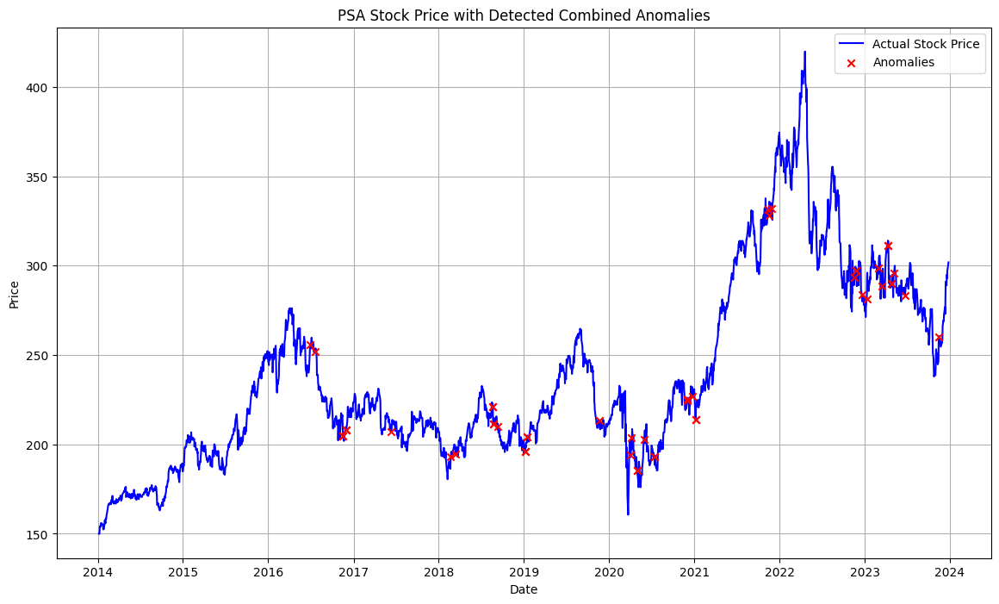

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 380.05it/s]


Combined Score Threshold: 0.315051601317027


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1824.01it/s]


Sequence 1 is anomalous with combined score 0.6083190992166897
Sequence 2 is anomalous with combined score 0.6173220583527448
Sequence 29 is anomalous with combined score 0.3259430396531562
Sequence 42 is anomalous with combined score 0.3297550486053543
Sequence 55 is anomalous with combined score 0.31552089384919
Sequence 63 is anomalous with combined score 0.3229383476559634
Sequence 91 is anomalous with combined score 0.3174874158851645
Sequence 102 is anomalous with combined score 0.528887439979603
Sequence 103 is anomalous with combined score 0.48202747719927236
Sequence 104 is anomalous with combined score 0.4044720178752954
Sequence 105 is anomalous with combined score 0.4106903923338895
Sequence 106 is anomalous with combined score 0.3535116616167824
Sequence 107 is anomalous with combined score 0.3561004807123539
Sequence 108 is anomalous with combined score 0.3882261844115251
Sequence 109 is anomalous with combined score 0.33278686953692205
Sequence 110 is anomalous with comb

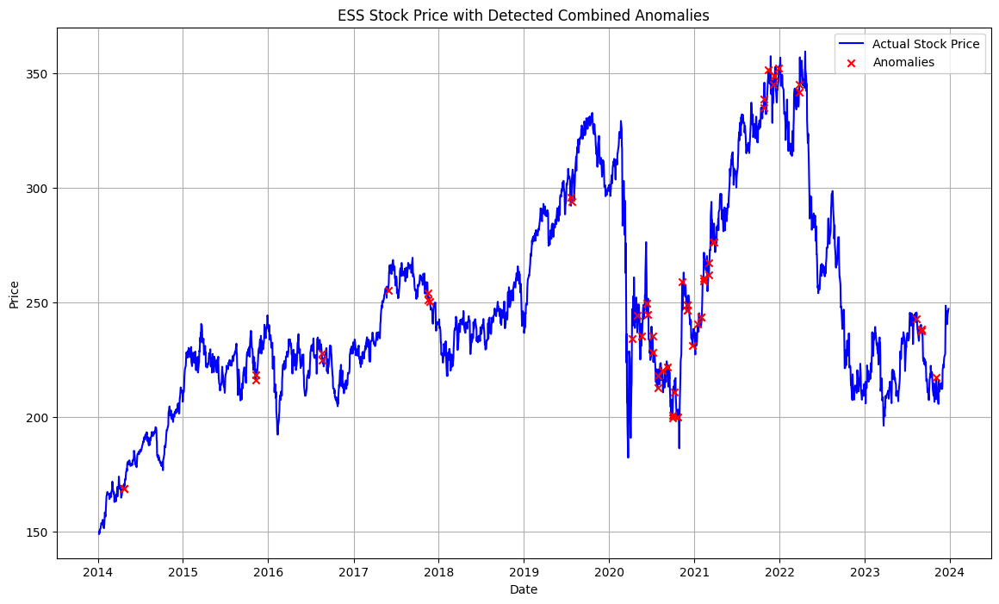

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.61it/s]


Combined Score Threshold: 0.2929281164085412


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2064.23it/s]


Sequence 33 is anomalous with combined score 0.4670751912615707
Sequence 34 is anomalous with combined score 0.5949659102629041
Sequence 35 is anomalous with combined score 0.40099691015274486
Sequence 36 is anomalous with combined score 0.30654695903500095
Sequence 37 is anomalous with combined score 0.3350466389736104
Sequence 39 is anomalous with combined score 0.6029724553435847
Sequence 40 is anomalous with combined score 0.7445341730882742
Sequence 41 is anomalous with combined score 0.3234645440396533
Sequence 45 is anomalous with combined score 0.3592141210011627
Sequence 46 is anomalous with combined score 0.3788627656013943
Sequence 91 is anomalous with combined score 0.319823016344886
Sequence 101 is anomalous with combined score 0.6009612114483951
Sequence 102 is anomalous with combined score 0.9999882066657578
Sequence 103 is anomalous with combined score 0.6700964278241581
Sequence 104 is anomalous with combined score 0.4026328635367306
Sequence 105 is anomalous with comb

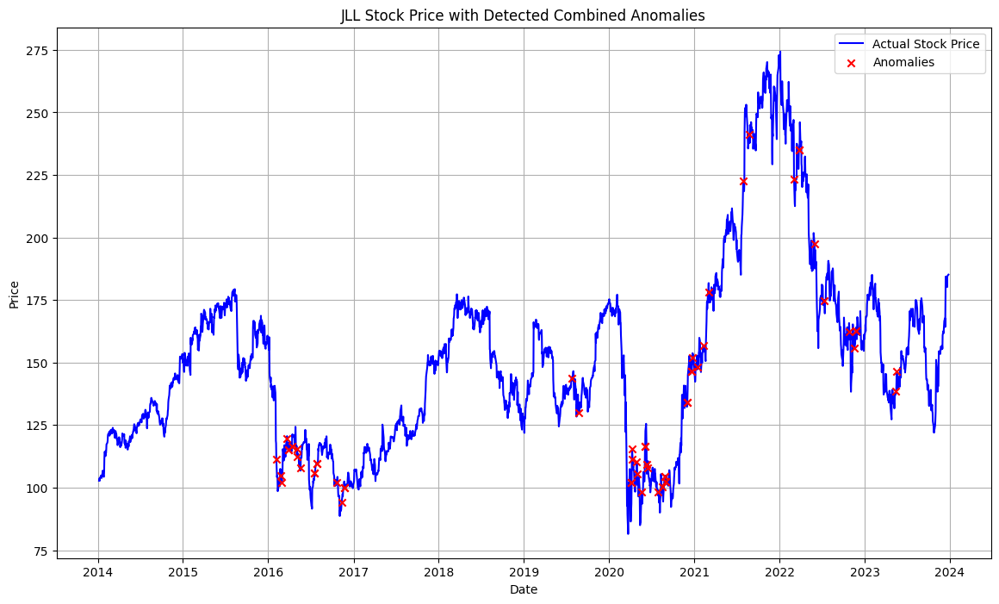

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 392.10it/s]


Combined Score Threshold: 0.18034791033175152


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1953.04it/s]


Sequence 11 is anomalous with combined score 0.1936094675965379
Sequence 32 is anomalous with combined score 0.18495852981675343
Sequence 33 is anomalous with combined score 0.2140371851856272
Sequence 46 is anomalous with combined score 0.2307399631857232
Sequence 84 is anomalous with combined score 0.2111572781428305
Sequence 92 is anomalous with combined score 0.36848010091505945
Sequence 93 is anomalous with combined score 0.5652653265010105
Sequence 94 is anomalous with combined score 0.512344484032644
Sequence 95 is anomalous with combined score 0.36535588607058056
Sequence 96 is anomalous with combined score 0.19810178875294732
Sequence 101 is anomalous with combined score 0.4537799489005664
Sequence 102 is anomalous with combined score 0.6470468683565372
Sequence 103 is anomalous with combined score 0.3921999078327317
Sequence 104 is anomalous with combined score 0.3101236558113666
Sequence 105 is anomalous with combined score 0.3092832637878993
Sequence 106 is anomalous with c

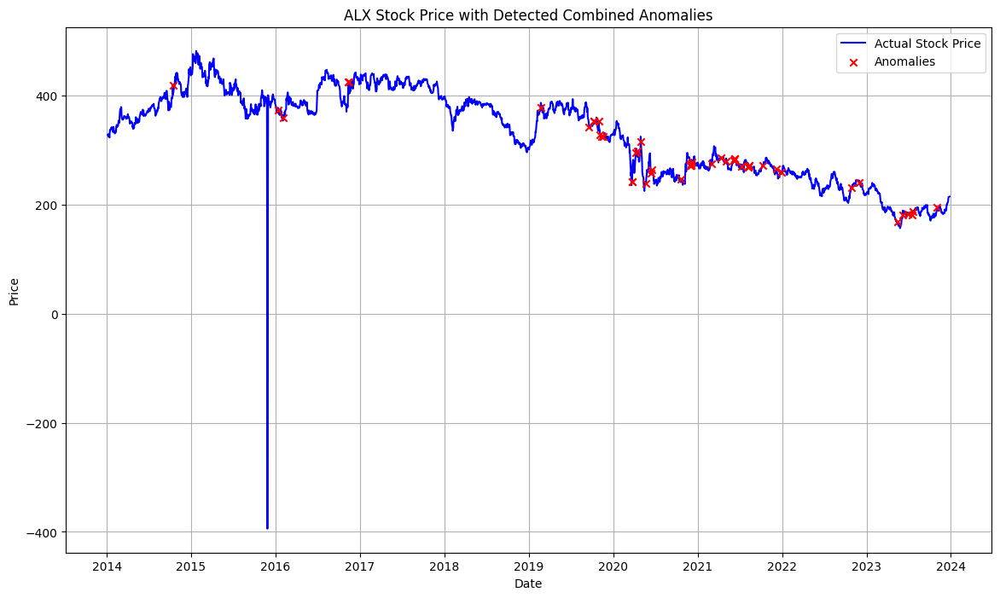

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.54it/s]


Combined Score Threshold: 0.2949259020491075


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2089.30it/s]


Sequence 1 is anomalous with combined score 0.32767873139183934
Sequence 2 is anomalous with combined score 0.33237548235201864
Sequence 3 is anomalous with combined score 0.35511192144154075
Sequence 26 is anomalous with combined score 0.3146502092023435
Sequence 27 is anomalous with combined score 0.3031549518339436
Sequence 28 is anomalous with combined score 0.3902806925908169
Sequence 29 is anomalous with combined score 0.3960976726820905
Sequence 30 is anomalous with combined score 0.29831545148679783
Sequence 32 is anomalous with combined score 0.4794597162277324
Sequence 33 is anomalous with combined score 0.6421476959668502
Sequence 34 is anomalous with combined score 0.40733945290628476
Sequence 38 is anomalous with combined score 0.30464290262706817
Sequence 39 is anomalous with combined score 0.2984290304071986
Sequence 40 is anomalous with combined score 0.3092834446055694
Sequence 45 is anomalous with combined score 0.2993568660837947
Sequence 46 is anomalous with combine

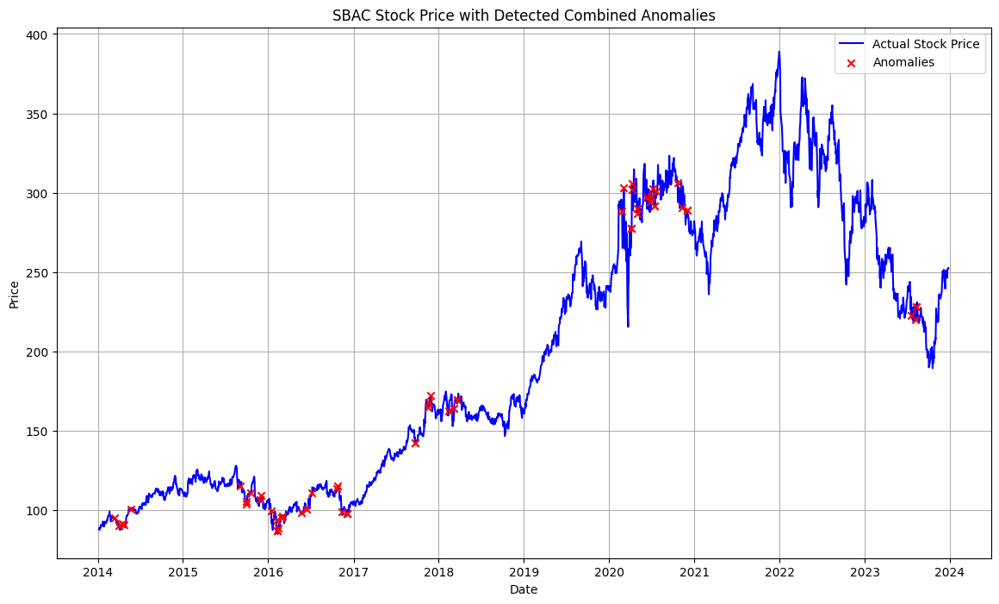

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 395.43it/s]


Combined Score Threshold: 0.2989716321683781


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1855.89it/s]


Sequence 17 is anomalous with combined score 0.6459113418708204
Sequence 18 is anomalous with combined score 0.639766924461935
Sequence 21 is anomalous with combined score 0.3162824973385335
Sequence 25 is anomalous with combined score 0.3186547382566589
Sequence 32 is anomalous with combined score 0.36475847522111077
Sequence 33 is anomalous with combined score 0.5311984884211218
Sequence 34 is anomalous with combined score 0.33555750162351433
Sequence 45 is anomalous with combined score 0.3537029708374093
Sequence 46 is anomalous with combined score 0.646737128125884
Sequence 47 is anomalous with combined score 0.6010970935264067
Sequence 63 is anomalous with combined score 0.3123426393489548
Sequence 66 is anomalous with combined score 0.3646053090061137
Sequence 67 is anomalous with combined score 0.4707638904583492
Sequence 68 is anomalous with combined score 0.38154097507721674
Sequence 69 is anomalous with combined score 0.33074414865143564
Sequence 79 is anomalous with combined

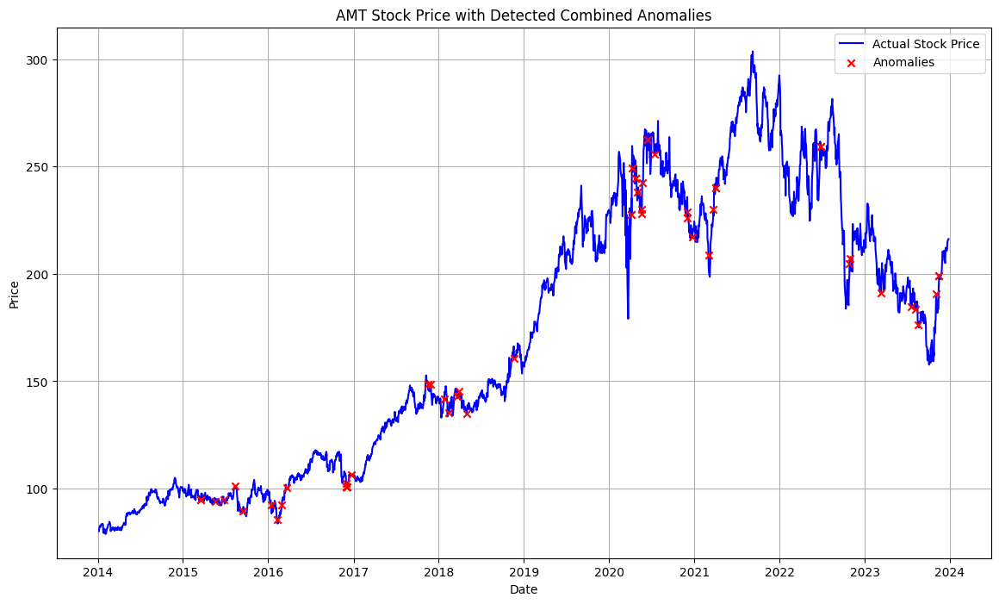

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 374.76it/s]


Combined Score Threshold: 0.20627100927375774


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1831.65it/s]


Sequence 0 is anomalous with combined score 0.2765477326961789
Sequence 9 is anomalous with combined score 0.22469969702637993
Sequence 10 is anomalous with combined score 0.28090239516772675
Sequence 30 is anomalous with combined score 0.23822807438769328
Sequence 46 is anomalous with combined score 0.25118730295942043
Sequence 66 is anomalous with combined score 0.20905210017730963
Sequence 67 is anomalous with combined score 0.2546933876564615
Sequence 101 is anomalous with combined score 0.2858555638962051
Sequence 102 is anomalous with combined score 0.9999921972671684
Sequence 103 is anomalous with combined score 0.9728861184424933
Sequence 104 is anomalous with combined score 0.47501484088214513
Sequence 105 is anomalous with combined score 0.6016085595027443
Sequence 106 is anomalous with combined score 0.6378339432467828
Sequence 107 is anomalous with combined score 0.4427429320465567
Sequence 108 is anomalous with combined score 0.25897856480044296
Sequence 110 is anomalous w

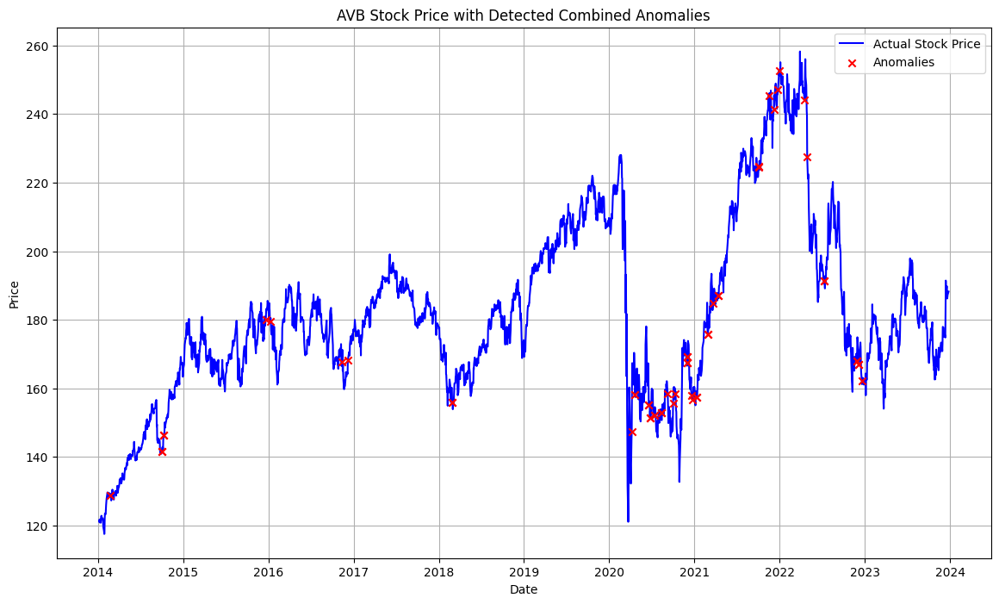

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 412.59it/s]


Combined Score Threshold: 0.16033963827501216


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2072.23it/s]


Sequence 8 is anomalous with combined score 0.16101388998482838
Sequence 31 is anomalous with combined score 0.16421746958373232
Sequence 35 is anomalous with combined score 0.17251973580059787
Sequence 39 is anomalous with combined score 0.17130505176577615
Sequence 87 is anomalous with combined score 0.5001584766424642
Sequence 88 is anomalous with combined score 0.5652673922404449
Sequence 101 is anomalous with combined score 0.4270859842617098
Sequence 102 is anomalous with combined score 0.7531770013904109
Sequence 103 is anomalous with combined score 0.492829849971409
Sequence 104 is anomalous with combined score 0.28054780833569115
Sequence 105 is anomalous with combined score 0.32946352358665676
Sequence 106 is anomalous with combined score 0.23760836362870896
Sequence 111 is anomalous with combined score 0.1884305233550868
Sequence 112 is anomalous with combined score 0.196891304437158
Sequence 113 is anomalous with combined score 0.2849666488461038
Sequence 114 is anomalous w

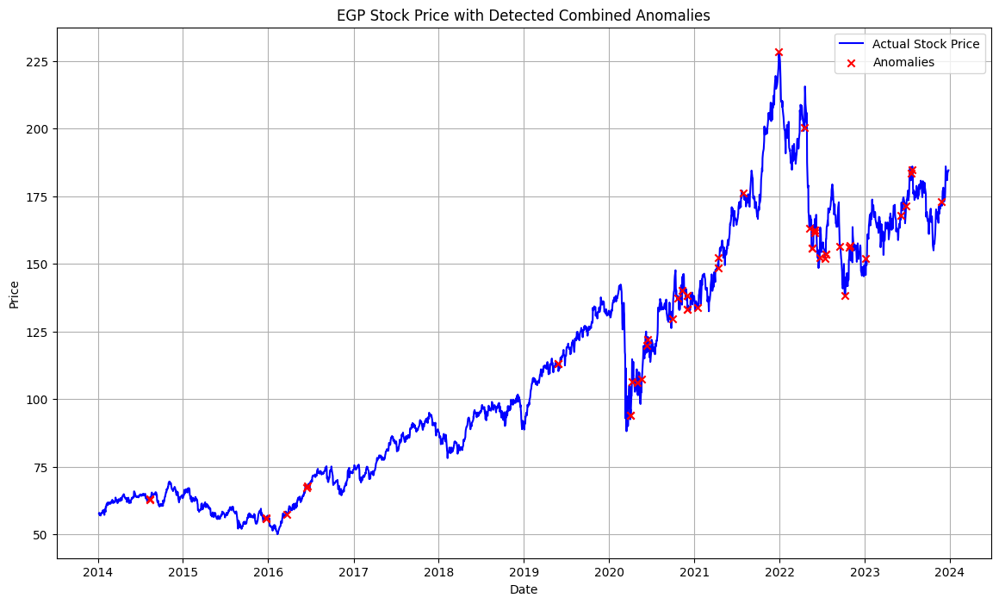

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 423.77it/s]


Combined Score Threshold: 0.2231930321355556


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1993.28it/s]


Sequence 32 is anomalous with combined score 0.5142071683940563
Sequence 33 is anomalous with combined score 0.6388401545672229
Sequence 34 is anomalous with combined score 0.29201849711377154
Sequence 45 is anomalous with combined score 0.24393693111614326
Sequence 101 is anomalous with combined score 0.3975385819333813
Sequence 102 is anomalous with combined score 0.6965178645386554
Sequence 103 is anomalous with combined score 0.6481822187114294
Sequence 104 is anomalous with combined score 0.38516887131137345
Sequence 105 is anomalous with combined score 0.2624978964391622
Sequence 106 is anomalous with combined score 0.22633027465044972
Sequence 112 is anomalous with combined score 0.24345033724648182
Sequence 113 is anomalous with combined score 0.3638522744261752
Sequence 114 is anomalous with combined score 0.2710493761609404
Sequence 118 is anomalous with combined score 0.23558483392250484
Sequence 128 is anomalous with combined score 0.23339528950877403
Sequence 129 is anomal

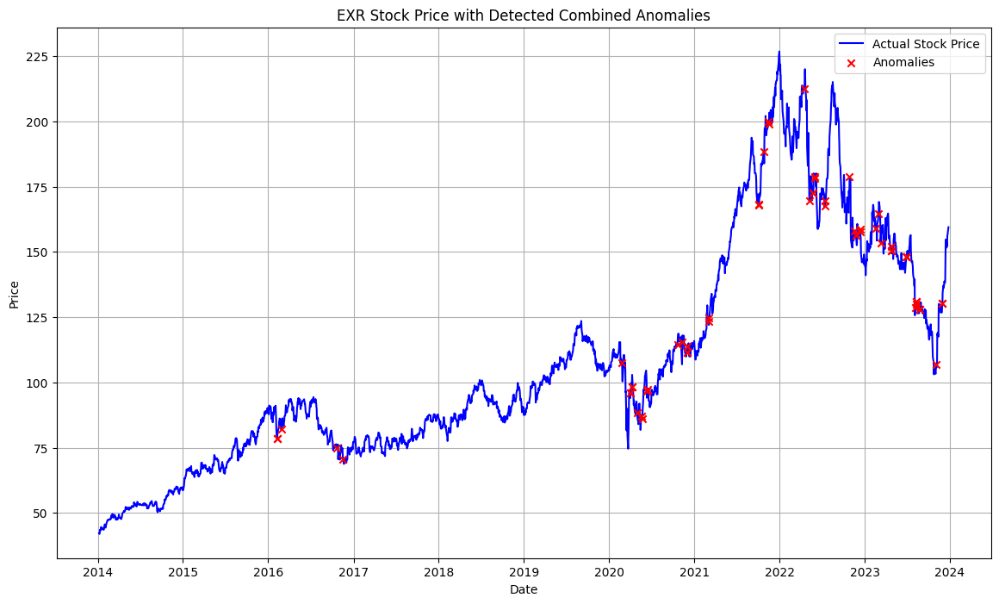

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 418.66it/s]


Combined Score Threshold: 0.1719059810941155


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2054.74it/s]


Sequence 6 is anomalous with combined score 0.17770887516743772
Sequence 22 is anomalous with combined score 0.17296871629665184
Sequence 23 is anomalous with combined score 0.17225968810164471
Sequence 28 is anomalous with combined score 0.1919127411308086
Sequence 67 is anomalous with combined score 0.1892056222274954
Sequence 68 is anomalous with combined score 0.17773228138177283
Sequence 102 is anomalous with combined score 0.39184668036655496
Sequence 103 is anomalous with combined score 0.3750090229711225
Sequence 104 is anomalous with combined score 0.23117682595614836
Sequence 105 is anomalous with combined score 0.2049404452454577
Sequence 108 is anomalous with combined score 0.1939499782064827
Sequence 111 is anomalous with combined score 0.2586861954795376
Sequence 112 is anomalous with combined score 0.3661429334832679
Sequence 113 is anomalous with combined score 0.2826175280433165
Sequence 114 is anomalous with combined score 0.17756151875030912
Sequence 115 is anomalous

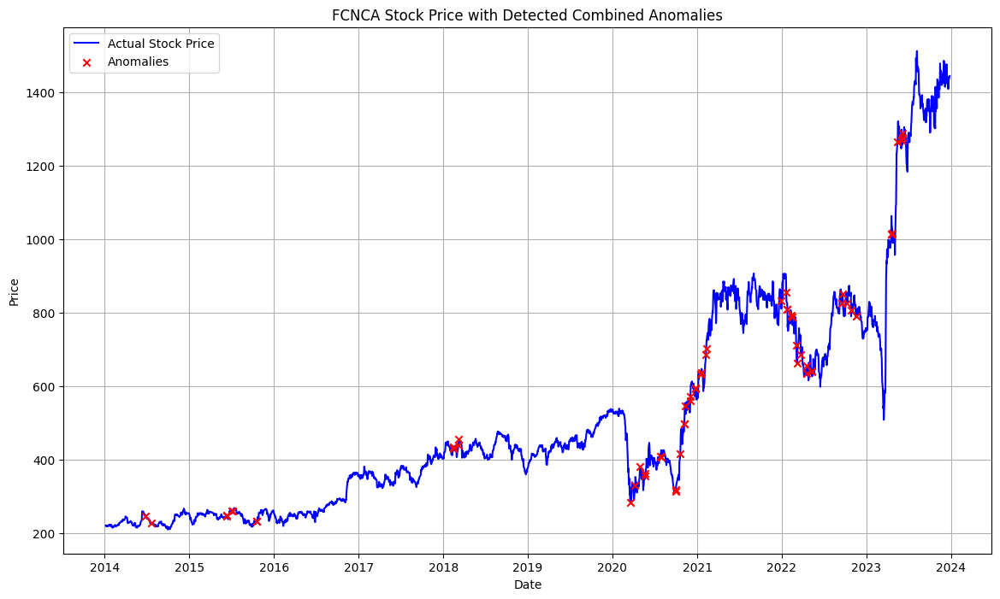

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.48it/s]


Combined Score Threshold: 0.17902431894003903


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2068.23it/s]


Sequence 25 is anomalous with combined score 0.28676349617699853
Sequence 26 is anomalous with combined score 0.2710655789077775
Sequence 28 is anomalous with combined score 0.19153555115284293
Sequence 29 is anomalous with combined score 0.18301471466281577
Sequence 33 is anomalous with combined score 0.2571781167657422
Sequence 34 is anomalous with combined score 0.293666501228088
Sequence 50 is anomalous with combined score 0.1795496331349001
Sequence 68 is anomalous with combined score 0.1950829894226746
Sequence 69 is anomalous with combined score 0.4132042616176031
Sequence 70 is anomalous with combined score 0.5900814696358518
Sequence 71 is anomalous with combined score 0.4738937499027092
Sequence 72 is anomalous with combined score 0.3193061027900167
Sequence 73 is anomalous with combined score 0.19221261092942576
Sequence 101 is anomalous with combined score 0.3846835606740801
Sequence 102 is anomalous with combined score 0.645147126034187
Sequence 103 is anomalous with combi

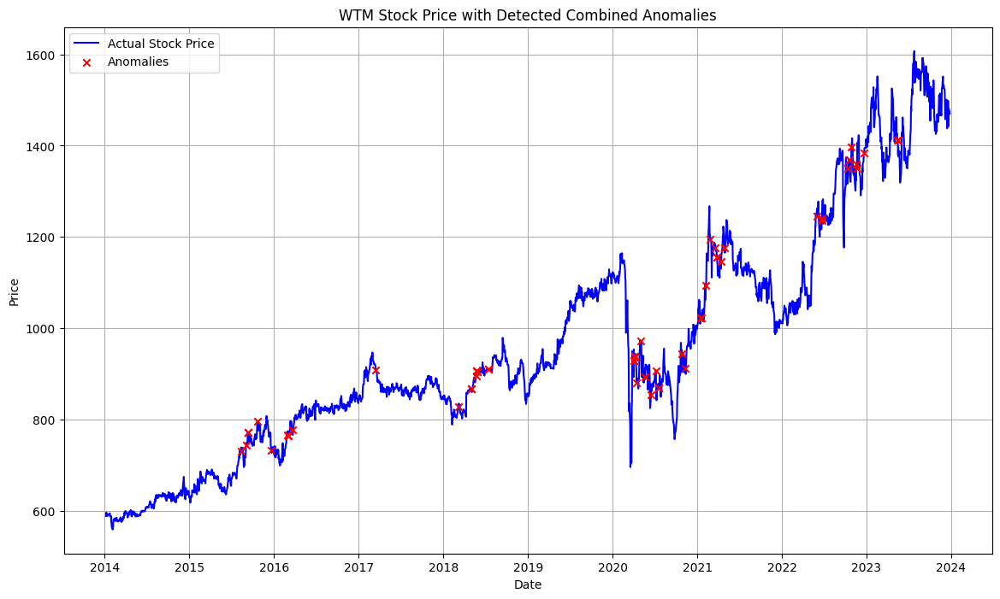

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.56it/s]


Combined Score Threshold: 0.3264846553555543


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2069.79it/s]


Sequence 29 is anomalous with combined score 0.5702475558610293
Sequence 30 is anomalous with combined score 0.6981210634874848
Sequence 32 is anomalous with combined score 0.40294198641666545
Sequence 33 is anomalous with combined score 0.5935389104403285
Sequence 34 is anomalous with combined score 0.342777982607546
Sequence 45 is anomalous with combined score 0.42989679558806293
Sequence 46 is anomalous with combined score 0.677045302328315
Sequence 47 is anomalous with combined score 0.472841216811483
Sequence 78 is anomalous with combined score 0.33505127961817743
Sequence 80 is anomalous with combined score 0.34916105696137145
Sequence 81 is anomalous with combined score 0.43755352056800556
Sequence 101 is anomalous with combined score 0.5255032297146429
Sequence 102 is anomalous with combined score 0.8081912704513087
Sequence 103 is anomalous with combined score 0.6916565314263318
Sequence 104 is anomalous with combined score 0.557550914232164
Sequence 105 is anomalous with comb

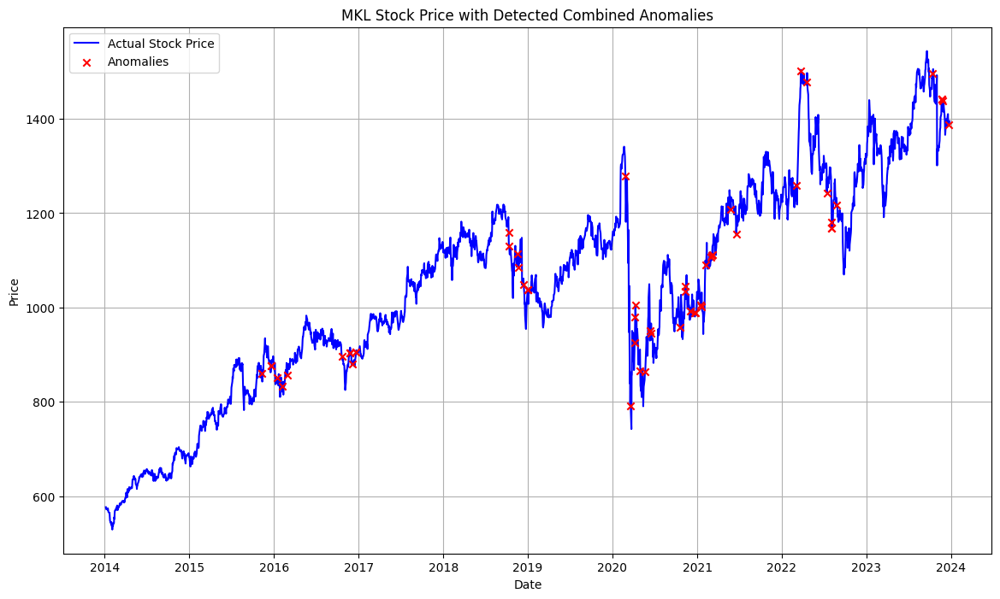

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.92it/s]


Combined Score Threshold: 0.20233500655950987


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1934.29it/s]


Sequence 28 is anomalous with combined score 0.22988571704195937
Sequence 30 is anomalous with combined score 0.210104288728817
Sequence 31 is anomalous with combined score 0.23351731807264975
Sequence 32 is anomalous with combined score 0.3148786970712594
Sequence 33 is anomalous with combined score 0.3304684837086632
Sequence 78 is anomalous with combined score 0.3333365257185684
Sequence 79 is anomalous with combined score 0.3373658646301954
Sequence 101 is anomalous with combined score 0.39529877260626667
Sequence 102 is anomalous with combined score 0.7482962639293671
Sequence 103 is anomalous with combined score 0.594754838268639
Sequence 104 is anomalous with combined score 0.8659238785691815
Sequence 105 is anomalous with combined score 0.9405760362831761
Sequence 106 is anomalous with combined score 0.40388876509507177
Sequence 107 is anomalous with combined score 0.2771275551289133
Sequence 108 is anomalous with combined score 0.20540997669749067
Sequence 110 is anomalous wit

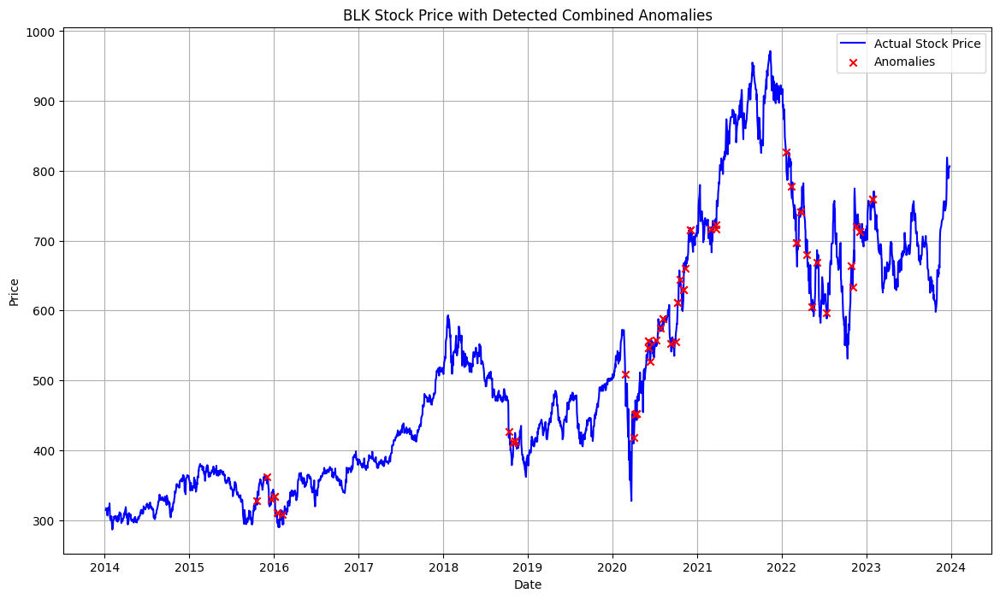

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.28it/s]


Combined Score Threshold: 0.3826168836459431


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2080.65it/s]


Sequence 29 is anomalous with combined score 0.4057392609271738
Sequence 69 is anomalous with combined score 0.5882294961755327
Sequence 70 is anomalous with combined score 0.5718123943971343
Sequence 101 is anomalous with combined score 0.40084382809958896
Sequence 102 is anomalous with combined score 0.544262252891706
Sequence 103 is anomalous with combined score 0.56036686232551
Sequence 104 is anomalous with combined score 0.3938701154111739
Sequence 105 is anomalous with combined score 0.5458974755565926
Sequence 106 is anomalous with combined score 0.5388052774182092
Sequence 107 is anomalous with combined score 0.46620687620761214
Sequence 108 is anomalous with combined score 0.466939986261188
Sequence 109 is anomalous with combined score 0.44438787904677757
Sequence 112 is anomalous with combined score 0.5662336780622494
Sequence 113 is anomalous with combined score 0.5469214383772286
Sequence 114 is anomalous with combined score 0.4053628991998188
Sequence 115 is anomalous wit

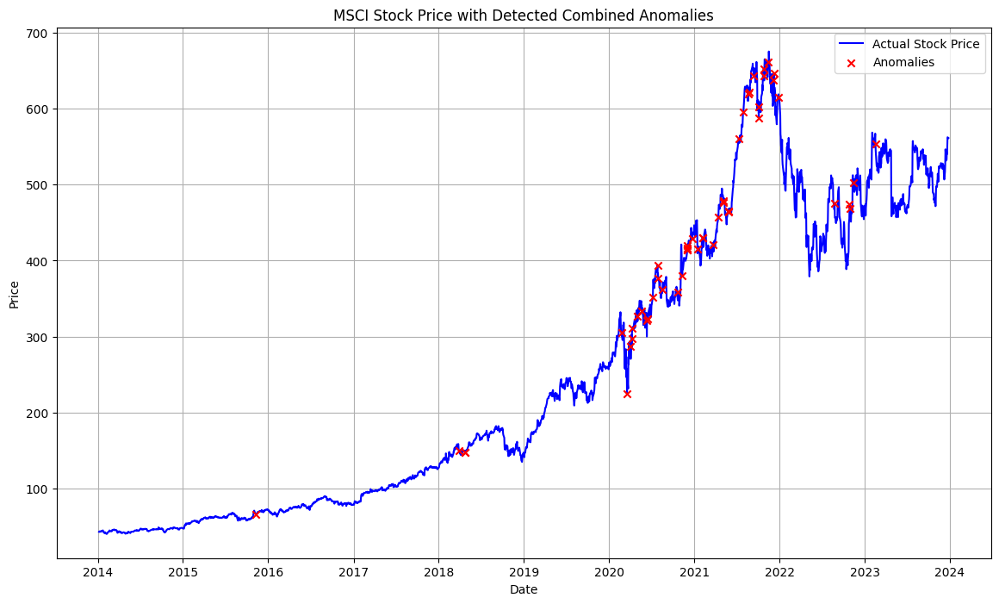

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.48it/s]


Combined Score Threshold: 0.3098438459322359


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1936.05it/s]


Sequence 32 is anomalous with combined score 0.5065474647388596
Sequence 33 is anomalous with combined score 0.7463933507002607
Sequence 34 is anomalous with combined score 0.6035669141285974
Sequence 46 is anomalous with combined score 0.33601822767330547
Sequence 47 is anomalous with combined score 0.4207632871956426
Sequence 66 is anomalous with combined score 0.45572992491505954
Sequence 79 is anomalous with combined score 0.5210618786632861
Sequence 80 is anomalous with combined score 0.5269627351159581
Sequence 81 is anomalous with combined score 0.5142129340180912
Sequence 82 is anomalous with combined score 0.5973170014913634
Sequence 101 is anomalous with combined score 0.5422065690958666
Sequence 102 is anomalous with combined score 0.948035336254416
Sequence 103 is anomalous with combined score 0.7892884792255508
Sequence 104 is anomalous with combined score 0.35123463924900206
Sequence 105 is anomalous with combined score 0.4020307555899225
Sequence 106 is anomalous with co

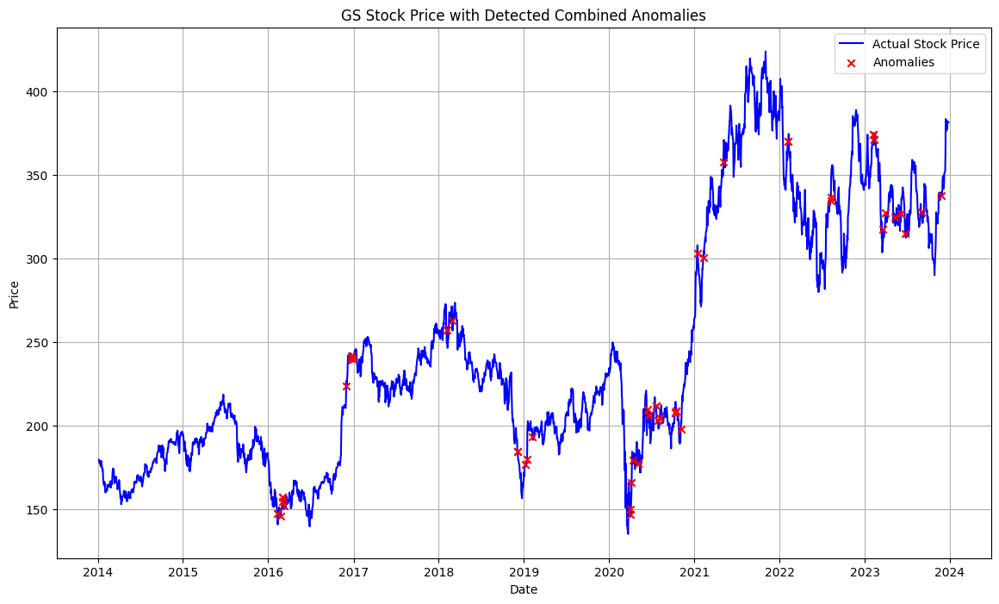

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.88it/s]


Combined Score Threshold: 0.2803276161427516


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2073.86it/s]


Sequence 0 is anomalous with combined score 0.3884595213788496
Sequence 1 is anomalous with combined score 0.31484680615531957
Sequence 2 is anomalous with combined score 0.4199721520520844
Sequence 3 is anomalous with combined score 0.36737021197926445
Sequence 11 is anomalous with combined score 0.3157696689605749
Sequence 12 is anomalous with combined score 0.29877943251405237
Sequence 32 is anomalous with combined score 0.3008018180567221
Sequence 33 is anomalous with combined score 0.3690410909955284
Sequence 46 is anomalous with combined score 0.34038914843900125
Sequence 63 is anomalous with combined score 0.28755953351235586
Sequence 78 is anomalous with combined score 0.4434600723576856
Sequence 79 is anomalous with combined score 0.4508170610892659
Sequence 80 is anomalous with combined score 0.36097131125707377
Sequence 81 is anomalous with combined score 0.35327446071245705
Sequence 101 is anomalous with combined score 0.5505152693243001
Sequence 102 is anomalous with combi

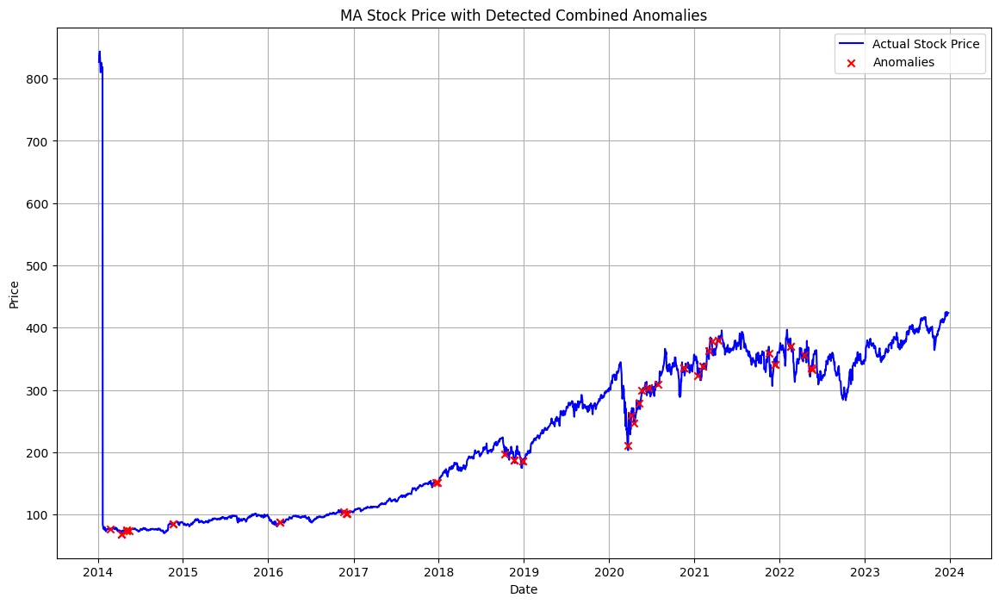

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.80it/s]


Combined Score Threshold: 0.35201670920821226


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2078.17it/s]


Sequence 16 is anomalous with combined score 0.3520301067702932
Sequence 28 is anomalous with combined score 0.37541314042418356
Sequence 29 is anomalous with combined score 0.45214308660862534
Sequence 30 is anomalous with combined score 0.39533563549290934
Sequence 31 is anomalous with combined score 0.4665489535668391
Sequence 32 is anomalous with combined score 0.5739502996768083
Sequence 33 is anomalous with combined score 0.5516141595763401
Sequence 34 is anomalous with combined score 0.4836082660588184
Sequence 39 is anomalous with combined score 0.3933918264994628
Sequence 40 is anomalous with combined score 0.36243928616268295
Sequence 46 is anomalous with combined score 0.4023254254947572
Sequence 78 is anomalous with combined score 0.5014448915918319
Sequence 79 is anomalous with combined score 0.4856679244152641
Sequence 80 is anomalous with combined score 0.35921042562642214
Sequence 81 is anomalous with combined score 0.3755525295089181
Sequence 101 is anomalous with comb

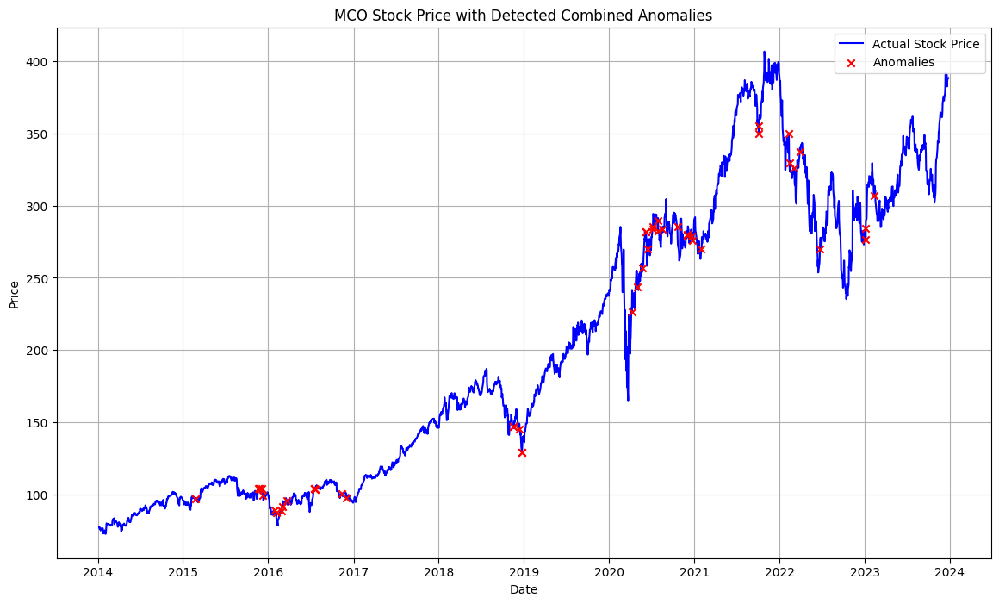

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 413.86it/s]


Combined Score Threshold: 0.23545243966120258


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2009.87it/s]


Sequence 19 is anomalous with combined score 0.4290110295085121
Sequence 20 is anomalous with combined score 0.4819602434834238
Sequence 32 is anomalous with combined score 0.45257799903145846
Sequence 33 is anomalous with combined score 0.6658698775895001
Sequence 34 is anomalous with combined score 0.5241135271938209
Sequence 35 is anomalous with combined score 0.3756893886653424
Sequence 36 is anomalous with combined score 0.24048790866961559
Sequence 39 is anomalous with combined score 0.315607610423806
Sequence 40 is anomalous with combined score 0.30790052343453367
Sequence 45 is anomalous with combined score 0.39494417481319943
Sequence 46 is anomalous with combined score 0.44609007242259513
Sequence 81 is anomalous with combined score 0.25916537784227633
Sequence 101 is anomalous with combined score 0.5253412410558678
Sequence 102 is anomalous with combined score 0.7156041733613683
Sequence 103 is anomalous with combined score 0.4235373857359314
Sequence 104 is anomalous with c

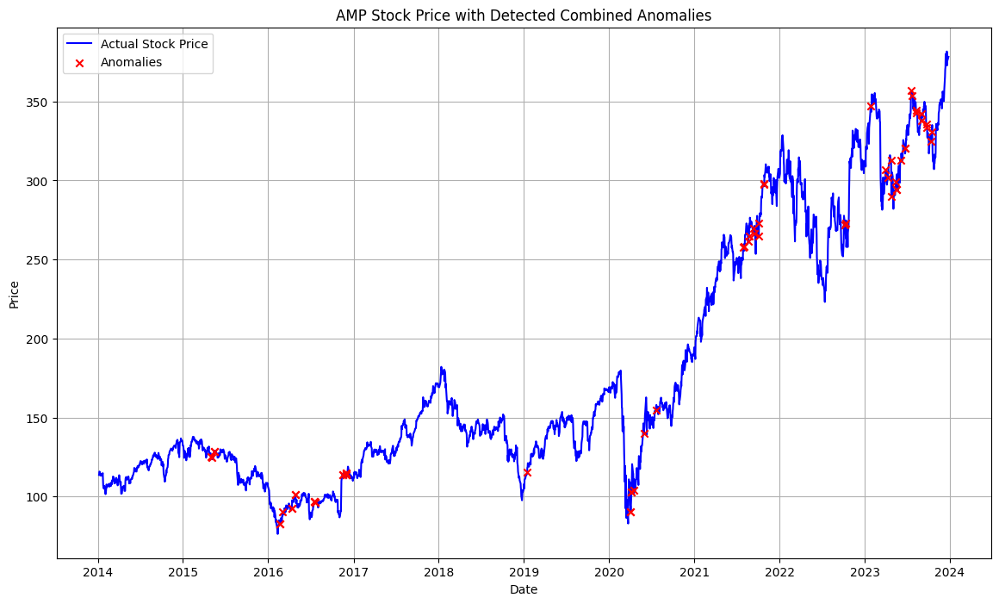

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.63it/s]


Combined Score Threshold: 0.3770197344704784


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1966.61it/s]


Sequence 1 is anomalous with combined score 0.4643729012753344
Sequence 2 is anomalous with combined score 0.5029956774475333
Sequence 44 is anomalous with combined score 0.4122437265233059
Sequence 56 is anomalous with combined score 0.4052909254102604
Sequence 57 is anomalous with combined score 0.37745378713871935
Sequence 60 is anomalous with combined score 0.3970021660418361
Sequence 61 is anomalous with combined score 0.4631927546594254
Sequence 64 is anomalous with combined score 0.5738720300795351
Sequence 65 is anomalous with combined score 0.46299060231393885
Sequence 89 is anomalous with combined score 0.620078207444841
Sequence 90 is anomalous with combined score 0.5658320650656332
Sequence 94 is anomalous with combined score 0.5187036388513776
Sequence 95 is anomalous with combined score 0.4466960329498777
Sequence 101 is anomalous with combined score 0.6115270941615016
Sequence 102 is anomalous with combined score 0.8841498062870321
Sequence 103 is anomalous with combined

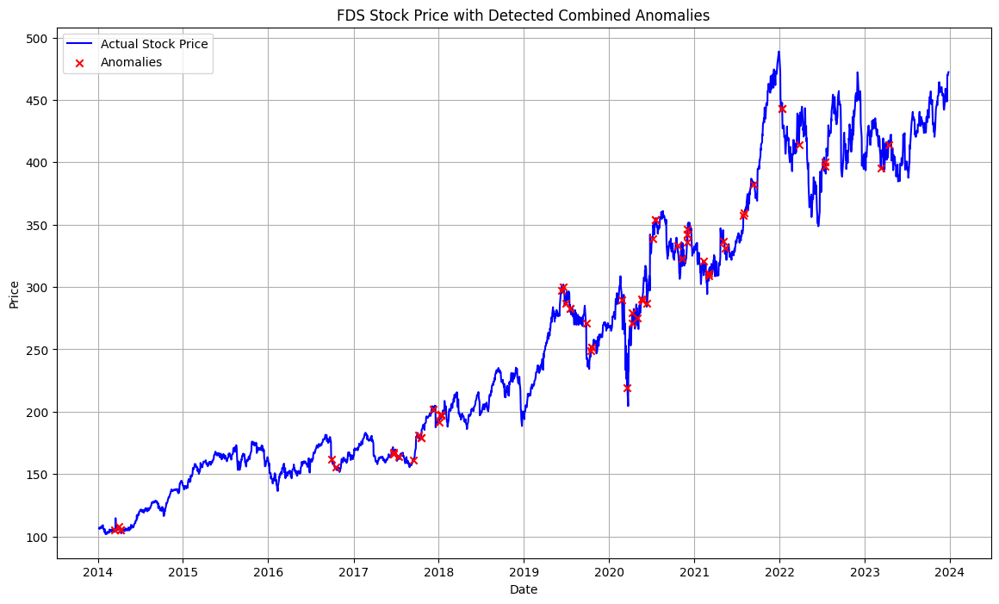

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 416.01it/s]


Combined Score Threshold: 0.30296711069127386


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2065.21it/s]


Sequence 0 is anomalous with combined score 0.3087191907311438
Sequence 2 is anomalous with combined score 0.517194095367947
Sequence 3 is anomalous with combined score 0.4157408638458747
Sequence 4 is anomalous with combined score 0.3701685822501726
Sequence 5 is anomalous with combined score 0.34435288548177745
Sequence 10 is anomalous with combined score 0.48238601304713424
Sequence 11 is anomalous with combined score 0.6418697594634878
Sequence 12 is anomalous with combined score 0.42542213002058044
Sequence 13 is anomalous with combined score 0.43488703548561963
Sequence 14 is anomalous with combined score 0.5140466039101982
Sequence 15 is anomalous with combined score 0.3271922535756079
Sequence 24 is anomalous with combined score 0.4200839234023113
Sequence 25 is anomalous with combined score 0.5101930090555582
Sequence 26 is anomalous with combined score 0.6711908707379017
Sequence 27 is anomalous with combined score 0.7086122527827121
Sequence 28 is anomalous with combined sco

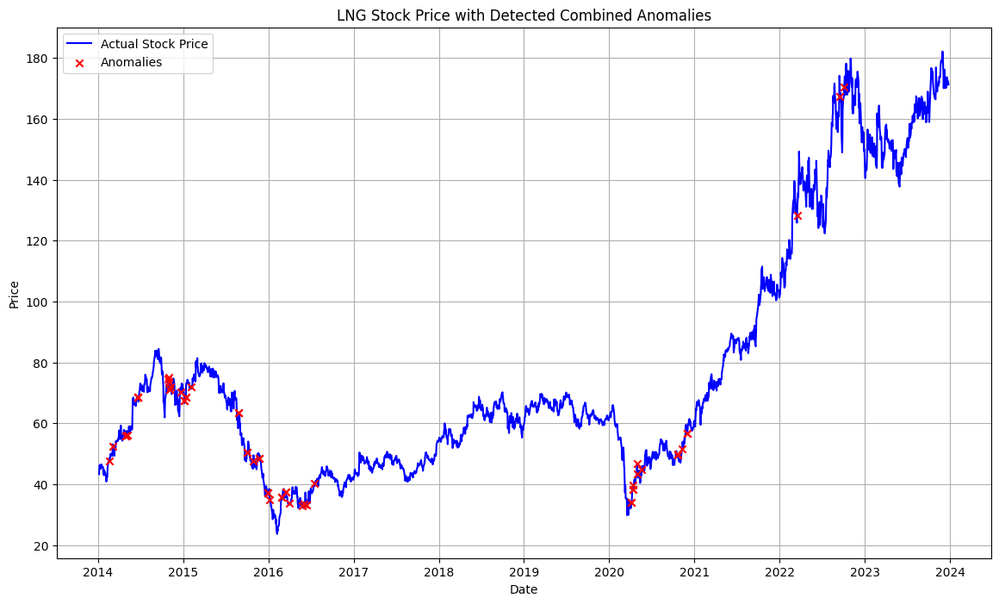

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 418.44it/s]


Combined Score Threshold: 0.18298278370471674


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2011.21it/s]


Sequence 32 is anomalous with combined score 0.18493139995359567
Sequence 33 is anomalous with combined score 0.18404881620475189
Sequence 80 is anomalous with combined score 0.32677553833068285
Sequence 81 is anomalous with combined score 0.37589683387848133
Sequence 96 is anomalous with combined score 0.18513415186278104
Sequence 97 is anomalous with combined score 0.20932119567158158
Sequence 101 is anomalous with combined score 0.6091113123393443
Sequence 102 is anomalous with combined score 0.9999919090917974
Sequence 103 is anomalous with combined score 0.8168499128007606
Sequence 104 is anomalous with combined score 0.46958887390910553
Sequence 105 is anomalous with combined score 0.2759841541409015
Sequence 106 is anomalous with combined score 0.2970073445088013
Sequence 107 is anomalous with combined score 0.24720263822005406
Sequence 110 is anomalous with combined score 0.22534605411021075
Sequence 111 is anomalous with combined score 0.26332772683530375
Sequence 112 is anoma

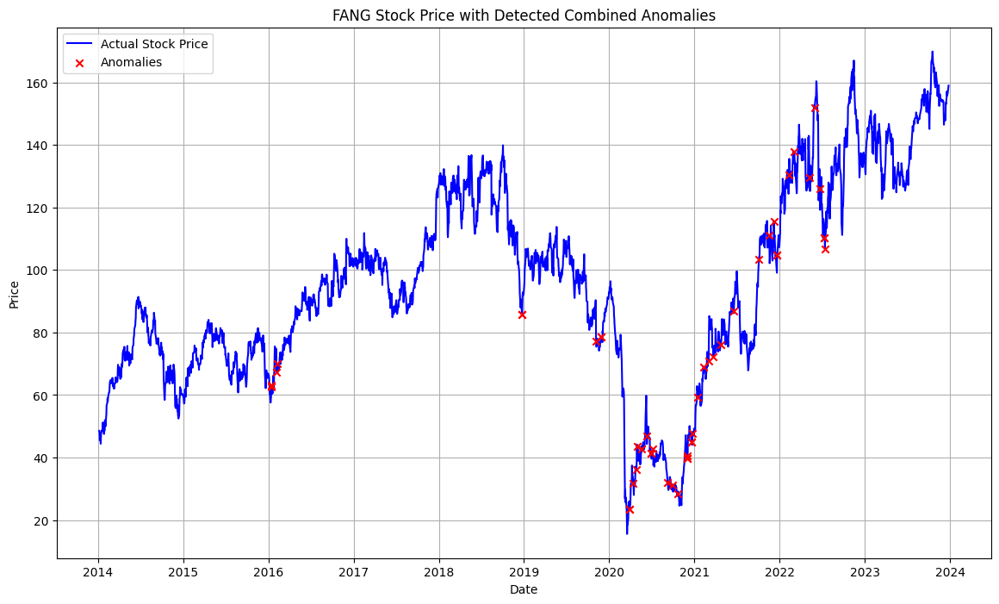

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 413.66it/s]


Combined Score Threshold: 0.1986129857508282


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1994.80it/s]


Sequence 6 is anomalous with combined score 0.2113704424935412
Sequence 7 is anomalous with combined score 0.21904409886196283
Sequence 8 is anomalous with combined score 0.21237359184593005
Sequence 19 is anomalous with combined score 0.2015841699984387
Sequence 20 is anomalous with combined score 0.2563962492454648
Sequence 21 is anomalous with combined score 0.224061197087453
Sequence 31 is anomalous with combined score 0.20322227428067602
Sequence 32 is anomalous with combined score 0.31012399219489095
Sequence 33 is anomalous with combined score 0.4430566171830468
Sequence 34 is anomalous with combined score 0.3585756599992269
Sequence 39 is anomalous with combined score 0.2543400481915839
Sequence 40 is anomalous with combined score 0.21651264614593865
Sequence 46 is anomalous with combined score 0.25176865879967325
Sequence 70 is anomalous with combined score 0.23746481872389702
Sequence 71 is anomalous with combined score 0.253351109157098
Sequence 77 is anomalous with combined

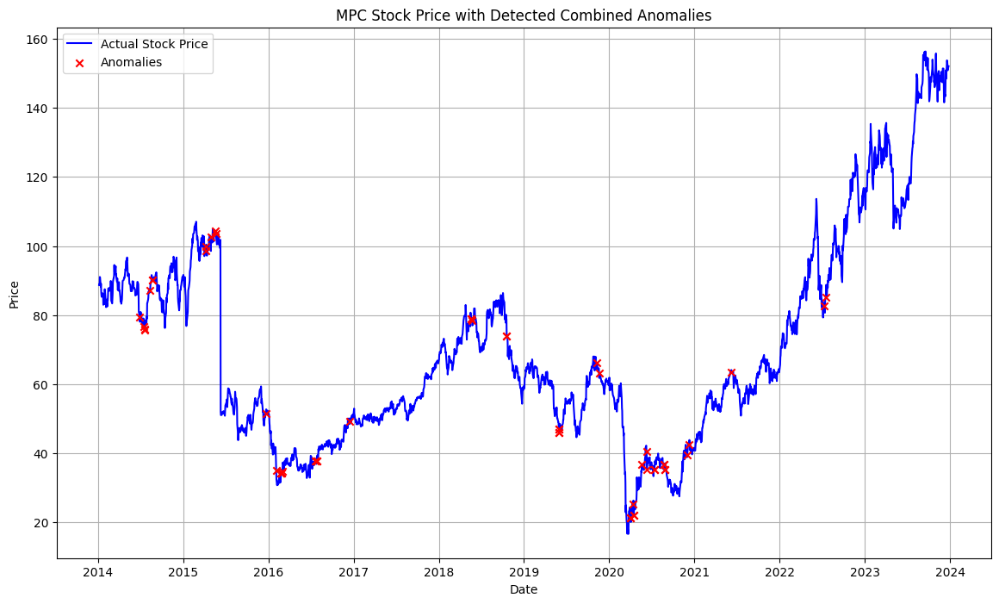

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 368.74it/s]


Combined Score Threshold: 0.16578891553953543


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1940.99it/s]


Sequence 5 is anomalous with combined score 0.1808447098758626
Sequence 6 is anomalous with combined score 0.17388176470437358
Sequence 13 is anomalous with combined score 0.17363130549031658
Sequence 14 is anomalous with combined score 0.17738935995066937
Sequence 30 is anomalous with combined score 0.22197812277900625
Sequence 31 is anomalous with combined score 0.33825867249670255
Sequence 32 is anomalous with combined score 0.3540162472580575
Sequence 33 is anomalous with combined score 0.6083422356873851
Sequence 34 is anomalous with combined score 0.6419566118467308
Sequence 35 is anomalous with combined score 0.33633108635141407
Sequence 36 is anomalous with combined score 0.27295782823377757
Sequence 37 is anomalous with combined score 0.2550720797092288
Sequence 46 is anomalous with combined score 0.17224575026240274
Sequence 81 is anomalous with combined score 0.1954315205638198
Sequence 82 is anomalous with combined score 0.20436807647712946
Sequence 88 is anomalous with com

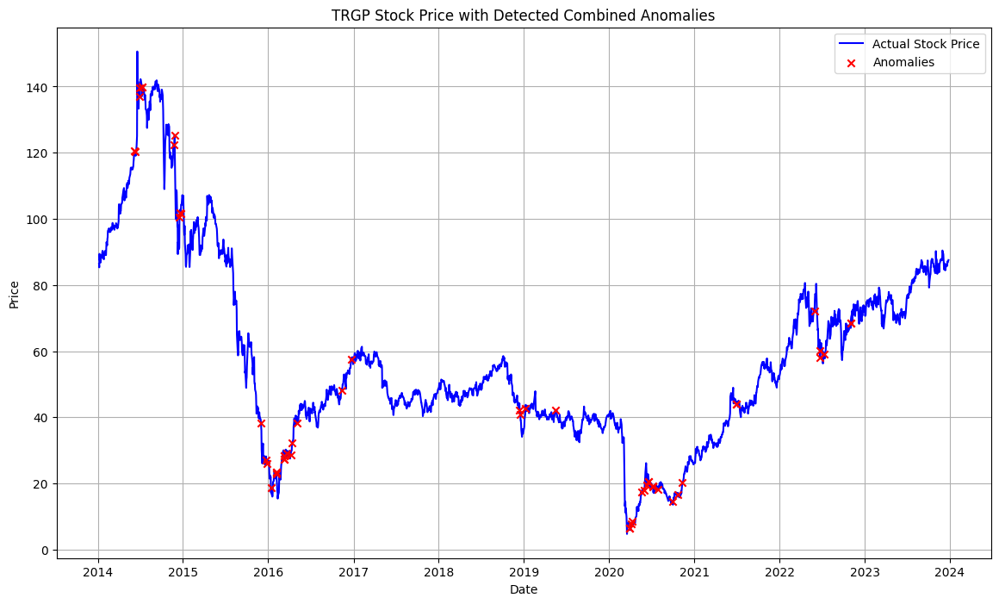

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 407.51it/s]


Combined Score Threshold: 0.16650519403964403


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1785.60it/s]


Sequence 25 is anomalous with combined score 0.28074294303060676
Sequence 26 is anomalous with combined score 0.2836511297674554
Sequence 30 is anomalous with combined score 0.21061160310643312
Sequence 31 is anomalous with combined score 0.2601925367209395
Sequence 32 is anomalous with combined score 0.24634495290409814
Sequence 33 is anomalous with combined score 0.29237615240266485
Sequence 34 is anomalous with combined score 0.25875538025561234
Sequence 86 is anomalous with combined score 0.1959086498227307
Sequence 87 is anomalous with combined score 0.24716173575984354
Sequence 101 is anomalous with combined score 0.46739497089582505
Sequence 102 is anomalous with combined score 0.9217349083727094
Sequence 103 is anomalous with combined score 0.6849023506337462
Sequence 104 is anomalous with combined score 0.31132350913863094
Sequence 105 is anomalous with combined score 0.2652059256344899
Sequence 106 is anomalous with combined score 0.17908440792431168
Sequence 111 is anomalous

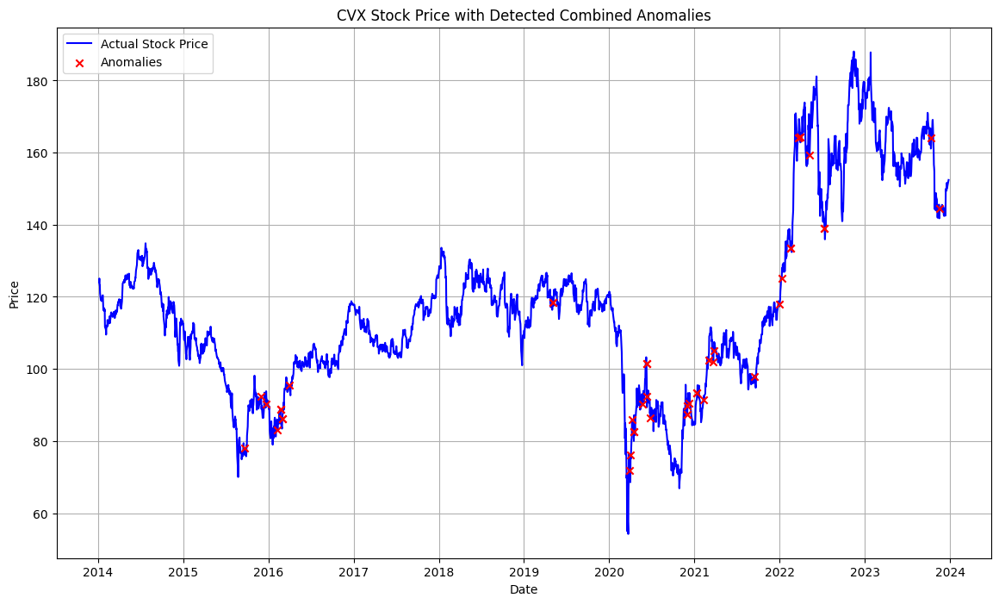

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 418.57it/s]


Combined Score Threshold: 0.27595122972826724


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2018.67it/s]


Sequence 0 is anomalous with combined score 0.5902174918513496
Sequence 1 is anomalous with combined score 0.4889476731206248
Sequence 2 is anomalous with combined score 0.3549980966774153
Sequence 5 is anomalous with combined score 0.45020953232703986
Sequence 6 is anomalous with combined score 0.6191524505143922
Sequence 7 is anomalous with combined score 0.4215368955330405
Sequence 10 is anomalous with combined score 0.4308612213463779
Sequence 11 is anomalous with combined score 0.4295586320007687
Sequence 12 is anomalous with combined score 0.38500433775986337
Sequence 13 is anomalous with combined score 0.3723591710332229
Sequence 14 is anomalous with combined score 0.36768044425220214
Sequence 15 is anomalous with combined score 0.5215772067883646
Sequence 16 is anomalous with combined score 0.5720910574662474
Sequence 17 is anomalous with combined score 0.425374721200281
Sequence 18 is anomalous with combined score 0.39601498871758184
Sequence 19 is anomalous with combined scor

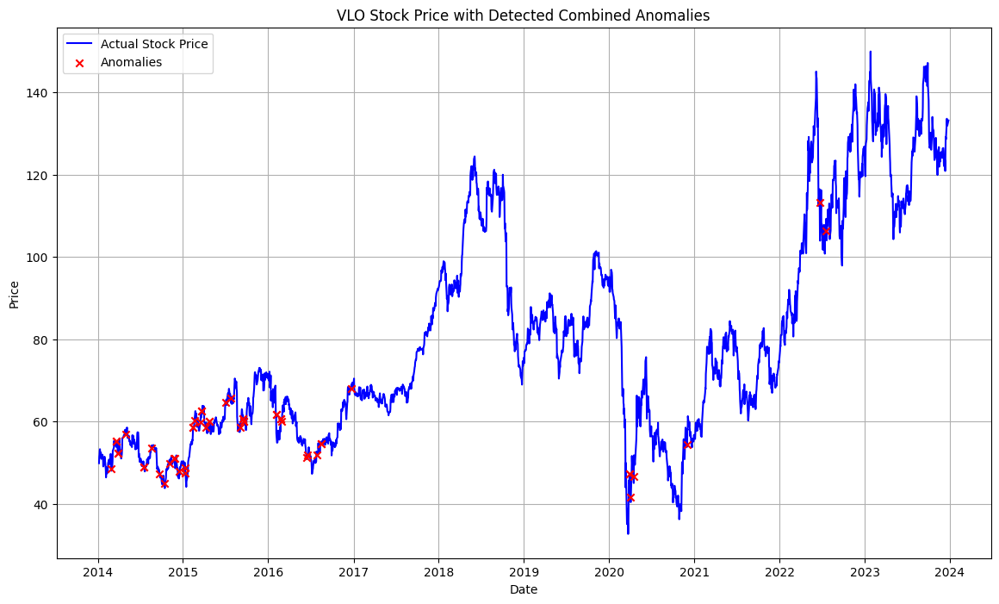

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.96it/s]


Combined Score Threshold: 0.23095953556544985


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2077.14it/s]


Sequence 32 is anomalous with combined score 0.5633561486827601
Sequence 33 is anomalous with combined score 0.8832243406984541
Sequence 34 is anomalous with combined score 0.6552961924708103
Sequence 35 is anomalous with combined score 0.31794416752249005
Sequence 36 is anomalous with combined score 0.3339575760597939
Sequence 37 is anomalous with combined score 0.313708632218606
Sequence 40 is anomalous with combined score 0.30848474620632615
Sequence 43 is anomalous with combined score 0.30152184657280634
Sequence 44 is anomalous with combined score 0.2560704793033662
Sequence 46 is anomalous with combined score 0.2974845872320379
Sequence 47 is anomalous with combined score 0.31305538974962055
Sequence 48 is anomalous with combined score 0.23106409860943833
Sequence 52 is anomalous with combined score 0.2340742281620358
Sequence 53 is anomalous with combined score 0.28185168114321385
Sequence 55 is anomalous with combined score 0.23594644742661136
Sequence 56 is anomalous with comb

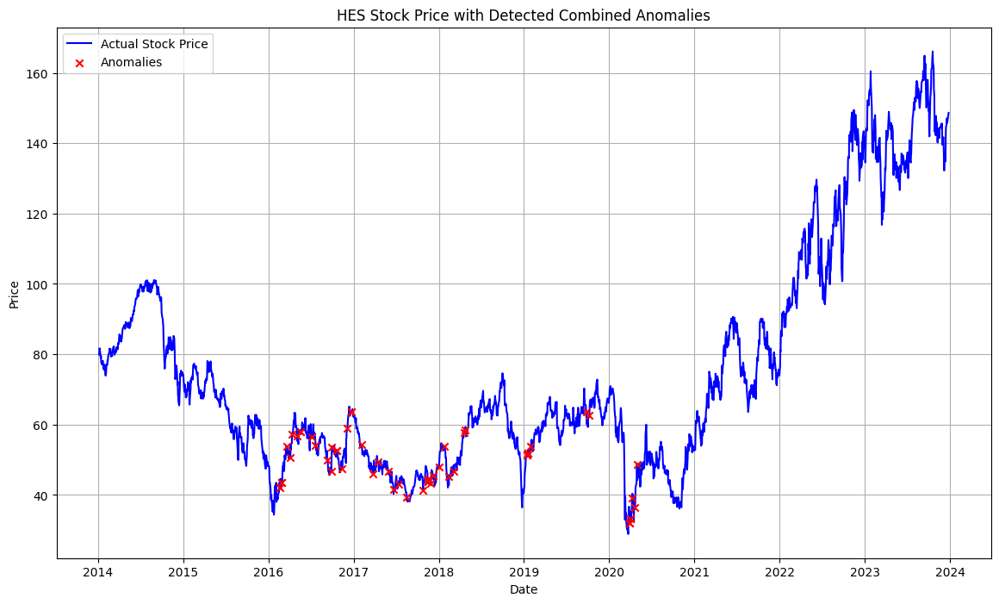

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 409.54it/s]


Combined Score Threshold: 0.22494512478747034


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2071.61it/s]


Sequence 6 is anomalous with combined score 0.23386463648507638
Sequence 11 is anomalous with combined score 0.4370311456205844
Sequence 12 is anomalous with combined score 0.5027620360453113
Sequence 13 is anomalous with combined score 0.4138075119107756
Sequence 14 is anomalous with combined score 0.3681706230745608
Sequence 15 is anomalous with combined score 0.5281704191158914
Sequence 16 is anomalous with combined score 0.47516041134138387
Sequence 25 is anomalous with combined score 0.2933710972786228
Sequence 26 is anomalous with combined score 0.34201668554338405
Sequence 27 is anomalous with combined score 0.23970685118996427
Sequence 31 is anomalous with combined score 0.23251790550511586
Sequence 32 is anomalous with combined score 0.37701543237068613
Sequence 33 is anomalous with combined score 0.3960332155385374
Sequence 34 is anomalous with combined score 0.22583047662417416
Sequence 65 is anomalous with combined score 0.24407376964670158
Sequence 96 is anomalous with com

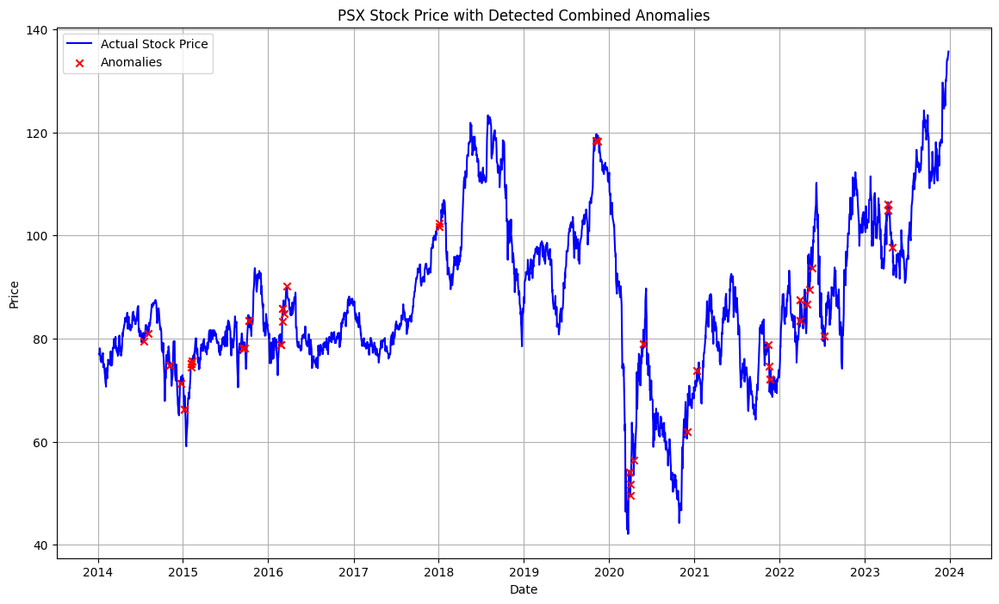

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.27it/s]


Combined Score Threshold: 0.17895408562480342


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2077.77it/s]


Sequence 0 is anomalous with combined score 0.19458941848661498
Sequence 11 is anomalous with combined score 0.3253351211734395
Sequence 12 is anomalous with combined score 0.32125396326032174
Sequence 13 is anomalous with combined score 0.29217027394646605
Sequence 14 is anomalous with combined score 0.2974918022537082
Sequence 15 is anomalous with combined score 0.20657768972262092
Sequence 16 is anomalous with combined score 0.21007956646502884
Sequence 24 is anomalous with combined score 0.18510007100475762
Sequence 25 is anomalous with combined score 0.24380125803752517
Sequence 31 is anomalous with combined score 0.1925096748775365
Sequence 32 is anomalous with combined score 0.2522329457526357
Sequence 33 is anomalous with combined score 0.26306649254753656
Sequence 34 is anomalous with combined score 0.24168478899998203
Sequence 35 is anomalous with combined score 0.1952111138185414
Sequence 85 is anomalous with combined score 0.1904396009163054
Sequence 86 is anomalous with co

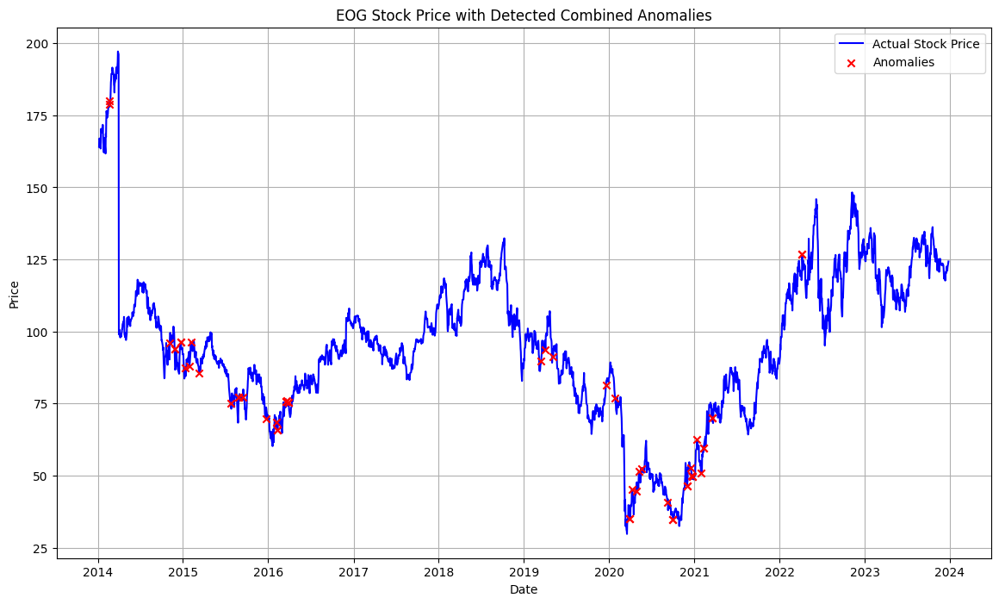

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.54it/s]


Combined Score Threshold: 0.1452188613958584


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2041.29it/s]


Sequence 13 is anomalous with combined score 0.14636902005751182
Sequence 25 is anomalous with combined score 0.16582817062359756
Sequence 31 is anomalous with combined score 0.16920136051378726
Sequence 32 is anomalous with combined score 0.20603743786155473
Sequence 33 is anomalous with combined score 0.21718562914355516
Sequence 34 is anomalous with combined score 0.19908491906922873
Sequence 35 is anomalous with combined score 0.16539328465269126
Sequence 36 is anomalous with combined score 0.15616635467656903
Sequence 37 is anomalous with combined score 0.1561139229470707
Sequence 42 is anomalous with combined score 0.15037904821139889
Sequence 101 is anomalous with combined score 0.5595573307576984
Sequence 102 is anomalous with combined score 0.9999953242564841
Sequence 103 is anomalous with combined score 0.6447144112615744
Sequence 104 is anomalous with combined score 0.242277295361976
Sequence 105 is anomalous with combined score 0.16318314890236407
Sequence 110 is anomalous 

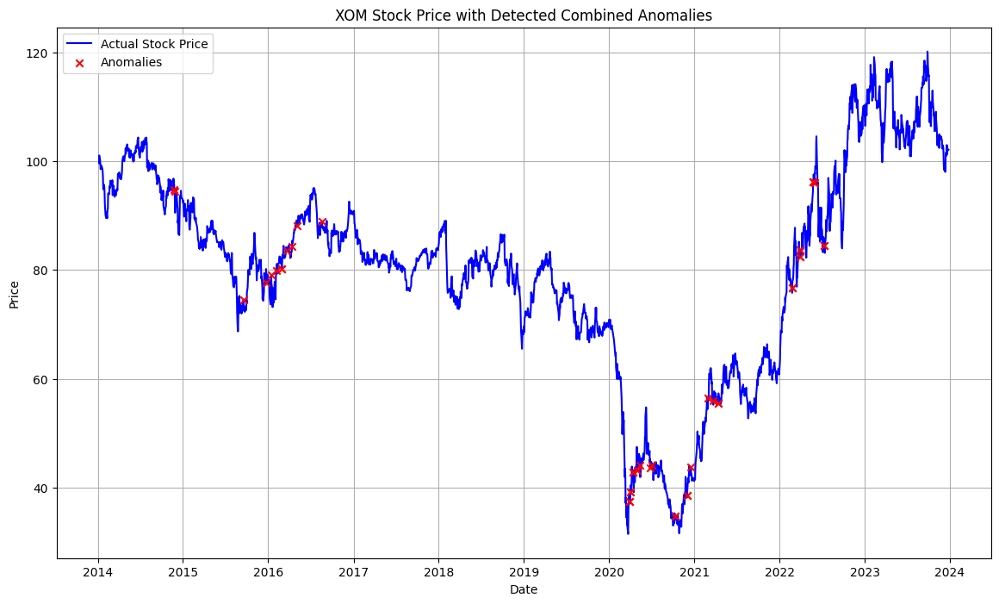

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.72it/s]


Combined Score Threshold: 0.4611879300070541


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2104.70it/s]


Sequence 11 is anomalous with combined score 0.4939251163817444
Sequence 12 is anomalous with combined score 0.4830032142217924
Sequence 13 is anomalous with combined score 0.54374839256316
Sequence 14 is anomalous with combined score 0.498599900111986
Sequence 15 is anomalous with combined score 0.4988627967751562
Sequence 24 is anomalous with combined score 0.4991434465573889
Sequence 25 is anomalous with combined score 0.4908291472300748
Sequence 26 is anomalous with combined score 0.5272032067708118
Sequence 29 is anomalous with combined score 0.497433411452082
Sequence 30 is anomalous with combined score 0.48458275911508797
Sequence 32 is anomalous with combined score 0.5410819687506891
Sequence 33 is anomalous with combined score 0.5898534567428753
Sequence 34 is anomalous with combined score 0.548234413947428
Sequence 36 is anomalous with combined score 0.4896186265476143
Sequence 37 is anomalous with combined score 0.4980580935072517
Sequence 38 is anomalous with combined score

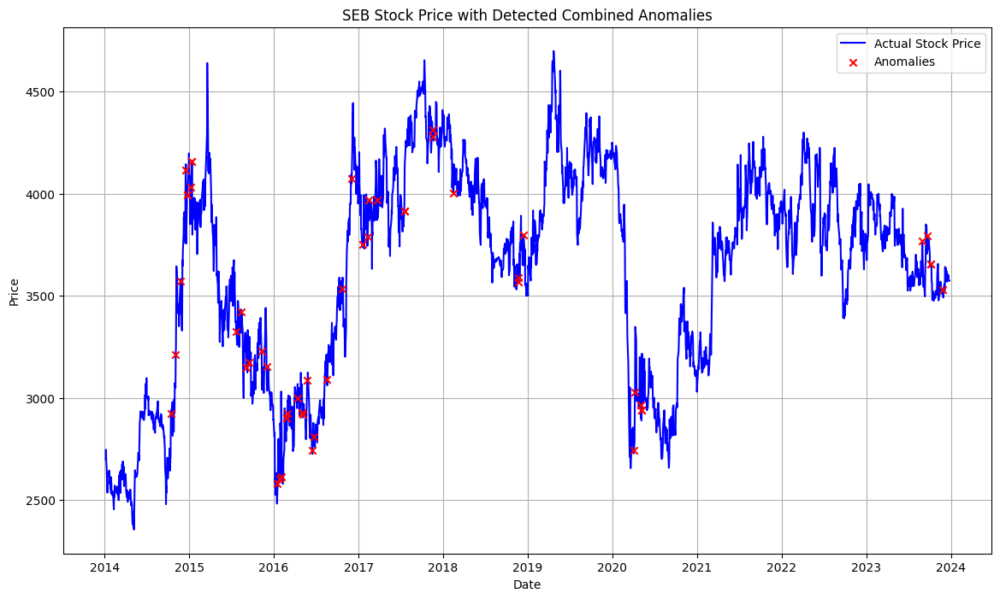

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.63it/s]


Combined Score Threshold: 0.2965163138540759


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2100.30it/s]


Sequence 13 is anomalous with combined score 0.3218811677817696
Sequence 14 is anomalous with combined score 0.3100961489448738
Sequence 23 is anomalous with combined score 0.3713359591025854
Sequence 24 is anomalous with combined score 0.36129610627562575
Sequence 28 is anomalous with combined score 0.33421855422991137
Sequence 29 is anomalous with combined score 0.39418026011841717
Sequence 37 is anomalous with combined score 0.6073259829667501
Sequence 38 is anomalous with combined score 0.7799189380281886
Sequence 39 is anomalous with combined score 0.5221124430393855
Sequence 40 is anomalous with combined score 0.3922559611394363
Sequence 41 is anomalous with combined score 0.3269225944738491
Sequence 45 is anomalous with combined score 0.30587652899206186
Sequence 51 is anomalous with combined score 0.38068885450622025
Sequence 52 is anomalous with combined score 0.36470357039553963
Sequence 70 is anomalous with combined score 0.3237092458961909
Sequence 71 is anomalous with comb

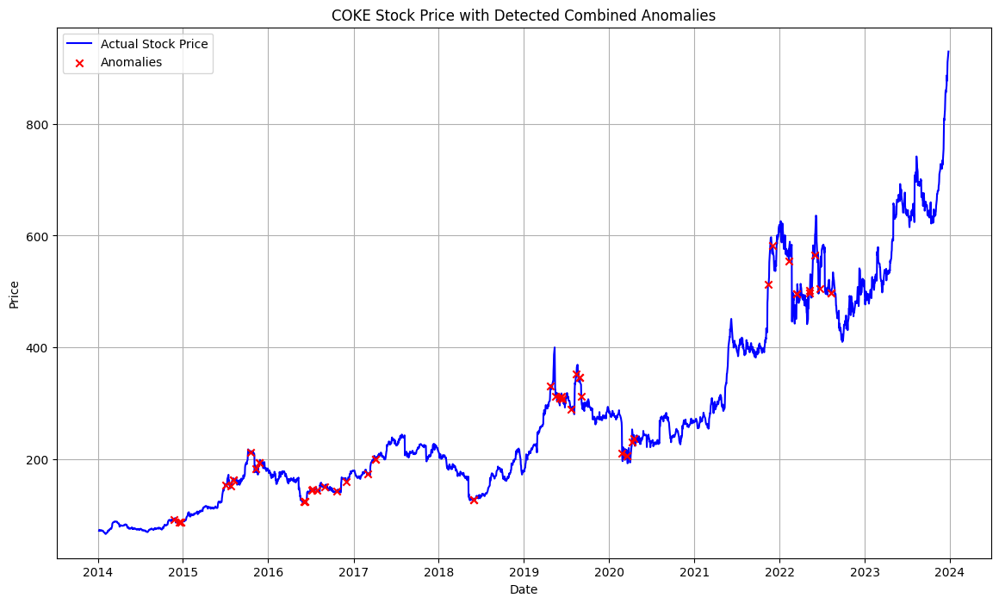

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 428.26it/s]


Combined Score Threshold: 0.3121283738187922


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2081.62it/s]


Sequence 16 is anomalous with combined score 0.38940343878274086
Sequence 17 is anomalous with combined score 0.35484956131258666
Sequence 55 is anomalous with combined score 0.4352500507080866
Sequence 56 is anomalous with combined score 0.7208039380396156
Sequence 57 is anomalous with combined score 0.6527097571725543
Sequence 58 is anomalous with combined score 0.41331022948036317
Sequence 59 is anomalous with combined score 0.3783271920420632
Sequence 61 is anomalous with combined score 0.42300538770369484
Sequence 62 is anomalous with combined score 0.4363335911768371
Sequence 64 is anomalous with combined score 0.32903724094785847
Sequence 69 is anomalous with combined score 0.3551652683949134
Sequence 78 is anomalous with combined score 0.3457052051429828
Sequence 79 is anomalous with combined score 0.31378625301923224
Sequence 81 is anomalous with combined score 0.45339388659898827
Sequence 93 is anomalous with combined score 0.3221943553139017
Sequence 101 is anomalous with co

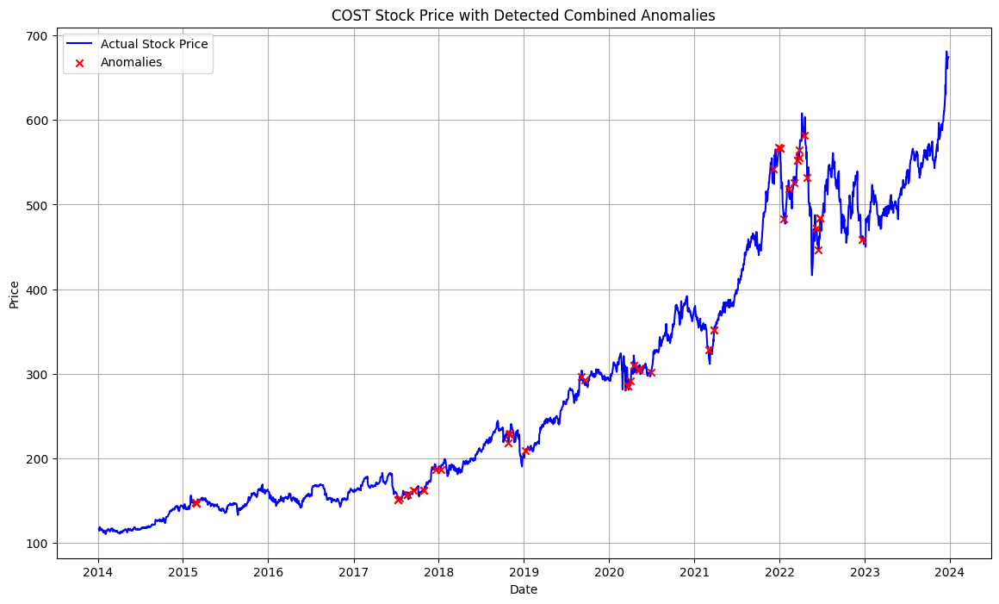

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.90it/s]


Combined Score Threshold: 0.2621194673006115


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2086.71it/s]


Sequence 22 is anomalous with combined score 0.38638181908893043
Sequence 23 is anomalous with combined score 0.3060234161889433
Sequence 30 is anomalous with combined score 0.2678510635695181
Sequence 31 is anomalous with combined score 0.3034942190308755
Sequence 33 is anomalous with combined score 0.2972574330247315
Sequence 34 is anomalous with combined score 0.457950914146368
Sequence 35 is anomalous with combined score 0.3675073332843528
Sequence 39 is anomalous with combined score 0.5677159680042367
Sequence 40 is anomalous with combined score 0.5057434067569889
Sequence 43 is anomalous with combined score 0.40658838677256115
Sequence 44 is anomalous with combined score 0.3324256918152617
Sequence 47 is anomalous with combined score 0.36843448063284456
Sequence 48 is anomalous with combined score 0.29960371336820746
Sequence 49 is anomalous with combined score 0.2766666495134279
Sequence 50 is anomalous with combined score 0.3403924691865763
Sequence 51 is anomalous with combine

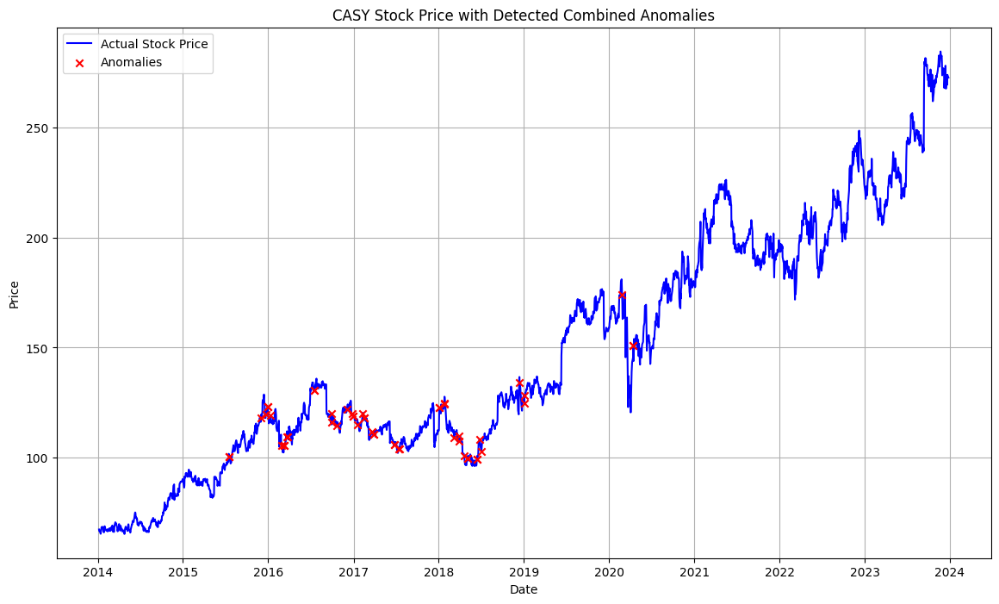

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 415.31it/s]


Combined Score Threshold: 0.32525363823511005


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2065.83it/s]


Sequence 75 is anomalous with combined score 0.33891235147712806
Sequence 79 is anomalous with combined score 0.33231497227217605
Sequence 93 is anomalous with combined score 0.366908876789614
Sequence 94 is anomalous with combined score 0.39450319090511704
Sequence 95 is anomalous with combined score 0.35956036651737167
Sequence 100 is anomalous with combined score 0.3806441010399857
Sequence 101 is anomalous with combined score 0.6007597692176925
Sequence 102 is anomalous with combined score 0.5202721060575775
Sequence 103 is anomalous with combined score 0.4170276426344315
Sequence 106 is anomalous with combined score 0.3464654130791238
Sequence 107 is anomalous with combined score 0.5262621573588935
Sequence 108 is anomalous with combined score 0.45250890097293406
Sequence 112 is anomalous with combined score 0.3601492812250613
Sequence 113 is anomalous with combined score 0.48896629341719755
Sequence 117 is anomalous with combined score 0.41184937042405445
Sequence 118 is anomalou

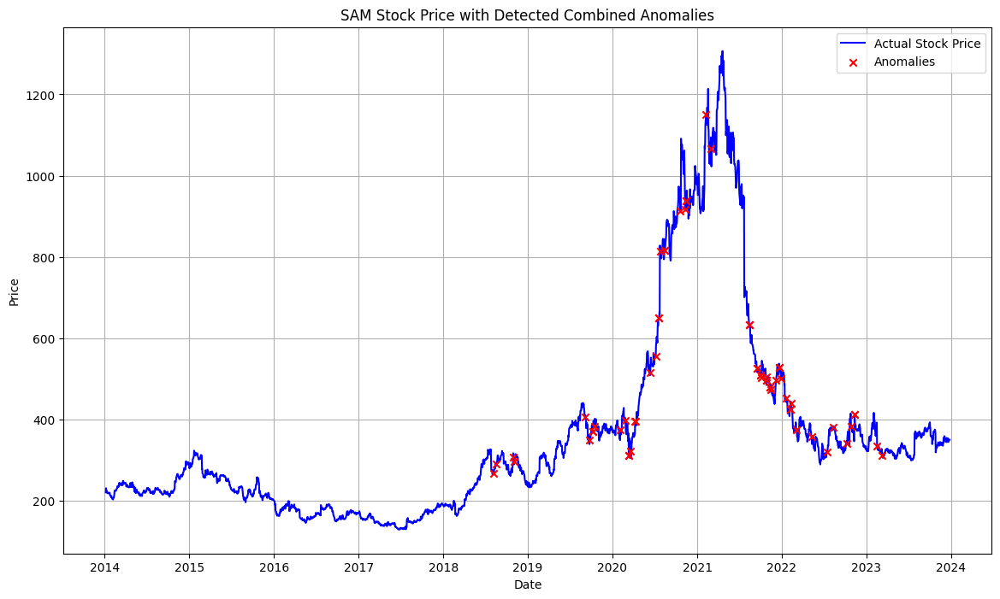

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 421.69it/s]


Combined Score Threshold: 0.21578307844147693


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2092.98it/s]


Sequence 33 is anomalous with combined score 0.2333800700361875
Sequence 45 is anomalous with combined score 0.2787043147577839
Sequence 46 is anomalous with combined score 0.28807469638552907
Sequence 48 is anomalous with combined score 0.278484093618214
Sequence 49 is anomalous with combined score 0.298437336782293
Sequence 65 is anomalous with combined score 0.24382770596365205
Sequence 66 is anomalous with combined score 0.2949614759216327
Sequence 75 is anomalous with combined score 0.33062062137830267
Sequence 76 is anomalous with combined score 0.3379788295847935
Sequence 78 is anomalous with combined score 0.3220176567315004
Sequence 79 is anomalous with combined score 0.251807995672221
Sequence 81 is anomalous with combined score 0.2730771653422567
Sequence 82 is anomalous with combined score 0.5794498793528797
Sequence 83 is anomalous with combined score 0.5627799870147163
Sequence 84 is anomalous with combined score 0.2375970566697041
Sequence 86 is anomalous with combined s

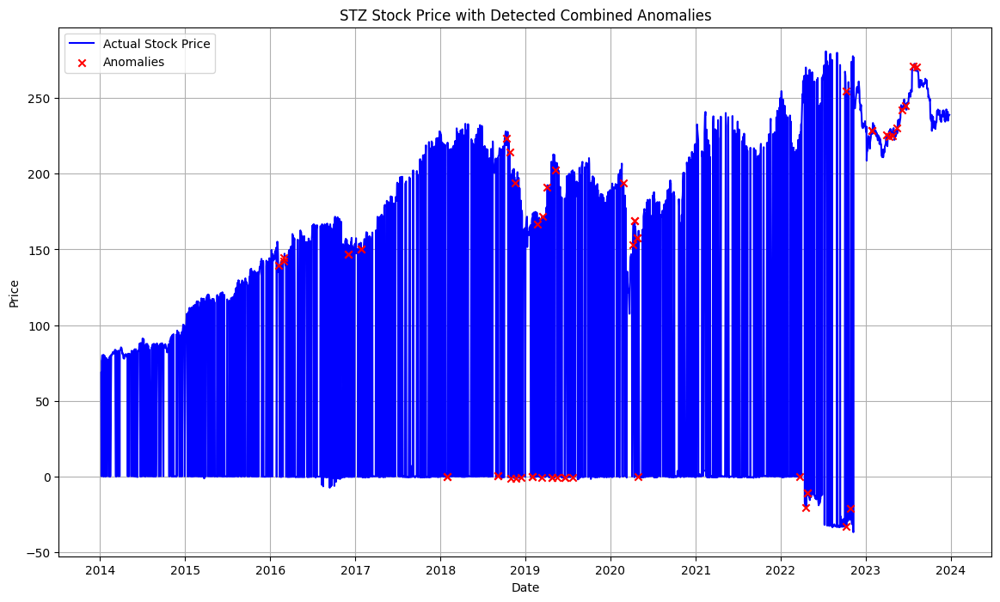

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 414.46it/s]


Combined Score Threshold: 0.2437907830090769


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2062.78it/s]


Sequence 79 is anomalous with combined score 0.26482058572874495
Sequence 80 is anomalous with combined score 0.24906284200645346
Sequence 82 is anomalous with combined score 0.28827072510702767
Sequence 83 is anomalous with combined score 0.2726454158265011
Sequence 90 is anomalous with combined score 0.24635285295047896
Sequence 102 is anomalous with combined score 0.8053660666712184
Sequence 103 is anomalous with combined score 0.9999903467295976
Sequence 104 is anomalous with combined score 0.47017543140420825
Sequence 107 is anomalous with combined score 0.31528387657112766
Sequence 108 is anomalous with combined score 0.269142700536417
Sequence 112 is anomalous with combined score 0.37504012945079335
Sequence 113 is anomalous with combined score 0.39498776111029277
Sequence 115 is anomalous with combined score 0.26277309284455963
Sequence 116 is anomalous with combined score 0.4127884467464249
Sequence 117 is anomalous with combined score 0.255070447029889
Sequence 119 is anomalo

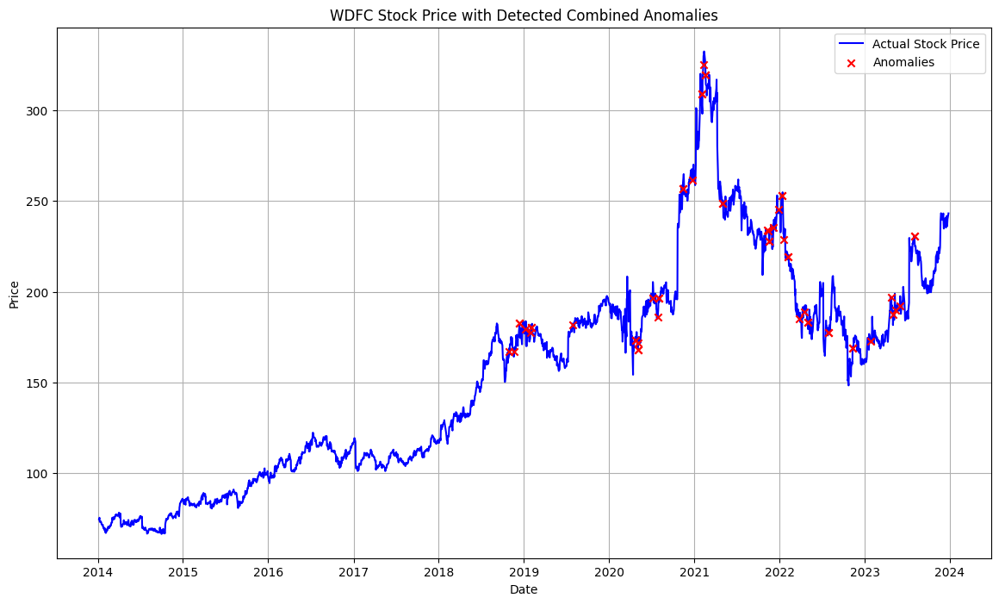

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.83it/s]


Combined Score Threshold: 0.22628999884672035


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2060.23it/s]


Sequence 15 is anomalous with combined score 0.2785541327337595
Sequence 16 is anomalous with combined score 0.2574815044204292
Sequence 20 is anomalous with combined score 0.2318733001406724
Sequence 28 is anomalous with combined score 0.25678799372547934
Sequence 29 is anomalous with combined score 0.2614388741471338
Sequence 30 is anomalous with combined score 0.22791166558537174
Sequence 32 is anomalous with combined score 0.2898350260063832
Sequence 33 is anomalous with combined score 0.2866770425652387
Sequence 39 is anomalous with combined score 0.7029733588658023
Sequence 40 is anomalous with combined score 0.7344069625664538
Sequence 41 is anomalous with combined score 0.24159533205093092
Sequence 42 is anomalous with combined score 0.3933812825322053
Sequence 43 is anomalous with combined score 0.387505632185714
Sequence 66 is anomalous with combined score 0.2925369041205224
Sequence 67 is anomalous with combined score 0.294476833269387
Sequence 74 is anomalous with combined 

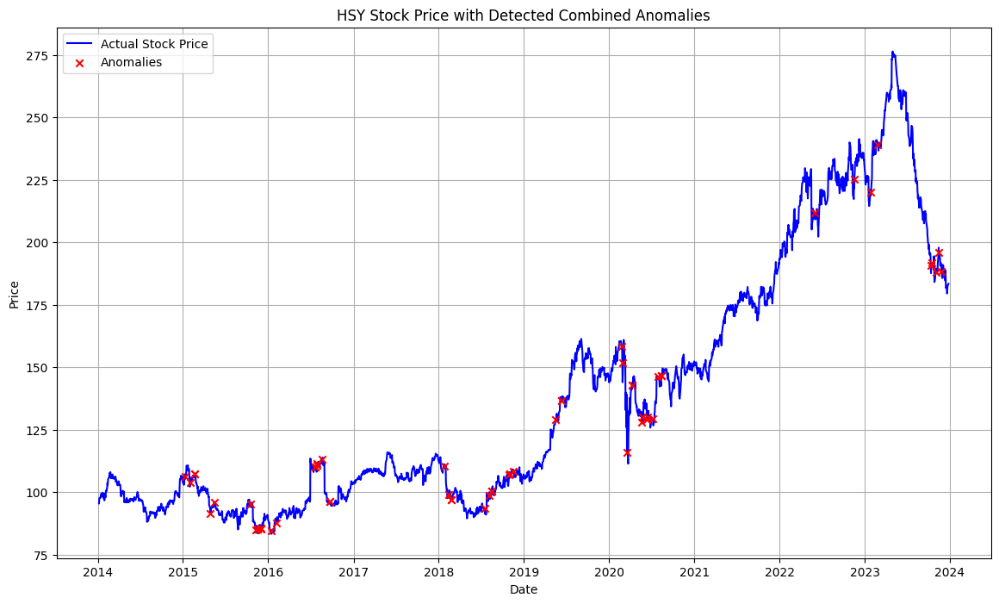

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.94it/s]


Combined Score Threshold: 0.2401447369123633


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2013.45it/s]


Sequence 32 is anomalous with combined score 0.6715855176714093
Sequence 33 is anomalous with combined score 0.652793880807468
Sequence 36 is anomalous with combined score 0.43243940264204694
Sequence 37 is anomalous with combined score 0.36665570092829514
Sequence 49 is anomalous with combined score 0.279583055579886
Sequence 50 is anomalous with combined score 0.24334287767282348
Sequence 81 is anomalous with combined score 0.30112879611399535
Sequence 82 is anomalous with combined score 0.3815449862605417
Sequence 83 is anomalous with combined score 0.37443392464784
Sequence 95 is anomalous with combined score 0.2521238246709584
Sequence 96 is anomalous with combined score 0.24388786171526106
Sequence 101 is anomalous with combined score 0.407155531016403
Sequence 102 is anomalous with combined score 0.8926735823301201
Sequence 103 is anomalous with combined score 0.7768258315811449
Sequence 104 is anomalous with combined score 0.3956620098915358
Sequence 105 is anomalous with combi

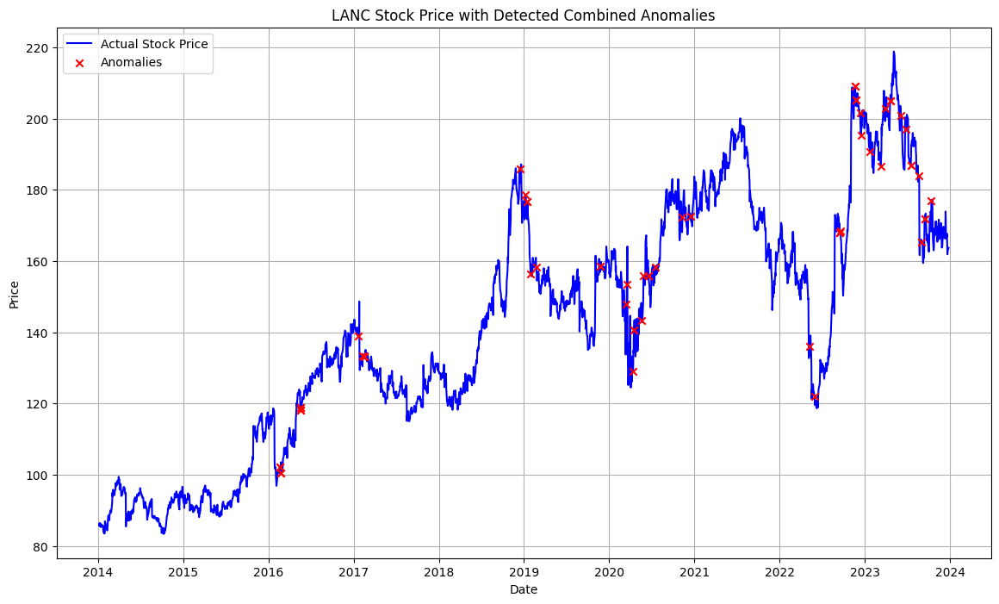

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.32it/s]


Combined Score Threshold: 0.17019355660581975


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2025.16it/s]


Sequence 25 is anomalous with combined score 0.2030460994026912
Sequence 27 is anomalous with combined score 0.1784905885982454
Sequence 28 is anomalous with combined score 0.20951015441894563
Sequence 32 is anomalous with combined score 0.17096129494822876
Sequence 33 is anomalous with combined score 0.20126833715076425
Sequence 34 is anomalous with combined score 0.19840197721180913
Sequence 43 is anomalous with combined score 0.49267063391618077
Sequence 44 is anomalous with combined score 0.6679944185343909
Sequence 45 is anomalous with combined score 0.412498773976126
Sequence 46 is anomalous with combined score 0.1801073332238845
Sequence 50 is anomalous with combined score 0.19285166261132602
Sequence 61 is anomalous with combined score 0.20226428656179385
Sequence 66 is anomalous with combined score 0.1762061750889794
Sequence 67 is anomalous with combined score 0.1768162374279767
Sequence 78 is anomalous with combined score 0.29056606552621
Sequence 79 is anomalous with combin

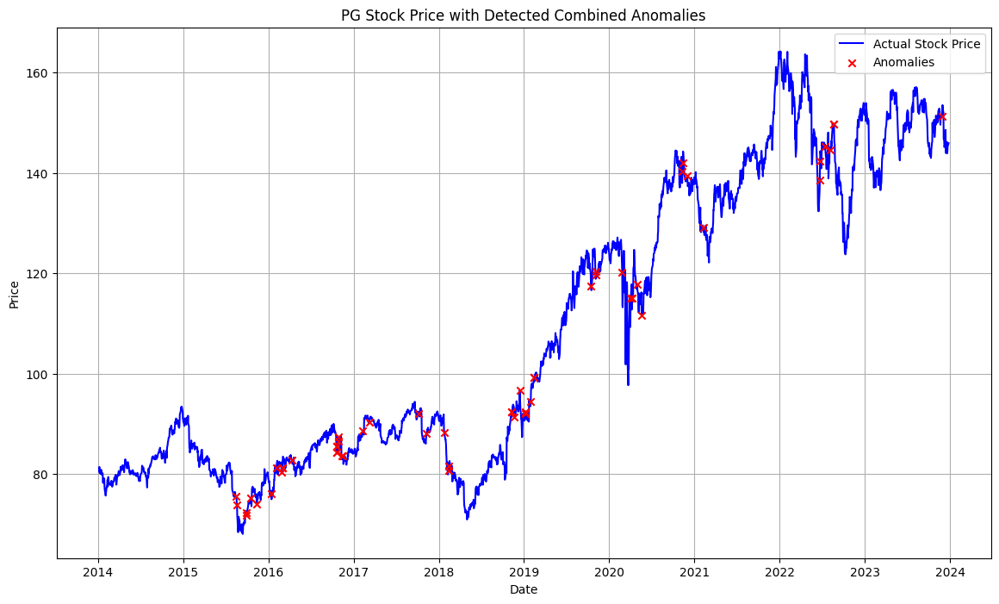

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.49it/s]


Combined Score Threshold: 0.39482353266611186


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2079.26it/s]


Sequence 15 is anomalous with combined score 0.418584732032215
Sequence 23 is anomalous with combined score 0.41088879720946847
Sequence 24 is anomalous with combined score 0.5707833558560982
Sequence 25 is anomalous with combined score 0.8073882835975645
Sequence 26 is anomalous with combined score 0.9311224947574895
Sequence 27 is anomalous with combined score 0.759231199635188
Sequence 28 is anomalous with combined score 0.6071021035842419
Sequence 29 is anomalous with combined score 0.49547298182767385
Sequence 30 is anomalous with combined score 0.5143482956456058
Sequence 31 is anomalous with combined score 0.538233920427779
Sequence 32 is anomalous with combined score 0.7782527429653723
Sequence 33 is anomalous with combined score 0.851106416165455
Sequence 34 is anomalous with combined score 0.5674155438779764
Sequence 36 is anomalous with combined score 0.45623229489302847
Sequence 37 is anomalous with combined score 0.49117637774089906
Sequence 40 is anomalous with combined s

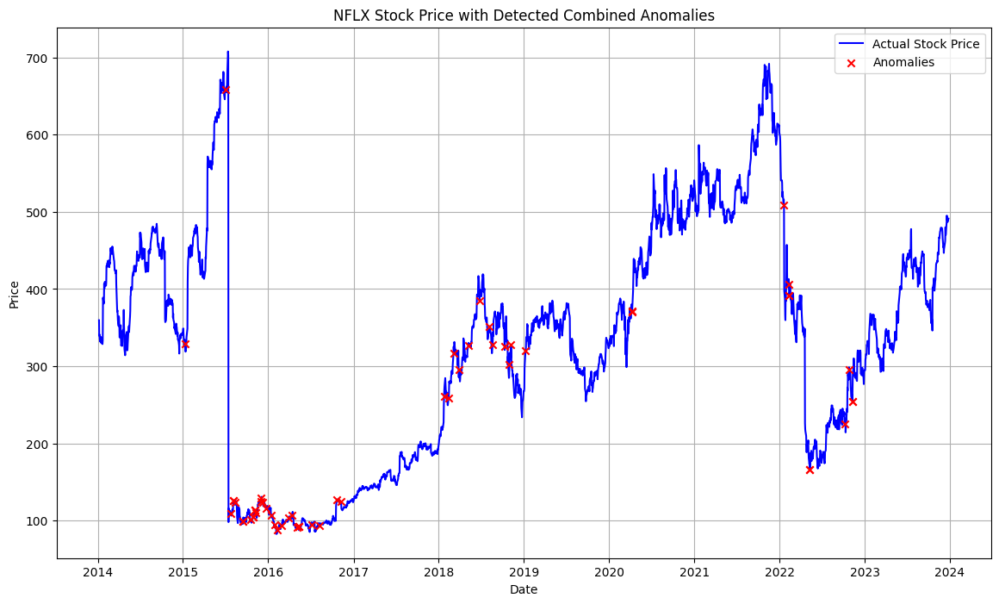

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 387.09it/s]


Combined Score Threshold: 0.35178011049983005


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2027.60it/s]


Sequence 3 is anomalous with combined score 0.37673503665924957
Sequence 12 is anomalous with combined score 0.3778996509274062
Sequence 13 is anomalous with combined score 0.366239292491754
Sequence 19 is anomalous with combined score 0.3877280959626352
Sequence 21 is anomalous with combined score 0.38122756449510886
Sequence 33 is anomalous with combined score 0.43741816099095093
Sequence 34 is anomalous with combined score 0.3743620449381639
Sequence 37 is anomalous with combined score 0.8426851985961689
Sequence 38 is anomalous with combined score 0.7452747138438508
Sequence 42 is anomalous with combined score 0.5782581360171375
Sequence 43 is anomalous with combined score 0.44894872661136154
Sequence 46 is anomalous with combined score 0.4074911582326983
Sequence 62 is anomalous with combined score 0.42390625036671103
Sequence 63 is anomalous with combined score 0.5272852043545971
Sequence 67 is anomalous with combined score 0.37064700741518847
Sequence 68 is anomalous with combin

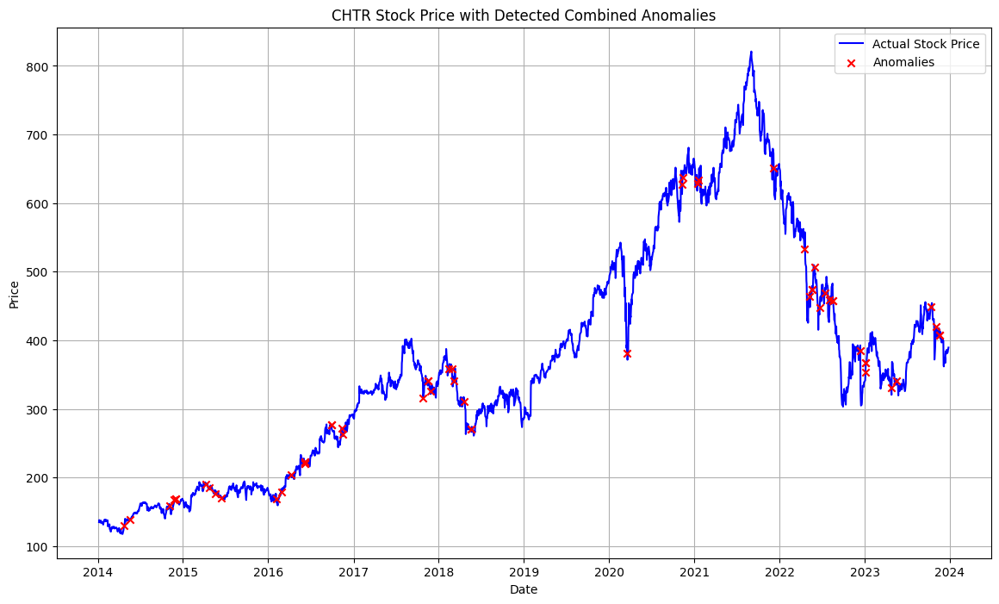

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 421.26it/s]


Combined Score Threshold: 0.3715316213615695


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2091.97it/s]


Sequence 0 is anomalous with combined score 0.5653590341532143
Sequence 3 is anomalous with combined score 0.4916167124856214
Sequence 4 is anomalous with combined score 0.3901994730267637
Sequence 7 is anomalous with combined score 0.49520620975049107
Sequence 8 is anomalous with combined score 0.4974724793153087
Sequence 13 is anomalous with combined score 0.3780728467201604
Sequence 21 is anomalous with combined score 0.41588172432613346
Sequence 22 is anomalous with combined score 0.4629637270772913
Sequence 28 is anomalous with combined score 0.3727103119964278
Sequence 29 is anomalous with combined score 0.5090222148998916
Sequence 30 is anomalous with combined score 0.5034371372887835
Sequence 33 is anomalous with combined score 0.5691900974161748
Sequence 34 is anomalous with combined score 0.48553237152092665
Sequence 50 is anomalous with combined score 0.4315944060687467
Sequence 63 is anomalous with combined score 0.4479867069446243
Sequence 70 is anomalous with combined sco

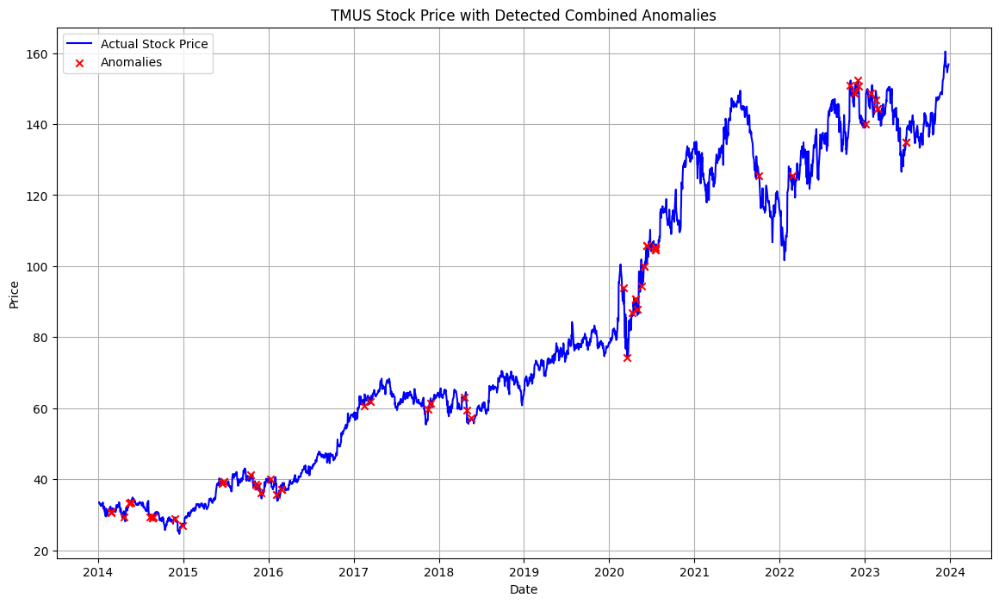

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 416.39it/s]


Combined Score Threshold: 0.2616634134212782


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1870.98it/s]


Sequence 0 is anomalous with combined score 0.3563380796000131
Sequence 1 is anomalous with combined score 0.5443925271827086
Sequence 2 is anomalous with combined score 0.5539064166816985
Sequence 3 is anomalous with combined score 0.33182357123449424
Sequence 31 is anomalous with combined score 0.26934664511044015
Sequence 32 is anomalous with combined score 0.46566854791260004
Sequence 33 is anomalous with combined score 0.47919401222316116
Sequence 34 is anomalous with combined score 0.33425698763706524
Sequence 45 is anomalous with combined score 0.31234799197995555
Sequence 46 is anomalous with combined score 0.3167076913401441
Sequence 48 is anomalous with combined score 0.3655169812673584
Sequence 49 is anomalous with combined score 0.3306169360966668
Sequence 54 is anomalous with combined score 0.4075373675044435
Sequence 55 is anomalous with combined score 0.4843298240704391
Sequence 56 is anomalous with combined score 0.30314098383234944
Sequence 58 is anomalous with combine

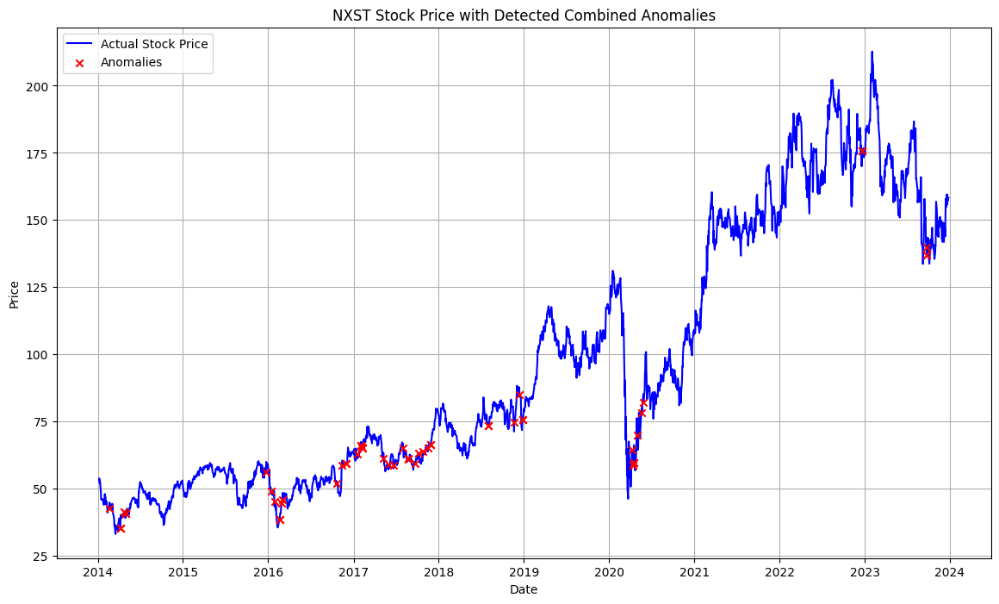

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 426.88it/s]


Combined Score Threshold: 0.45050872989186946


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2053.57it/s]


Sequence 0 is anomalous with combined score 0.832720951978579
Sequence 3 is anomalous with combined score 0.5185438446725114
Sequence 4 is anomalous with combined score 0.539548577735635
Sequence 20 is anomalous with combined score 0.4586894070901891
Sequence 21 is anomalous with combined score 0.531524637361051
Sequence 46 is anomalous with combined score 0.47926099238128644
Sequence 54 is anomalous with combined score 0.4717023050597431
Sequence 55 is anomalous with combined score 0.5508390725138663
Sequence 58 is anomalous with combined score 0.4532139203004475
Sequence 63 is anomalous with combined score 0.6478544811242934
Sequence 64 is anomalous with combined score 0.5095744517892972
Sequence 67 is anomalous with combined score 0.4581757195599325
Sequence 68 is anomalous with combined score 0.603145667639192
Sequence 69 is anomalous with combined score 0.6225662475828437
Sequence 70 is anomalous with combined score 0.47340107188650343
Sequence 71 is anomalous with combined score 

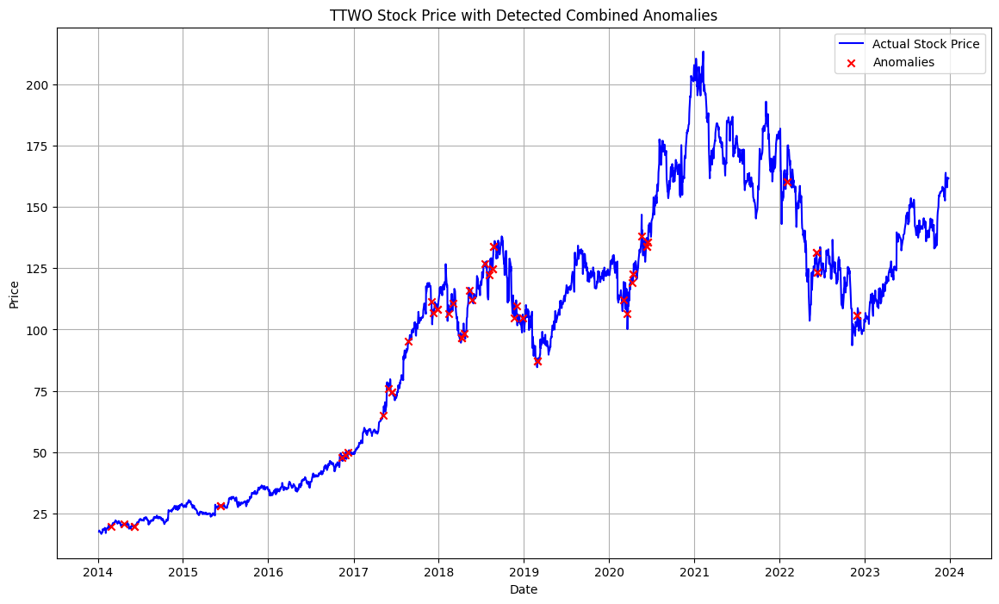

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 427.63it/s]


Combined Score Threshold: 0.3124118205435453


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2047.88it/s]


Sequence 0 is anomalous with combined score 0.3550101173341074
Sequence 3 is anomalous with combined score 0.4276007691875475
Sequence 4 is anomalous with combined score 0.35671881914169234
Sequence 7 is anomalous with combined score 0.32572872644655676
Sequence 8 is anomalous with combined score 0.3180827699448754
Sequence 16 is anomalous with combined score 0.34315064773637205
Sequence 29 is anomalous with combined score 0.34475075199271027
Sequence 30 is anomalous with combined score 0.42235944370876527
Sequence 31 is anomalous with combined score 0.3141569562871479
Sequence 32 is anomalous with combined score 0.41465469986415215
Sequence 33 is anomalous with combined score 0.5872207808062456
Sequence 34 is anomalous with combined score 0.35501811041944803
Sequence 37 is anomalous with combined score 0.3649745811781335
Sequence 63 is anomalous with combined score 0.34619667436687324
Sequence 64 is anomalous with combined score 0.3526300915393718
Sequence 66 is anomalous with combine

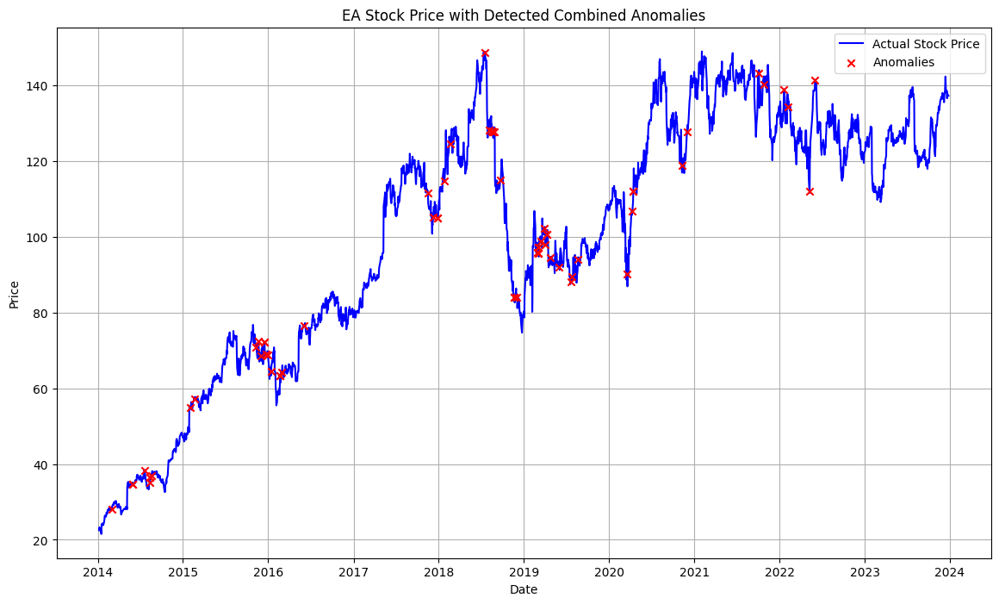

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 428.47it/s]


Combined Score Threshold: 0.14182619975510669


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2111.57it/s]


Sequence 33 is anomalous with combined score 0.14643558331118284
Sequence 63 is anomalous with combined score 0.16616782572804595
Sequence 70 is anomalous with combined score 0.17815825624686812
Sequence 98 is anomalous with combined score 0.17616080097554715
Sequence 101 is anomalous with combined score 0.4800619946609418
Sequence 102 is anomalous with combined score 0.9999952590029035
Sequence 103 is anomalous with combined score 0.8878268229246187
Sequence 104 is anomalous with combined score 0.5821948249160245
Sequence 105 is anomalous with combined score 0.47247920900199025
Sequence 106 is anomalous with combined score 0.29781351080168095
Sequence 107 is anomalous with combined score 0.19005645967560225
Sequence 108 is anomalous with combined score 0.15465985196250615
Sequence 109 is anomalous with combined score 0.18524586543890498
Sequence 110 is anomalous with combined score 0.20471952801240118
Sequence 112 is anomalous with combined score 0.18756203381601616
Sequence 113 is an

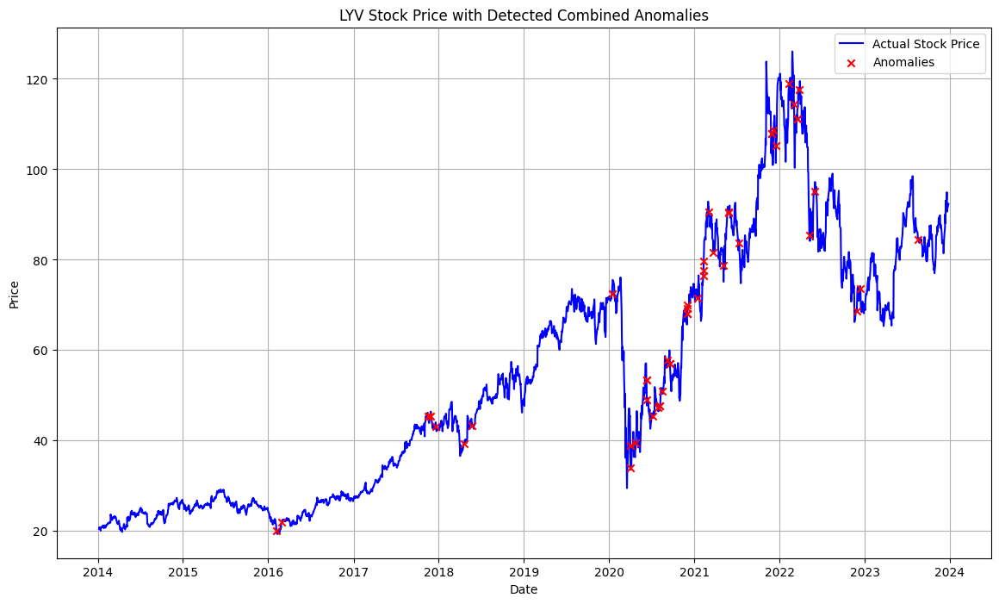

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 428.11it/s]


Combined Score Threshold: 0.34863771880734795


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1996.40it/s]


Sequence 3 is anomalous with combined score 0.4689970002754944
Sequence 4 is anomalous with combined score 0.47073282280559936
Sequence 62 is anomalous with combined score 0.3942849500989891
Sequence 63 is anomalous with combined score 0.4284886855794881
Sequence 64 is anomalous with combined score 0.40381448203575887
Sequence 66 is anomalous with combined score 0.40559633432719744
Sequence 67 is anomalous with combined score 0.6260342836574497
Sequence 68 is anomalous with combined score 0.3958891752273177
Sequence 74 is anomalous with combined score 0.5164927218423431
Sequence 75 is anomalous with combined score 0.4673394349207786
Sequence 78 is anomalous with combined score 0.7495302280544062
Sequence 79 is anomalous with combined score 0.6600457417585461
Sequence 101 is anomalous with combined score 0.44654144217604064
Sequence 102 is anomalous with combined score 0.730358899185446
Sequence 103 is anomalous with combined score 0.7830990524165589
Sequence 104 is anomalous with combi

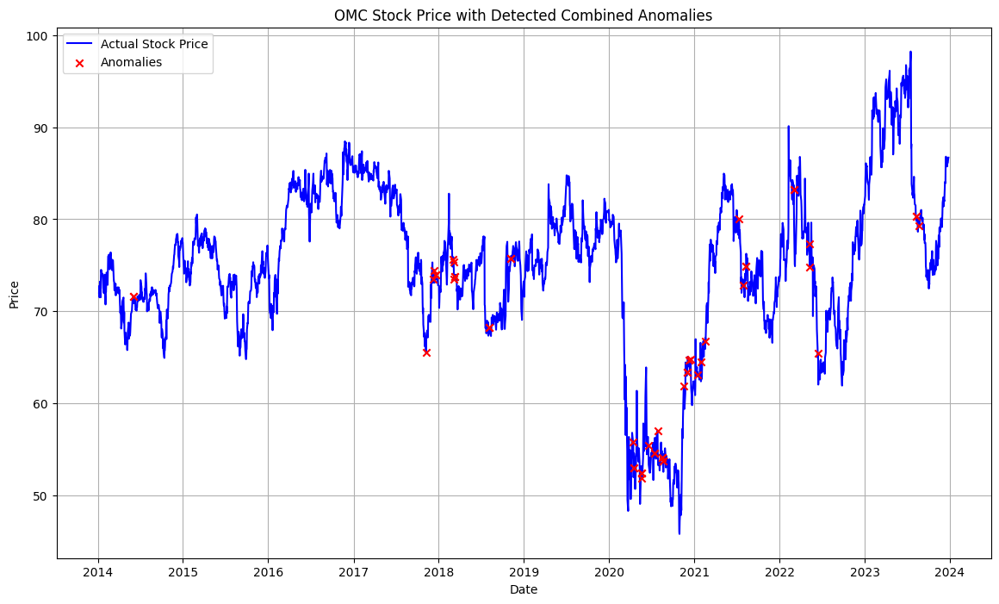

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 422.63it/s]


Combined Score Threshold: 0.2688227019965502


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2104.27it/s]


Sequence 24 is anomalous with combined score 0.2803798222132834
Sequence 25 is anomalous with combined score 0.40459403130923366
Sequence 33 is anomalous with combined score 0.2756588015941865
Sequence 86 is anomalous with combined score 0.4536623899312423
Sequence 87 is anomalous with combined score 0.34606488362857823
Sequence 101 is anomalous with combined score 0.5818915083779294
Sequence 102 is anomalous with combined score 0.9999906244724216
Sequence 103 is anomalous with combined score 0.8092515790580097
Sequence 104 is anomalous with combined score 0.7196317992971539
Sequence 105 is anomalous with combined score 0.6221179005194046
Sequence 106 is anomalous with combined score 0.3303105600913611
Sequence 109 is anomalous with combined score 0.2853614180764819
Sequence 113 is anomalous with combined score 0.34413793298076434
Sequence 114 is anomalous with combined score 0.45692831441959836
Sequence 115 is anomalous with combined score 0.34157013565701333
Sequence 117 is anomalous

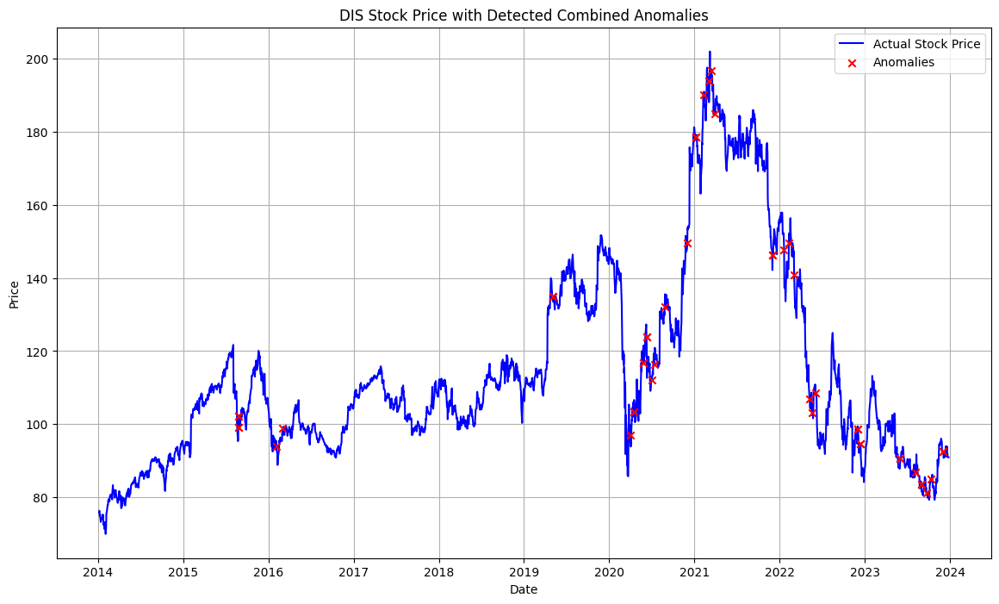

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 425.28it/s]


Combined Score Threshold: 0.24433585896441104


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2132.20it/s]


Sequence 0 is anomalous with combined score 0.5073780711423204
Sequence 1 is anomalous with combined score 0.6853326637133458
Sequence 2 is anomalous with combined score 0.32740771821797154
Sequence 3 is anomalous with combined score 0.27195666098784127
Sequence 20 is anomalous with combined score 0.36428649524416706
Sequence 21 is anomalous with combined score 0.3480740539471289
Sequence 22 is anomalous with combined score 0.24786553733873315
Sequence 25 is anomalous with combined score 0.34032293409234576
Sequence 26 is anomalous with combined score 0.2794215103145561
Sequence 28 is anomalous with combined score 0.2532219382199801
Sequence 33 is anomalous with combined score 0.3086679250205753
Sequence 34 is anomalous with combined score 0.628324282766714
Sequence 35 is anomalous with combined score 0.44796170957325954
Sequence 41 is anomalous with combined score 0.28921217133612764
Sequence 42 is anomalous with combined score 0.296868253137102
Sequence 46 is anomalous with combined 

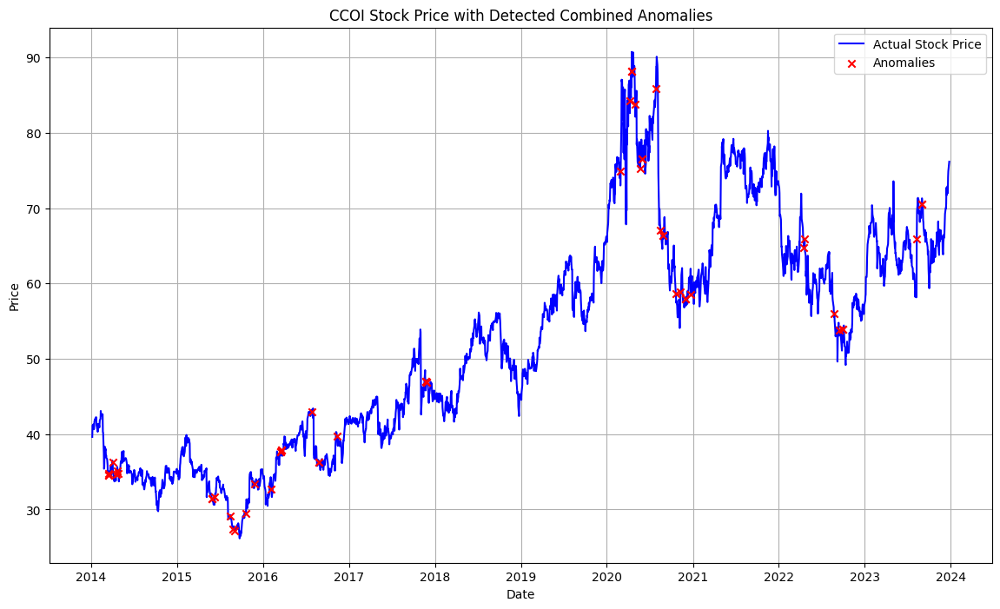

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 410.39it/s]


Combined Score Threshold: 0.20206574907258498


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2043.21it/s]


Sequence 30 is anomalous with combined score 0.22494991002357212
Sequence 33 is anomalous with combined score 0.2936034483915151
Sequence 34 is anomalous with combined score 0.7433860063462707
Sequence 35 is anomalous with combined score 0.6829007053592093
Sequence 37 is anomalous with combined score 0.21893992007726237
Sequence 46 is anomalous with combined score 0.20637488136813398
Sequence 65 is anomalous with combined score 0.23676666425751408
Sequence 66 is anomalous with combined score 0.238583296032988
Sequence 101 is anomalous with combined score 0.3861017091243667
Sequence 102 is anomalous with combined score 0.7067354897201008
Sequence 103 is anomalous with combined score 0.462858895530007
Sequence 104 is anomalous with combined score 0.24411920719292726
Sequence 105 is anomalous with combined score 0.3051088255405985
Sequence 106 is anomalous with combined score 0.24854979796688859
Sequence 113 is anomalous with combined score 0.22339865969059788
Sequence 118 is anomalous wi

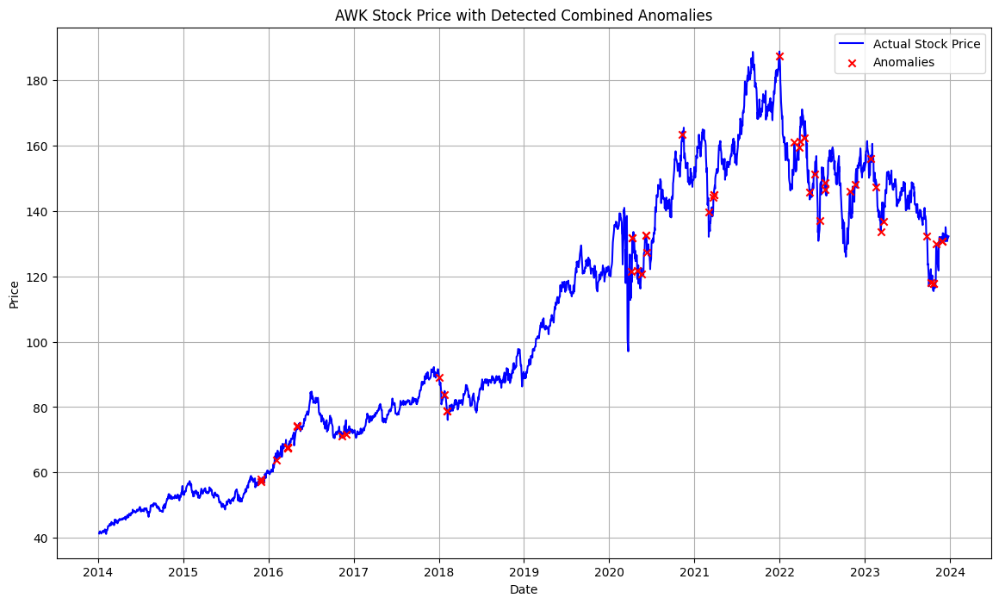

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.46it/s]


Combined Score Threshold: 0.25422560097216984


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1993.43it/s]


Sequence 0 is anomalous with combined score 0.3284643279104569
Sequence 12 is anomalous with combined score 0.25462853194032026
Sequence 13 is anomalous with combined score 0.2577476714910182
Sequence 49 is anomalous with combined score 0.2560223786743009
Sequence 80 is anomalous with combined score 0.3152629558569832
Sequence 81 is anomalous with combined score 0.32820454659599985
Sequence 83 is anomalous with combined score 0.5796789347474348
Sequence 84 is anomalous with combined score 0.5391737453928689
Sequence 101 is anomalous with combined score 0.3385110407256012
Sequence 102 is anomalous with combined score 0.5871193828799685
Sequence 103 is anomalous with combined score 0.6112036385418361
Sequence 104 is anomalous with combined score 0.44075291135357736
Sequence 105 is anomalous with combined score 0.3209260949405206
Sequence 106 is anomalous with combined score 0.32482267234009443
Sequence 107 is anomalous with combined score 0.29093499548964047
Sequence 110 is anomalous wit

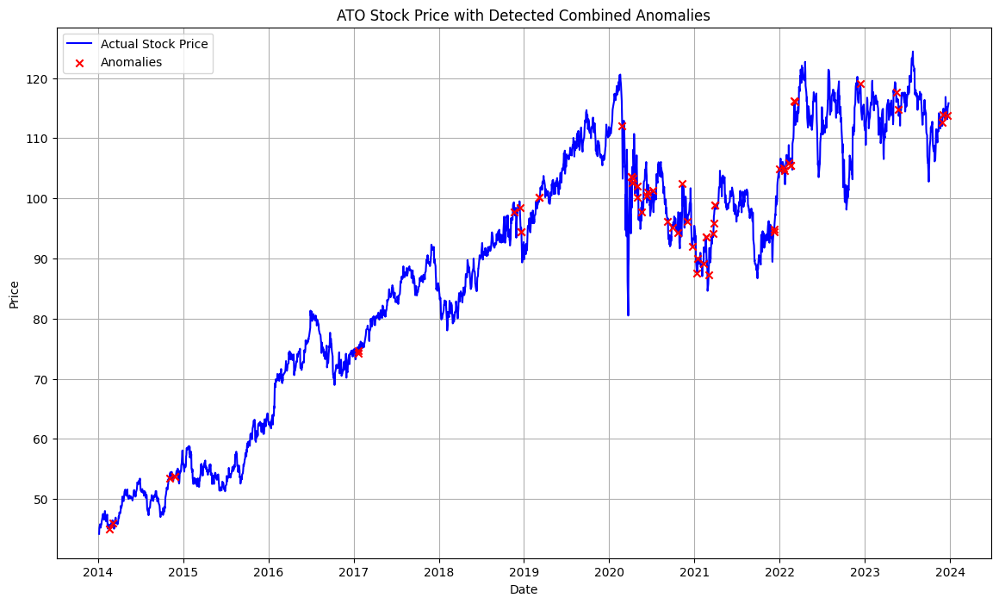

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 374.25it/s]


Combined Score Threshold: 0.2665273058044181


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2057.56it/s]


Sequence 0 is anomalous with combined score 0.26727344158975613
Sequence 2 is anomalous with combined score 0.29213241023223757
Sequence 3 is anomalous with combined score 0.5021677621568535
Sequence 4 is anomalous with combined score 0.4000943482312128
Sequence 12 is anomalous with combined score 0.34727582629995923
Sequence 13 is anomalous with combined score 0.39921214071112976
Sequence 14 is anomalous with combined score 0.3048014829321435
Sequence 31 is anomalous with combined score 0.2705695921286104
Sequence 72 is anomalous with combined score 0.4957743951153305
Sequence 73 is anomalous with combined score 0.5560035388368648
Sequence 74 is anomalous with combined score 0.27449242196364826
Sequence 75 is anomalous with combined score 0.2684099023503774
Sequence 101 is anomalous with combined score 0.5882459349635263
Sequence 102 is anomalous with combined score 0.9679175865684787
Sequence 103 is anomalous with combined score 0.6201620575232176
Sequence 104 is anomalous with combi

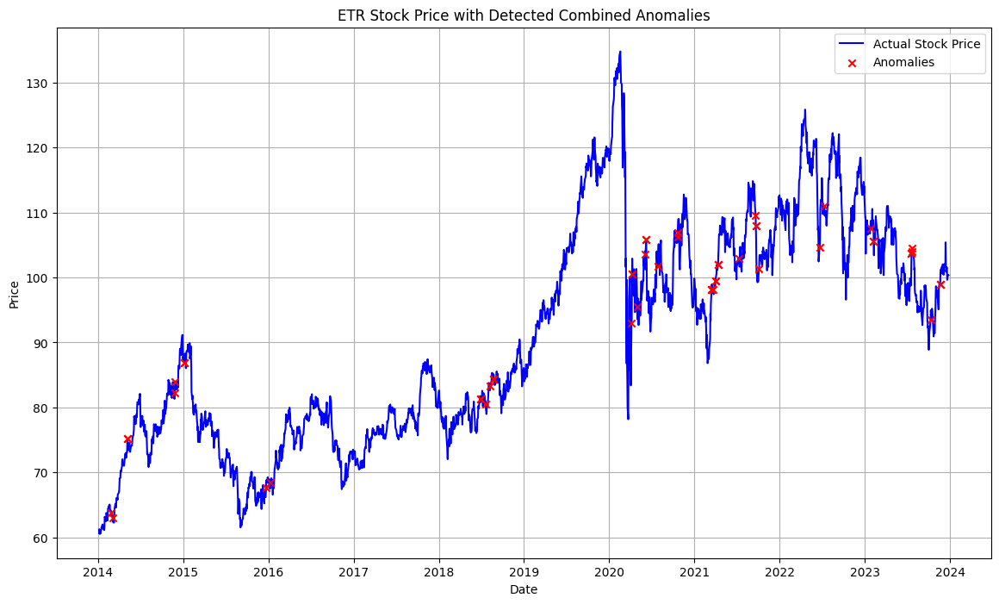

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 421.95it/s]


Combined Score Threshold: 0.14821506953232977


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2004.98it/s]


Sequence 12 is anomalous with combined score 0.15818022543076796
Sequence 44 is anomalous with combined score 0.19848578349052245
Sequence 45 is anomalous with combined score 0.16902981584255977
Sequence 59 is anomalous with combined score 0.16452697702895014
Sequence 66 is anomalous with combined score 0.15837081384931942
Sequence 67 is anomalous with combined score 0.16435334952346412
Sequence 95 is anomalous with combined score 0.20137122475741523
Sequence 96 is anomalous with combined score 0.19749245185856665
Sequence 101 is anomalous with combined score 0.5718310175075048
Sequence 102 is anomalous with combined score 0.9999929233312986
Sequence 103 is anomalous with combined score 0.6130841576091179
Sequence 104 is anomalous with combined score 0.25237094500697566
Sequence 105 is anomalous with combined score 0.22772791768744582
Sequence 106 is anomalous with combined score 0.21055315232126964
Sequence 107 is anomalous with combined score 0.16006453768470982
Sequence 111 is anoma

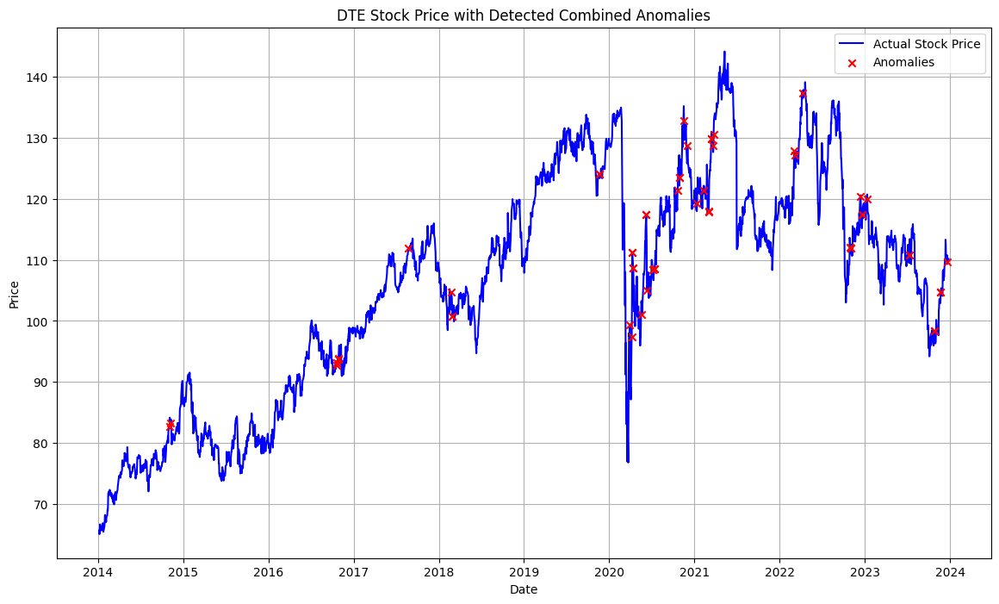

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.51it/s]


Combined Score Threshold: 0.269699315374294


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1610.53it/s]


Sequence 9 is anomalous with combined score 0.2949033674210354
Sequence 10 is anomalous with combined score 0.3104660293869746
Sequence 11 is anomalous with combined score 0.2711960303941355
Sequence 20 is anomalous with combined score 0.31127854219457535
Sequence 21 is anomalous with combined score 0.3046680701532298
Sequence 24 is anomalous with combined score 0.3028411274495274
Sequence 25 is anomalous with combined score 0.39631178105831755
Sequence 31 is anomalous with combined score 0.30471854123070374
Sequence 32 is anomalous with combined score 0.3581566046199507
Sequence 33 is anomalous with combined score 0.29495461759590186
Sequence 34 is anomalous with combined score 0.2960238458942462
Sequence 47 is anomalous with combined score 0.2736070782668276
Sequence 68 is anomalous with combined score 0.3000255850925161
Sequence 69 is anomalous with combined score 0.2839480936204816
Sequence 78 is anomalous with combined score 0.3042236309040785
Sequence 79 is anomalous with combine

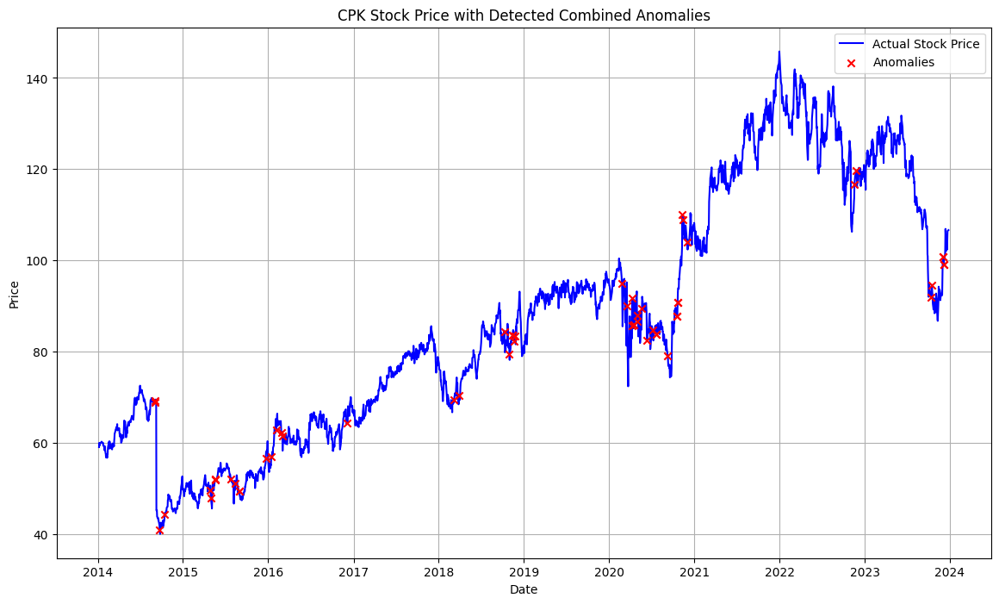

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 428.55it/s]


Combined Score Threshold: 0.3418871571074961


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2060.87it/s]


Sequence 12 is anomalous with combined score 0.38894794313678605
Sequence 13 is anomalous with combined score 0.3649884224836795
Sequence 29 is anomalous with combined score 0.3932832806568362
Sequence 30 is anomalous with combined score 0.3825645937100044
Sequence 33 is anomalous with combined score 0.45438545088645066
Sequence 34 is anomalous with combined score 0.4771780602436223
Sequence 67 is anomalous with combined score 0.4638773450586938
Sequence 68 is anomalous with combined score 0.35766883251553827
Sequence 77 is anomalous with combined score 0.3526026956385069
Sequence 78 is anomalous with combined score 0.3849725295924693
Sequence 79 is anomalous with combined score 0.4465710398085041
Sequence 80 is anomalous with combined score 0.4186324036636325
Sequence 96 is anomalous with combined score 0.6250872821364863
Sequence 97 is anomalous with combined score 0.6580830912972306
Sequence 101 is anomalous with combined score 0.6790586135470691
Sequence 102 is anomalous with combi

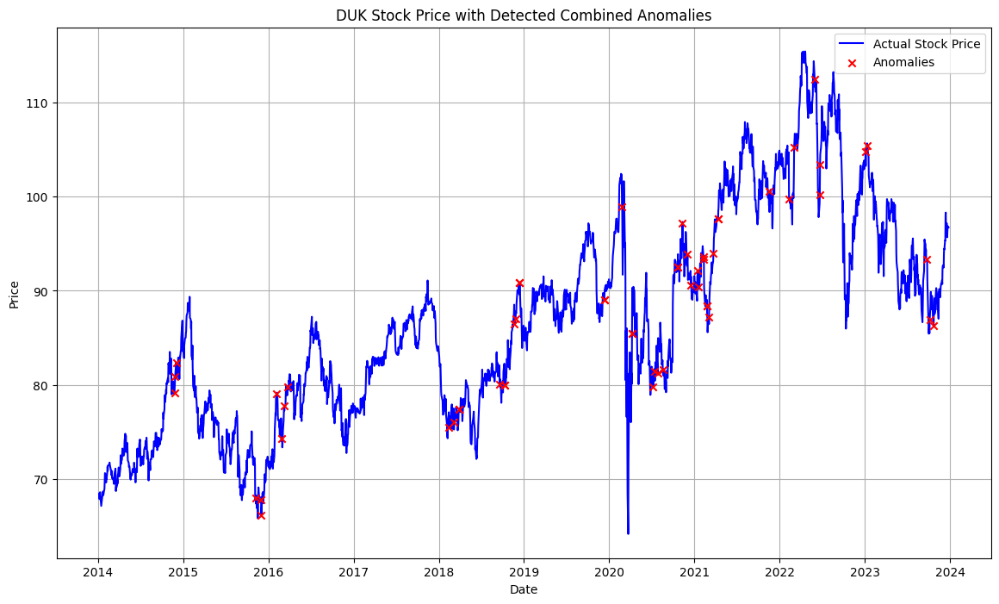

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 423.48it/s]


Combined Score Threshold: 0.2144173842538144


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2097.84it/s]


Sequence 1 is anomalous with combined score 0.3290902622762445
Sequence 2 is anomalous with combined score 0.3766000544515157
Sequence 3 is anomalous with combined score 0.21987579039148053
Sequence 11 is anomalous with combined score 0.3201635395769354
Sequence 12 is anomalous with combined score 0.3149733266163755
Sequence 16 is anomalous with combined score 0.2606942870217026
Sequence 17 is anomalous with combined score 0.25904331622790083
Sequence 18 is anomalous with combined score 0.26306328812111657
Sequence 21 is anomalous with combined score 0.2530459488399328
Sequence 31 is anomalous with combined score 0.25379757060341257
Sequence 32 is anomalous with combined score 0.33164270965387366
Sequence 33 is anomalous with combined score 0.27677177947970555
Sequence 79 is anomalous with combined score 0.24992810807556332
Sequence 80 is anomalous with combined score 0.3252646530485625
Sequence 101 is anomalous with combined score 0.6046704804529373
Sequence 102 is anomalous with comb

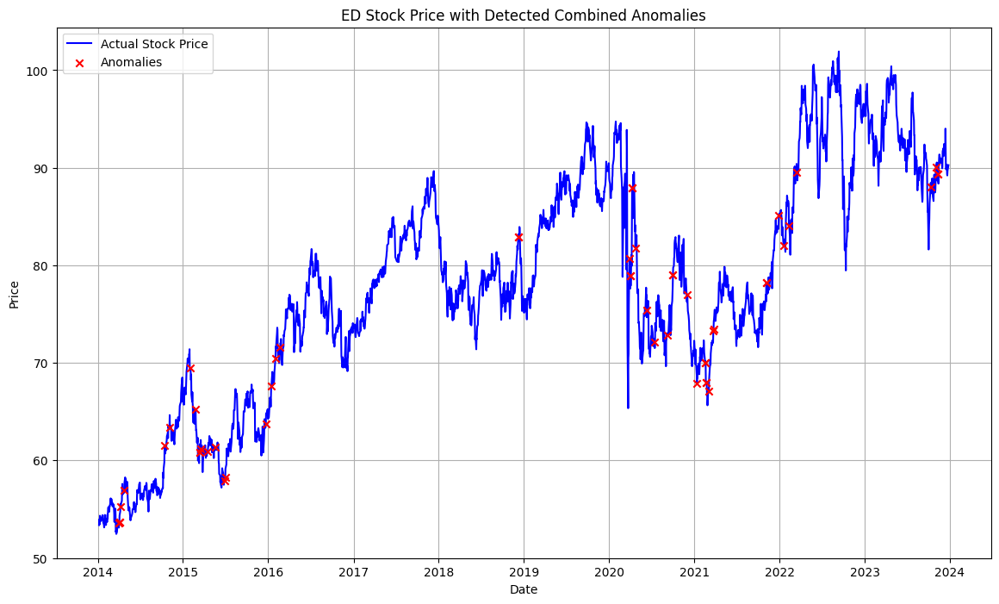

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 424.50it/s]


Combined Score Threshold: 0.314442587064699


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2083.92it/s]


Sequence 11 is anomalous with combined score 0.31504972774942597
Sequence 32 is anomalous with combined score 0.3181278800257379
Sequence 50 is anomalous with combined score 0.3153393312057244
Sequence 51 is anomalous with combined score 0.3214712841519623
Sequence 58 is anomalous with combined score 0.35561084635186047
Sequence 76 is anomalous with combined score 0.3339018415335651
Sequence 89 is anomalous with combined score 0.5794810618108922
Sequence 90 is anomalous with combined score 0.6233042649194123
Sequence 101 is anomalous with combined score 0.3247387163619635
Sequence 102 is anomalous with combined score 0.6505103002127428
Sequence 103 is anomalous with combined score 0.5765743368317606
Sequence 104 is anomalous with combined score 0.3480012016333175
Sequence 110 is anomalous with combined score 0.35079901064051666
Sequence 111 is anomalous with combined score 0.35408399072405916
Sequence 114 is anomalous with combined score 0.3676862413551763
Sequence 115 is anomalous wit

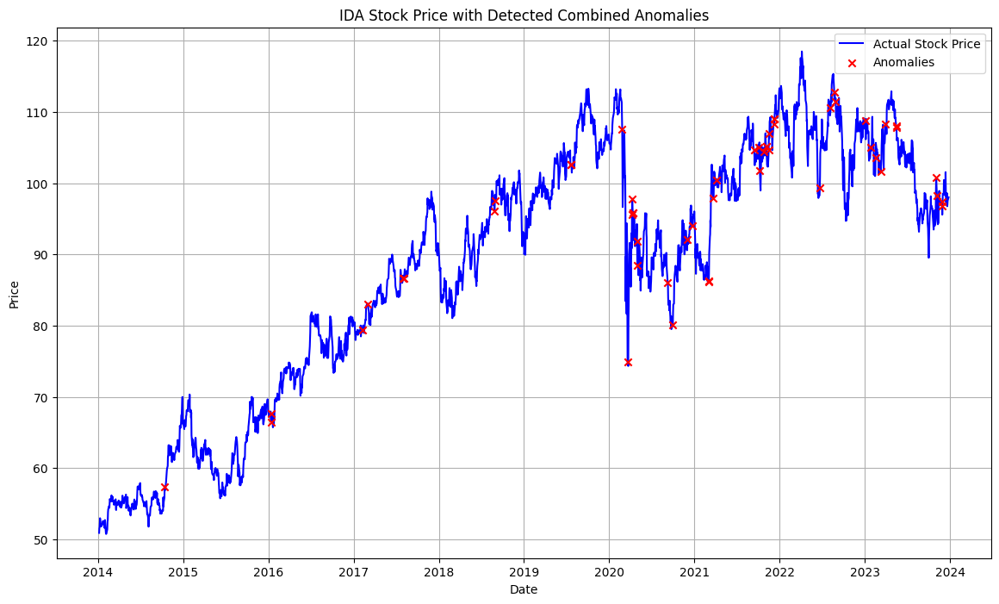

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 403.85it/s]


Combined Score Threshold: 0.22319405756392616


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2043.57it/s]


Sequence 32 is anomalous with combined score 0.2610200810655446
Sequence 33 is anomalous with combined score 0.28859462998659435
Sequence 66 is anomalous with combined score 0.34376898959519225
Sequence 67 is anomalous with combined score 0.2781937301007484
Sequence 73 is anomalous with combined score 0.22319638704403266
Sequence 101 is anomalous with combined score 0.5681843115834284
Sequence 102 is anomalous with combined score 0.9999904375441828
Sequence 103 is anomalous with combined score 0.5630325834505726
Sequence 104 is anomalous with combined score 0.2731123240406347
Sequence 105 is anomalous with combined score 0.31273976119171976
Sequence 108 is anomalous with combined score 0.37653400599279024
Sequence 109 is anomalous with combined score 0.3901161930094972
Sequence 112 is anomalous with combined score 0.23217504680834927
Sequence 113 is anomalous with combined score 0.2943587955117569
Sequence 114 is anomalous with combined score 0.28034996023841185
Sequence 115 is anomalo

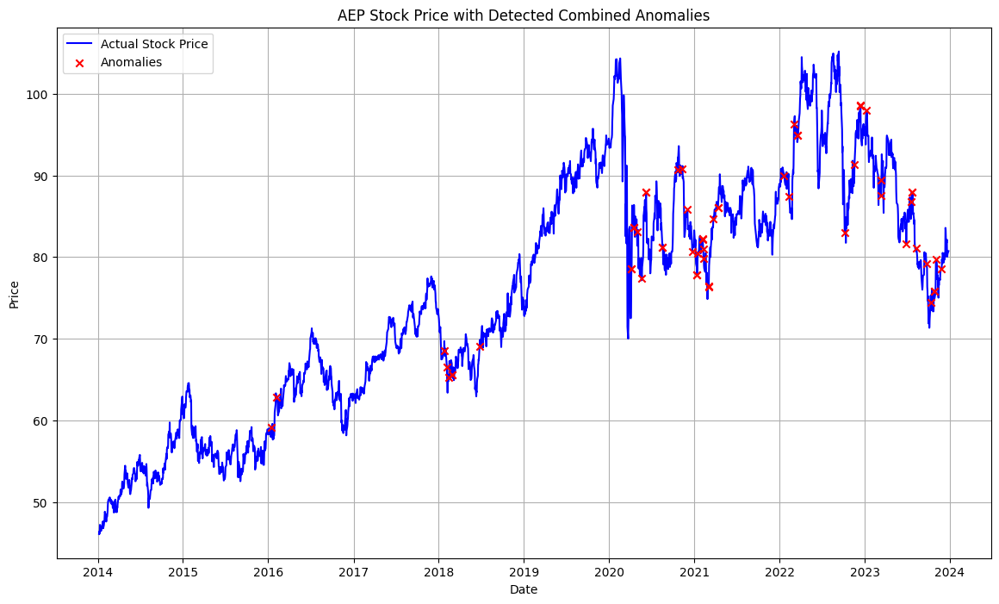

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 417.69it/s]


Combined Score Threshold: 0.23861897578448527


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1986.40it/s]


Sequence 3 is anomalous with combined score 0.2687283467015815
Sequence 4 is anomalous with combined score 0.32065022633025986
Sequence 5 is anomalous with combined score 0.37925789457234416
Sequence 6 is anomalous with combined score 0.33020804265093107
Sequence 10 is anomalous with combined score 0.2571843035451864
Sequence 11 is anomalous with combined score 0.44723708092338543
Sequence 12 is anomalous with combined score 0.3650772671323125
Sequence 22 is anomalous with combined score 0.40297192307955126
Sequence 23 is anomalous with combined score 0.47903229997931557
Sequence 25 is anomalous with combined score 0.2926540191941537
Sequence 26 is anomalous with combined score 0.32943207062025626
Sequence 32 is anomalous with combined score 0.3035038141658419
Sequence 33 is anomalous with combined score 0.32508381914837714
Sequence 50 is anomalous with combined score 0.2395272434757882
Sequence 79 is anomalous with combined score 0.39360695155468706
Sequence 80 is anomalous with combi

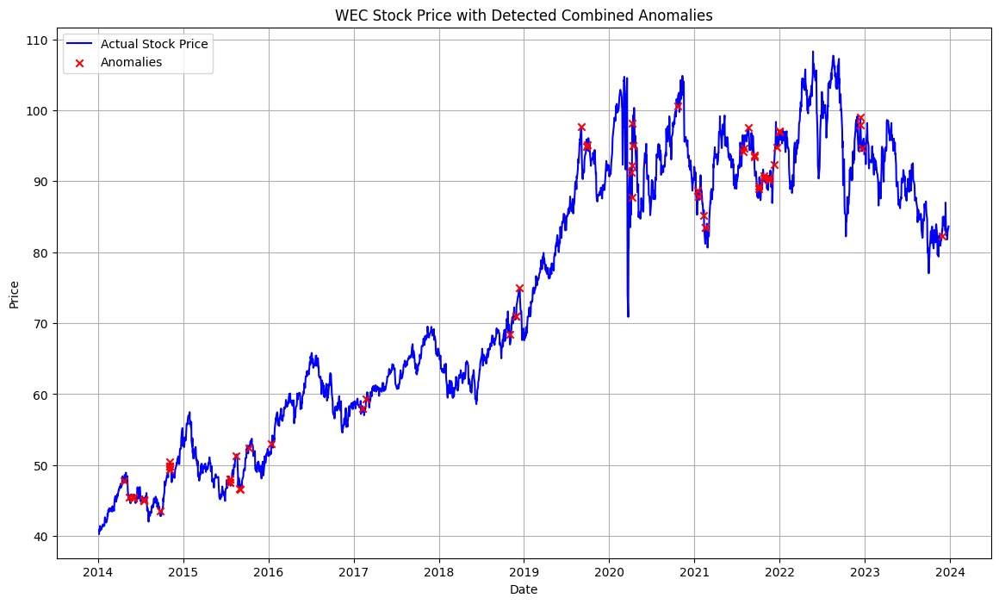

In [79]:
def sector_top_10_tickers(r3000_dreturn, GICS_Sector, residual_df, original_price):
    ticker_final = []
    ticker_temp = []
    sector = r3000_dreturn[r3000_dreturn['GICS Sector'] == GICS_Sector].sort_values(by='Price', ascending=False)
    tickers = sector['Ticker'].values
    ticker_ls = residual_df.columns
    ticker_ls_1 = original_price.columns
    
    for ticker in tickers:
        if (ticker in ticker_ls and ticker in ticker_ls_1 and len(ticker_temp)<10):
            ticker_temp.append(ticker)
    
    ticker_final.extend(ticker_temp)
    
    return ticker_final
            


    
sectors = r3000_dreturn['GICS Sector'].unique()
ticker_dict = {}

for sector in sectors:
    sector_ticker = sector_top_10_tickers(r3000_dreturn, sector, residual_df, original_price)
    ticker_dict[sector] = sector_ticker

    

    
for sector in ticker_dict.keys():
    if ticker_dict[sector] == []:
        continue
    else:
        output_file = f"anomalies_by_{sector}.xlsx"
        tickers = ticker_dict[sector]
        
        with ExcelWriter(output_file) as writer:
            for ticker in tickers:
                # Call the anomaly detection function for each ticker
                anomalies = train_combined(ticker, original_price, 80)
                anomaly_dates, anomaly_values = zip(*anomalies)
                dates, price = original_price.index, original_price[ticker]
                original_df = pd.DataFrame({'Dates': dates, 'Price': price})
                
                # Align anomalies with original dates
                anomaly_dict = {date: value for date, value in zip(anomaly_dates, anomaly_values)}
                original_df['Anomaly Values'] = original_df['Dates'].map(anomaly_dict.get)
                
                original_df.set_index('Dates', inplace=True)
                
      

                # Write the DataFrame to a new sheet named after the ticker
                original_df.to_excel(writer, sheet_name=ticker)

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.38it/s]


Combined Score Threshold: 0.33769626201003516


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2112.52it/s]


Sequence 0 is anomalous with combined score 0.455463235081553
Sequence 1 is anomalous with combined score 0.3459284482854643
Sequence 2 is anomalous with combined score 0.34455037632826574
Sequence 3 is anomalous with combined score 0.4583123523274263
Sequence 4 is anomalous with combined score 0.4170593045450228
Sequence 10 is anomalous with combined score 0.3624856946955844
Sequence 15 is anomalous with combined score 0.34912027559222586
Sequence 25 is anomalous with combined score 0.37386809131446275
Sequence 32 is anomalous with combined score 0.3440443744806398
Sequence 37 is anomalous with combined score 0.36922993823162453
Sequence 80 is anomalous with combined score 0.33829550893972354
Sequence 102 is anomalous with combined score 0.39718014140318625
Sequence 103 is anomalous with combined score 0.343138342099172
Sequence 108 is anomalous with combined score 0.33994194070276795
Sequence 109 is anomalous with combined score 0.6779222960215111
Sequence 110 is anomalous with combi

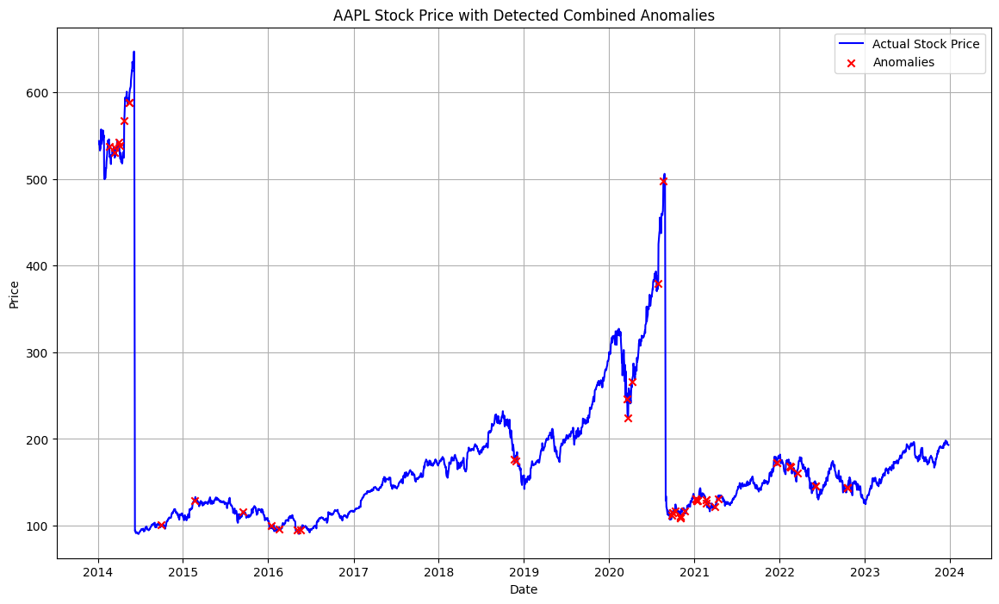

In [80]:
anomalies = train_combined('AAPL', original_price, 80)
anomaly_dates, anomaly_values = zip(*anomalies)
dates, price = original_price.index, original_price[ticker]
original_df = pd.DataFrame({'Dates': dates, 'Price': price})

# Align anomalies with original dates
anomaly_dict = {date: value for date, value in zip(anomaly_dates, anomaly_values)}
original_df['Anomaly Values'] = original_df['Dates'].map(anomaly_dict.get)

original_df.set_index('Dates', inplace=True)



# Write the DataFrame to a new sheet named after the ticker
original_df

In [82]:
original_df.to_excel('APPLE.xlsx')

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 405.58it/s]


Combined Score Threshold: 0.2557621305161281


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1792.21it/s]


Sequence 26 is anomalous with combined score 0.2905475071918133
Sequence 27 is anomalous with combined score 0.2998910993670009
Sequence 28 is anomalous with combined score 0.28627346736039805
Sequence 33 is anomalous with combined score 0.29418728224414126
Sequence 42 is anomalous with combined score 0.5349139633032277
Sequence 43 is anomalous with combined score 0.5494498540146656
Sequence 91 is anomalous with combined score 0.27587910967457635
Sequence 101 is anomalous with combined score 0.31083873887552227
Sequence 102 is anomalous with combined score 0.5887418650652536
Sequence 103 is anomalous with combined score 0.49265047955843927
Sequence 104 is anomalous with combined score 0.28679340186987706
Sequence 105 is anomalous with combined score 0.2796077031160096
Sequence 113 is anomalous with combined score 0.29518304435232323
Sequence 117 is anomalous with combined score 0.27062292777487906
Sequence 130 is anomalous with combined score 0.27548615908883967
Sequence 135 is anomalo

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 419.27it/s]


Combined Score Threshold: 0.2236002748605688


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2011.56it/s]


Sequence 24 is anomalous with combined score 0.31279897106735793
Sequence 25 is anomalous with combined score 0.3170270848838169
Sequence 33 is anomalous with combined score 0.2563280439548307
Sequence 41 is anomalous with combined score 0.25824517015897785
Sequence 90 is anomalous with combined score 0.22736524699706875
Sequence 91 is anomalous with combined score 0.5331418739941453
Sequence 92 is anomalous with combined score 0.6085945714474574
Sequence 93 is anomalous with combined score 0.4399361909225009
Sequence 94 is anomalous with combined score 0.32393790139744283
Sequence 101 is anomalous with combined score 0.4188122044845291
Sequence 102 is anomalous with combined score 0.8645881001300779
Sequence 103 is anomalous with combined score 0.687521293485694
Sequence 104 is anomalous with combined score 0.2360856126884082
Sequence 106 is anomalous with combined score 0.22481926315412062
Sequence 109 is anomalous with combined score 0.26924413907440103
Sequence 110 is anomalous wit

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 391.72it/s]


Combined Score Threshold: 0.13424978788400016


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1858.09it/s]


Sequence 5 is anomalous with combined score 0.15388123311596347
Sequence 25 is anomalous with combined score 0.1438257387039818
Sequence 32 is anomalous with combined score 0.1734809338675486
Sequence 33 is anomalous with combined score 0.34315956183374874
Sequence 34 is anomalous with combined score 0.32299285452262283
Sequence 37 is anomalous with combined score 0.17206729026309947
Sequence 38 is anomalous with combined score 0.37300981212748774
Sequence 39 is anomalous with combined score 0.2840678857500183
Sequence 46 is anomalous with combined score 0.21794681779937286
Sequence 47 is anomalous with combined score 0.2371991626099161
Sequence 49 is anomalous with combined score 0.5173777427449657
Sequence 50 is anomalous with combined score 0.6074455825381363
Sequence 51 is anomalous with combined score 0.5077681833580243
Sequence 52 is anomalous with combined score 0.5441942589414501
Sequence 53 is anomalous with combined score 0.2646356480664921
Sequence 54 is anomalous with combi

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 353.08it/s]


Combined Score Threshold: 0.29530425572803876


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1992.82it/s]


Sequence 0 is anomalous with combined score 0.5304321419813575
Sequence 1 is anomalous with combined score 0.3336260728211494
Sequence 2 is anomalous with combined score 0.535075378703781
Sequence 3 is anomalous with combined score 0.5902294812534516
Sequence 4 is anomalous with combined score 0.3406291921710976
Sequence 7 is anomalous with combined score 0.38116689388805697
Sequence 12 is anomalous with combined score 0.3041266775596426
Sequence 15 is anomalous with combined score 0.3556994498172285
Sequence 27 is anomalous with combined score 0.34674561739059373
Sequence 28 is anomalous with combined score 0.3220304311342736
Sequence 54 is anomalous with combined score 0.3086880235001459
Sequence 55 is anomalous with combined score 0.31405063860864263
Sequence 66 is anomalous with combined score 0.3886130182393236
Sequence 67 is anomalous with combined score 0.4555147834198251
Sequence 68 is anomalous with combined score 0.3338349126585576
Sequence 69 is anomalous with combined score

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 408.36it/s]


Combined Score Threshold: 0.32525907136217974


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1775.51it/s]


Sequence 2 is anomalous with combined score 0.3720000220175492
Sequence 3 is anomalous with combined score 0.405234719266203
Sequence 11 is anomalous with combined score 0.5498547337923991
Sequence 12 is anomalous with combined score 0.43551530011849304
Sequence 17 is anomalous with combined score 0.363959424207682
Sequence 18 is anomalous with combined score 0.6117315519894942
Sequence 19 is anomalous with combined score 0.49197101390058473
Sequence 20 is anomalous with combined score 0.3511626588766512
Sequence 21 is anomalous with combined score 0.3375333346949389
Sequence 25 is anomalous with combined score 0.3977637838565665
Sequence 26 is anomalous with combined score 0.47488949900327204
Sequence 27 is anomalous with combined score 0.38016009067890066
Sequence 28 is anomalous with combined score 0.3440473327359608
Sequence 29 is anomalous with combined score 0.36204299734304485
Sequence 30 is anomalous with combined score 0.3527061278201423
Sequence 31 is anomalous with combined 

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 408.65it/s]


Combined Score Threshold: 0.1839557784820704


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2035.67it/s]


Sequence 6 is anomalous with combined score 0.2187338721571777
Sequence 28 is anomalous with combined score 0.19839158844415755
Sequence 30 is anomalous with combined score 0.19918903715170844
Sequence 40 is anomalous with combined score 0.1892436792403006
Sequence 63 is anomalous with combined score 0.18646476093316333
Sequence 67 is anomalous with combined score 0.1887591875975781
Sequence 68 is anomalous with combined score 0.19627216204615341
Sequence 102 is anomalous with combined score 0.4050534262991709
Sequence 103 is anomalous with combined score 0.35285173314758855
Sequence 104 is anomalous with combined score 0.22448509613627118
Sequence 105 is anomalous with combined score 0.23681501050958298
Sequence 108 is anomalous with combined score 0.20444585789119346
Sequence 109 is anomalous with combined score 0.20377283098596902
Sequence 110 is anomalous with combined score 0.19053740766063096
Sequence 111 is anomalous with combined score 0.2570014355460751
Sequence 112 is anomalo

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 420.34it/s]


Combined Score Threshold: 0.2985164565608317


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 2020.70it/s]


Sequence 0 is anomalous with combined score 0.3083459894006946
Sequence 2 is anomalous with combined score 0.5178261737402188
Sequence 3 is anomalous with combined score 0.4069907657060561
Sequence 4 is anomalous with combined score 0.35498131490322504
Sequence 5 is anomalous with combined score 0.32386122655992877
Sequence 10 is anomalous with combined score 0.47678767716965
Sequence 11 is anomalous with combined score 0.6409301174460478
Sequence 12 is anomalous with combined score 0.4242000099604978
Sequence 13 is anomalous with combined score 0.43580876659571777
Sequence 14 is anomalous with combined score 0.5040315259201421
Sequence 15 is anomalous with combined score 0.3170238441987434
Sequence 24 is anomalous with combined score 0.4221994005564048
Sequence 25 is anomalous with combined score 0.5115589357795896
Sequence 26 is anomalous with combined score 0.6699967073286346
Sequence 27 is anomalous with combined score 0.7083951891936626
Sequence 28 is anomalous with combined score

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 385.21it/s]


Combined Score Threshold: 0.4349233431908305


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1977.12it/s]


Sequence 11 is anomalous with combined score 0.4674384781383327
Sequence 12 is anomalous with combined score 0.48800785167116384
Sequence 13 is anomalous with combined score 0.506548094641041
Sequence 14 is anomalous with combined score 0.515170251307777
Sequence 15 is anomalous with combined score 0.46011182936744244
Sequence 25 is anomalous with combined score 0.48923821229296005
Sequence 26 is anomalous with combined score 0.5265173047521233
Sequence 27 is anomalous with combined score 0.43742565184669596
Sequence 29 is anomalous with combined score 0.5092678509556211
Sequence 30 is anomalous with combined score 0.47895120451244916
Sequence 32 is anomalous with combined score 0.5336182144065822
Sequence 33 is anomalous with combined score 0.6360204206732121
Sequence 34 is anomalous with combined score 0.5158228051070477
Sequence 35 is anomalous with combined score 0.4373574576504564
Sequence 36 is anomalous with combined score 0.4701952145248278
Sequence 37 is anomalous with combine

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 388.63it/s]


Combined Score Threshold: 0.41495752068250424


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1842.40it/s]


Sequence 24 is anomalous with combined score 0.5903263615489778
Sequence 25 is anomalous with combined score 0.8166499034593634
Sequence 26 is anomalous with combined score 0.9300722777907456
Sequence 27 is anomalous with combined score 0.7795260138407394
Sequence 28 is anomalous with combined score 0.6242677287921927
Sequence 29 is anomalous with combined score 0.5266094306030579
Sequence 30 is anomalous with combined score 0.5361461685227994
Sequence 31 is anomalous with combined score 0.5502508897925036
Sequence 32 is anomalous with combined score 0.8017240149486667
Sequence 33 is anomalous with combined score 0.8578677261093323
Sequence 34 is anomalous with combined score 0.5909064568373359
Sequence 36 is anomalous with combined score 0.4752413655927851
Sequence 37 is anomalous with combined score 0.5094165860741973
Sequence 40 is anomalous with combined score 0.513371202397371
Sequence 44 is anomalous with combined score 0.4159970574329066
Sequence 45 is anomalous with combined sc

Evaluating Rolling Windows: 100%|████████████| 165/165 [00:00<00:00, 407.48it/s]


Combined Score Threshold: 0.1927004292423521


Identifying Combined Anomalies: 100%|███████| 165/165 [00:00<00:00, 1528.60it/s]


Sequence 30 is anomalous with combined score 0.20206481250441094
Sequence 33 is anomalous with combined score 0.28186042697754615
Sequence 34 is anomalous with combined score 0.7477093586515409
Sequence 35 is anomalous with combined score 0.6365635794163226
Sequence 46 is anomalous with combined score 0.21724225443383502
Sequence 65 is anomalous with combined score 0.25314510177242133
Sequence 66 is anomalous with combined score 0.22860680142169804
Sequence 101 is anomalous with combined score 0.3708278939418348
Sequence 102 is anomalous with combined score 0.6876579546504643
Sequence 103 is anomalous with combined score 0.46645456888517767
Sequence 104 is anomalous with combined score 0.23001822158012047
Sequence 105 is anomalous with combined score 0.29319169311740767
Sequence 106 is anomalous with combined score 0.22962850303249027
Sequence 109 is anomalous with combined score 0.20794612955082373
Sequence 113 is anomalous with combined score 0.21341814096844994
Sequence 117 is anoma

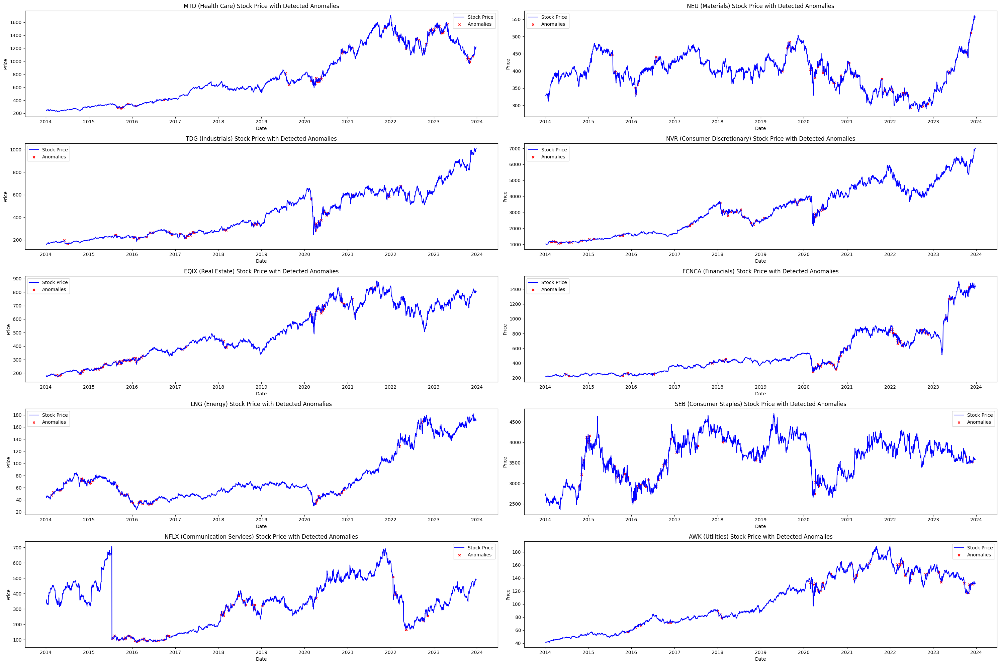

In [91]:
ticker_dict_temp = ticker_dict.copy()
del ticker_dict_temp['Information Technology']

fig, axs = plt.subplots(5, 2, figsize=(30, 20))  # Create a grid of 5x2 subplots

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each sector and corresponding subplot
for i, sector in enumerate(ticker_dict_temp.keys()):
#     if sector == 'Information Technology':  # Skip this sector as specified
#         continue
    
    # Get the first ticker for the sector
    ticker = ticker_dict_temp[sector][0]
    
    # Get the anomalies and plot on the specific subplot
    anomalies = train_combined(ticker, original_price, 80)
    anomaly_dates, anomaly_values = zip(*anomalies)
    dates, price = original_price.index, original_price[ticker]
    print(price)
    # Customize the subplot
    axs[i].plot(dates, price, color='blue', label='Stock Price')
    axs[i].scatter(anomaly_dates, anomaly_values, color='red', label='Anomalies', marker='x', s=20)
    
    axs[i].set_title(f"{ticker} ({sector}) Stock Price with Detected Anomalies")
    axs[i].set_xlabel("Date")
    axs[i].set_ylabel("Price")
    axs[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
output_file = "stock_anomalies_by_sector.png"
# plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()

# Model_2_isolation forest

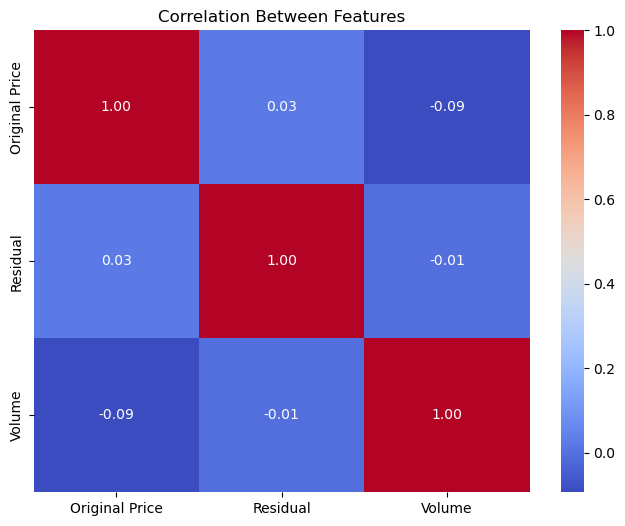

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import ParameterGrid
import statsmodels.api as sm
from pandas import ExcelWriter

original_price = ori_copy
volume_df = vol_copy
residual_df = resi_copy

original_price_temp = original_price.loc[:, residual_df.columns]
volume_df_temp = volume_df.loc[:, residual_df.columns]

corr_original_volume = volume_df_temp.corrwith(original_price_temp).mean()
corr_original_residual = original_price_temp.corrwith(residual_df).mean()
corr_volume_residual = volume_df_temp.corrwith(residual_df).mean()

data = {
    'Original Price': [1, corr_original_residual, corr_original_volume],
    'Residual': [corr_original_residual, 1, corr_volume_residual],
    'Volume': [corr_original_volume, corr_volume_residual, 1]
}

corr_df = pd.DataFrame(data, index=['Original Price', 'Residual', 'Volume'])

# Plotting the correlation heatmap between each feature
plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Between Features')
output_file = "features_correlation.png"
#plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()

In [23]:
def detect_anomalies(residual_data, price_data, volume_data, stock_column, 
                     window_size=120, test_window_size=20, step_size=20, contamination=0.01, show=False, save=False):
    
    # Calculate training windows
    total_window = window_size + test_window_size
    max_train_start = len(residual_data) - total_window
    train_starts = np.arange(0, max_train_start + 1, step_size)

    if max_train_start not in train_starts:
        train_starts = np.append(train_starts, max_train_start)
    
    # Initialize the Isolation Forest
    model = IsolationForest(n_estimators=100, contamination=contamination, random_state=42)

    # Track anomalies
    anomalies = []  

    # Rolling training and testing loop
    for train_start in train_starts:
        train_end = train_start + window_size
        if train_end > len(residual_data):
            train_end = len(residual_data)

        # Select training data
        adjusted_return_train = residual_data.iloc[train_start:train_end][stock_column].values.reshape(-1, 1)
        price_train = price_data.iloc[train_start:train_end][stock_column].values.reshape(-1, 1)
        volume_train = volume_data.iloc[train_start:train_end][stock_column].values.reshape(-1, 1)
        train_data = np.hstack((adjusted_return_train, price_train, volume_train))
        model.fit(train_data)

        # Testing window
        test_start = train_end
        test_end = test_start + test_window_size
        if test_end > len(residual_data):
            test_end = len(residual_data)
        
        # Select testing data
        adjusted_return_test = residual_data.iloc[test_start:test_end][stock_column].values.reshape(-1, 1)
        price_test = price_data.iloc[test_start:test_end][stock_column].values.reshape(-1, 1)
        volume_test = volume_data.iloc[test_start:test_end][stock_column].values.reshape(-1, 1)
        test_data = np.hstack((adjusted_return_test, price_test, volume_test))
        test_dates = residual_data.iloc[test_start:test_end].index

        # Predict anomalies
        predictions = model.predict(test_data)
        detected_anomalies = test_dates[predictions == -1]

        # Collect anomalies
        for date in detected_anomalies:
            if date in price_data.index:  # Ensure the date exists in price_data
                anomalies.append((date, price_data.loc[date][stock_column]))
    
    # Separate anomaly dates and values for return
    if anomalies:
        anomaly_dates, anomaly_values = zip(*anomalies)
    else:
        anomaly_dates, anomaly_values = [], []

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(price_data.index, price_data[stock_column], color='blue', label='Stock Price')
    if anomalies:
        plt.scatter(anomaly_dates, anomaly_values, color='red', label='Anomalies', marker='x', s=20)
    plt.title(f"{stock_column} Stock Price with Detected Anomalies")
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    
    if save:
        filename = f"{stock_column}_anomalies.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    
    if show:
        plt.show()
    else:
        plt.close()

    return list(anomaly_dates), list(anomaly_values)


def sector_top_10_tickers(r3000_dreturn, GICS_Sector, residual_df, original_price):
    ticker_final = []
    ticker_temp = []
    sector = r3000_dreturn[r3000_dreturn['GICS Sector'] == GICS_Sector].sort_values(by='Price', ascending=False)
    tickers = sector['Ticker'].values
    ticker_ls = residual_df.columns
    ticker_ls_1 = original_price.columns
    
    for ticker in tickers:
        if (ticker in ticker_ls and ticker in ticker_ls_1 and len(ticker_temp)<10):
            ticker_temp.append(ticker)
    
    ticker_final.extend(ticker_temp)
    
    return ticker_final
            


    
sectors = r3000_dreturn['GICS Sector'].unique()
ticker_dict = {}

for sector in sectors:
    sector_ticker = sector_top_10_tickers(r3000_dreturn, sector, residual_df, original_price)
    ticker_dict[sector] = sector_ticker

    
'''
# Getting selected stocks anomalies data and save them to excel   
for sector in ticker_dict.keys():
    if ticker_dict[sector] == []:
        continue
    else:
        output_file = f"anomalies_by_{sector}.xlsx"
        tickers = ticker_dict[sector]
        
        with ExcelWriter(output_file) as writer:
            for ticker in tickers:
                # Call the anomaly detection function for each ticker
                anomaly_dates, anomaly_values = detect_anomalies(residual_df, original_price, volume_df, ticker)
                dates, price = original_price.index, original_price[ticker]
                original_df = pd.DataFrame({'Dates': dates, 'Price': price})
                
                # Align anomalies with original dates
                anomaly_dict = {date: value for date, value in zip(anomaly_dates, anomaly_values)}
                original_df['Anomaly Values'] = original_df['Dates'].map(anomaly_dict.get)
                
                original_df.set_index('Dates', inplace=True)
                
      

                # Write the DataFrame to a new sheet named after the ticker
                original_df.to_excel(writer, sheet_name=ticker)
'''
                
        



'\n# Getting selected stocks anomalies data and save them to excel   \nfor sector in ticker_dict.keys():\n    if ticker_dict[sector] == []:\n        continue\n    else:\n        output_file = f"anomalies_by_{sector}.xlsx"\n        tickers = ticker_dict[sector]\n        \n        with ExcelWriter(output_file) as writer:\n            for ticker in tickers:\n                # Call the anomaly detection function for each ticker\n                anomaly_dates, anomaly_values = detect_anomalies(residual_df, original_price, volume_df, ticker)\n                dates, price = original_price.index, original_price[ticker]\n                original_df = pd.DataFrame({\'Dates\': dates, \'Price\': price})\n                \n                # Align anomalies with original dates\n                anomaly_dict = {date: value for date, value in zip(anomaly_dates, anomaly_values)}\n                original_df[\'Anomaly Values\'] = original_df[\'Dates\'].map(anomaly_dict.get)\n                \n           

### save excel

In [ ]:
# Adding AAPL to Information Technology
'''
sector = 'Information Technology'
output_file = f"anomalies_by_{sector}.xlsx"
ticker_dict[sector].append('AAPL')
tickers = ticker_dict[sector]

with ExcelWriter(output_file) as writer:
    for ticker in tickers:
        anomaly_dates, anomaly_values = detect_anomalies(residual_df, original_price, volume_df, ticker)
        dates, price = original_price.index, original_price[ticker]
        original_df = pd.DataFrame({'Dates': dates, 'Price': price})

        anomaly_dict = {date: value for date, value in zip(anomaly_dates, anomaly_values)}
        original_df['Anomaly Values'] = original_df['Dates'].map(anomaly_dict.get)

        original_df.set_index('Dates', inplace=True)



        original_df.to_excel(writer, sheet_name=ticker)
'''

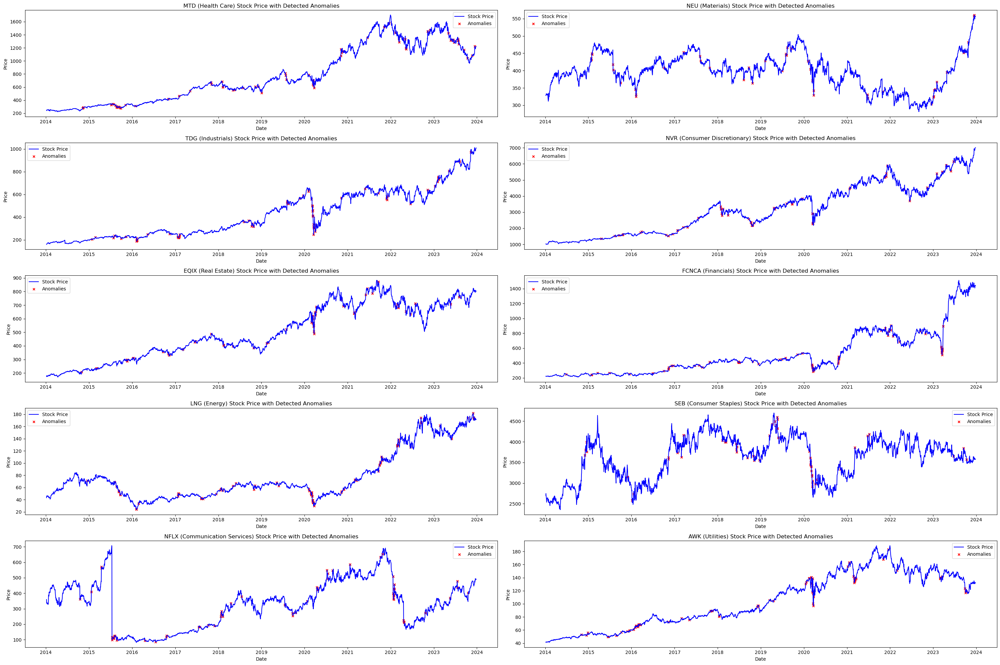

In [28]:
# Plot one stock anomalies from each sector other than Information Technology since we choose AAPL as 
# the representative stock in Information Technology

ticker_dict_temp = ticker_dict.copy()
del ticker_dict_temp['Information Technology']

fig, axs = plt.subplots(5, 2, figsize=(30, 20))  # Create a grid of 5x2 subplots

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each sector and corresponding subplot
for i, sector in enumerate(ticker_dict_temp.keys()):
    
    # Get the first ticker for the sector
    ticker = ticker_dict_temp[sector][0]
    
    # Get the anomalies and plot on the specific subplot
    anomaly_dates, anomaly_values = detect_anomalies(
        residual_df, original_price, volume_df, ticker, show=False)
    dates, price = original_price.index, original_price[ticker]
    
    axs[i].plot(dates, price, color='blue', label='Stock Price')
    axs[i].scatter(anomaly_dates, anomaly_values, color='red', label='Anomalies', marker='x', s=20)
    
    axs[i].set_title(f"{ticker} ({sector}) Stock Price with Detected Anomalies")
    axs[i].set_xlabel("Date")
    axs[i].set_ylabel("Price")
    axs[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
output_file = "stock_anomalies_by_sector.png"
#plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()

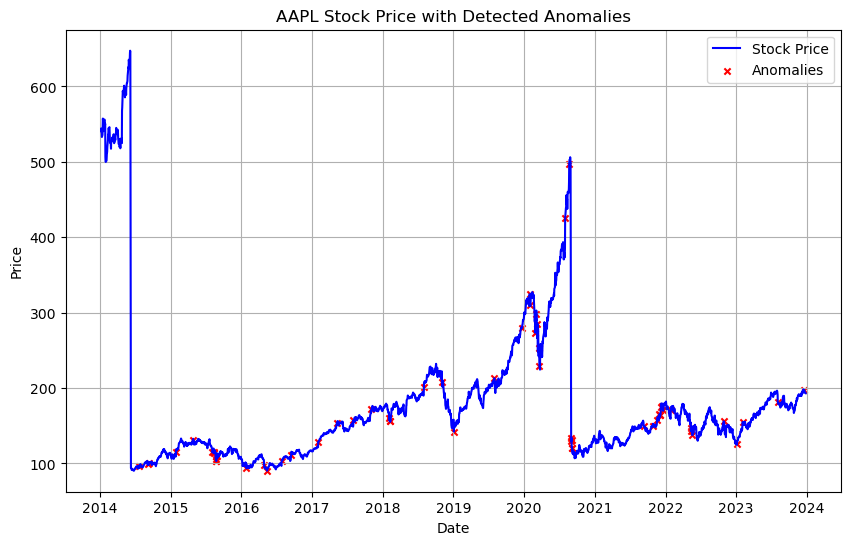

In [30]:
# Plot and Save AAPL anomalies
anomaly_dates, anomaly_values = detect_anomalies(
        residual_df, original_price, volume_df, 'AAPL', show=True, save=True)
output_file = "AAPL_anomalies.png"
#plt.savefig(output_file, dpi=300, bbox_inches='tight')
plt.show()